# Data Mining - Task 4

**Tasks Description:**



1. The first task is about supervised clustering - knowing the number of clusters. To get a practical understanding on the studied clustering algorithms, correlating the theoretical insights of each algorithm with its results in various contexts (data distributions), each of the following algorithms must be executed on each of the data sets provided, considering as known the number of clusters:
  * kMeans
  * EM for clustering under Gaussian assumptions
  * hierarchical algorithms under all known linkage metrics (single link complete link, average link, Ward variance)
  * Density-based algorithms (DBSCAN); experiment with different parameter settings to adapt to your data

  Pay attention to data normalization - given that you use a Minkowski distance metric (alternatively try the Mahalanobis distance).
  
  For each data set and each clustering algorithm, plot the clustering result (a two dimensional view of the data where data items are colored based on cluster assignments) and compute the Adjusted Rand Index - an external validation criteria that you use to compare the cluster assignments against true classes (it basically compares the agreement of two partitions). Make the analysis data-oriented (analyze each dataset in turn) such that you can conclude for each data set which was the most appropriate clustering technique; try to justify.

  For the Iris data set apply Self Organizing Maps (SOM) with at least 2 different map configurations, followed by kMeans applied on cell weights to extract 3 clusters. Visualize the distribution of the data on the map.



2. The second task is about unsupervised clustering - retrieving the natural number of clusters.

  You will work with the Iris and 2d-10c datasets for this task and two clustering algorithms: a hierarchical algorithm and kMeans.

  You will experiment with two ways to identify the natural number of clusters:
    - The elbow method
    - An internal clustering evaluation index.

  The elbow method plots a measure of cohesion of the clusters that depends on the clustering algorithm over the number of clusters in the partition; an elbow/knee is then identified.

  For kMeans the algorithm is applied several times with various numbers of clusters and the intra-class variance is plotted.

  For the hierarchical algorithm the dendrogram is cut at various levels and the values of the corresponding linkage metric are plotted.  Practically, few top values on the dendrogram are used (i.e. take the last x values in the vector giving the linkage values when joining clusters, and plot them).

  For the Iris data set the number of clusters should be varied from 2 to 10.
  
  An internal clustering evaluation index is an unsupervised quality measure; unlike Adjusted Rand Index, it does not take into account class labels. Such an index is computed for different partitions with different numbers of clusters and is maximized/minimized. For this task use the Silhouette Width Index or the CritCF index (the last one aiming at joint unsupervised clustering and feature selection).



3. The third task is to perform clustering analysis on the data set you chose for the classification task. Identify the natural number of clusters and check if the classes in data agree with natural groups by analyzing the contingency matrix and computing external validation criteria (ARI).


In [ ]:
!pip install minisom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.1-py3-none-any.whl size=10589 sha256=1f880140453ab6dd3d18a9d9f61ac4909baae0d30957d52bc5645886835e90c7
  Stored in directory: /root/.cache/pip/wheels/c7/92/d2/33bbda5f86fd8830510b16aa98c8dd420129b5cb24248fd6db
Successfully built minisom


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import animation, colors
from numpy.ma.core import ceil
from scipy.spatial import distance

from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import adjusted_rand_score
from sklearn.model_selection import train_test_split
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram

**The iris dataset analysis**

*About the dataset*

In [ ]:
iris = pd.read_csv("iris.csv", header=None);
iris.head()

,0,1,2,3,4
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [ ]:
iris.shape

(150, 5)

In [ ]:
iris.isna().sum() ## Null or missing values

0    0
1    0
2    0
3    0
4    0
dtype: int64

0    0.333333
1    0.333333
2    0.333333
Name: 4, dtype: float64


[Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2')]

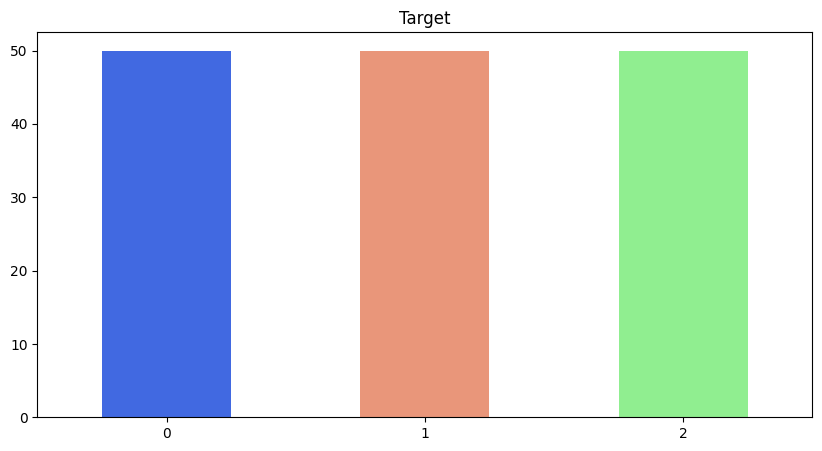

In [ ]:
## Target variable distribution

target_counts = iris.iloc[:, 4].value_counts()
target_distribution = target_counts / target_counts.sum()

print(target_distribution)

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
iris.iloc[:, 4].value_counts().plot(kind="bar", color=["royalblue", "darksalmon", "lightgreen"], ax=ax, title="Target")
ax.set_xticklabels(["0", "1", "2"], rotation=0)

*Execute the algorithms*

**K-Means**

In [ ]:
def k_means(scaler, max_iter, k):

  X = iris.iloc[:, :4]
  Y = iris.iloc[:, 4]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.7163421126838476


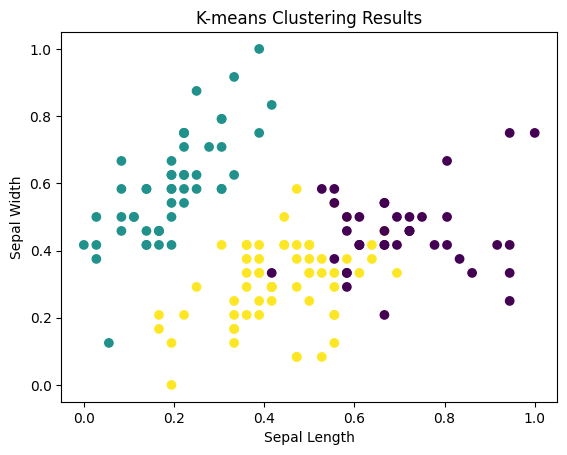

In [ ]:
## Min-Max Scaler

k_means(MinMaxScaler(), 300, 3)
# k_means(MinMaxScaler(), 500, 3)
# k_means(MinMaxScaler(), 1000, 3)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.6201351808870379


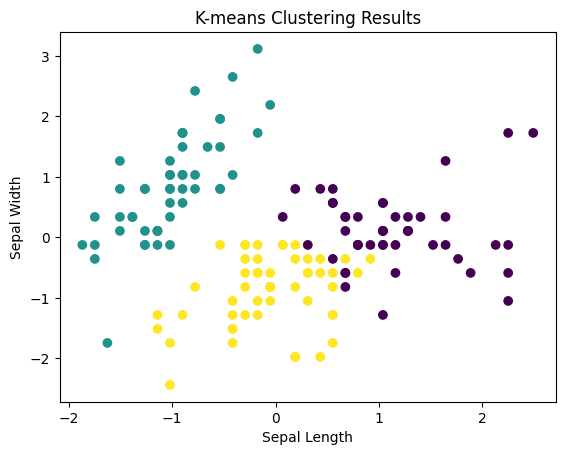

In [ ]:
## Z-Score Scaler

k_means(StandardScaler(), 300, 3)
# k_means(StandardScaler(), 500, 3)
# k_means(StandardScaler(), 1000, 3)

**EM for clustering under Gaussian assumptions**

In [ ]:
def em(scaler, max_iter, k):

  X = iris.iloc[:, :4]
  Y = iris.iloc[:, 4]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

Adjusted Rand Index: 0.9038742317748124


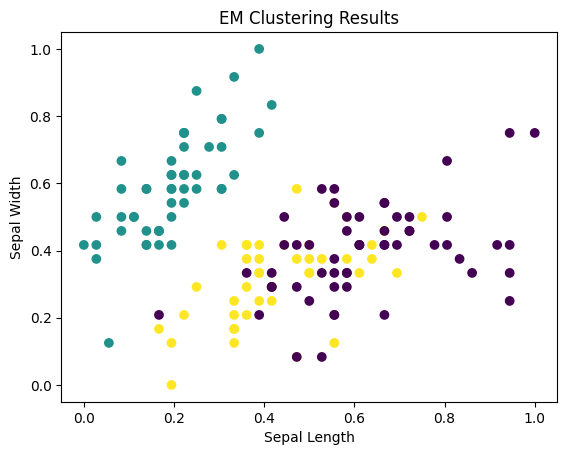

In [ ]:
## Min-Max Scaler

em(MinMaxScaler(), 100, 3)
# em(MinMaxScaler(), 500, 3)
# em(MinMaxScaler(), 1000, 3)

Adjusted Rand Index: 0.9038742317748124


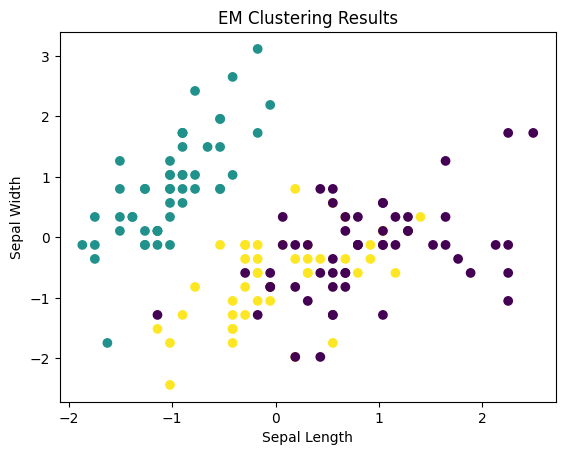

In [ ]:
## Z-Score Scaler

em(StandardScaler(), 300, 3)
# em(StandardScaler(), 500, 3)
# em(StandardScaler(), 1000, 3)

**Hierarchical algorithms**

In [ ]:
def hierarchical(scaler, method, metric, k):
  X = iris.iloc[:, :4]
  Y = iris.iloc[:, 4]

  X_scaled = scaler.fit_transform(X)

  linkage_matrix = linkage(X_scaled, method=method, metric=metric)
  labels = fcluster(linkage_matrix, k, criterion='maxclust')

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title("Hierarchical Clustering Results " + method + " link")
  plt.show()

*Single link*

Adjusted Rand Index: 0.5583714437541352


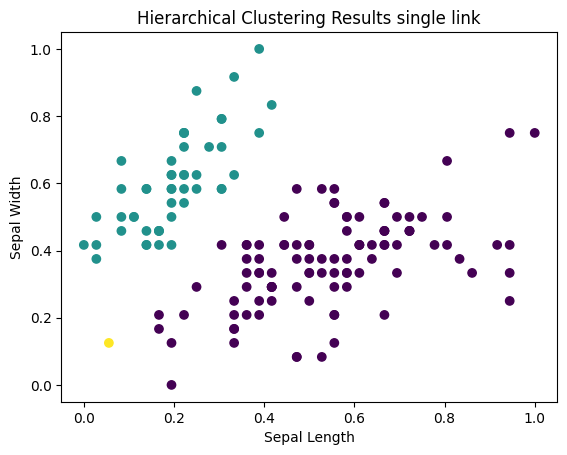

Adjusted Rand Index: 0.0001863171940630574


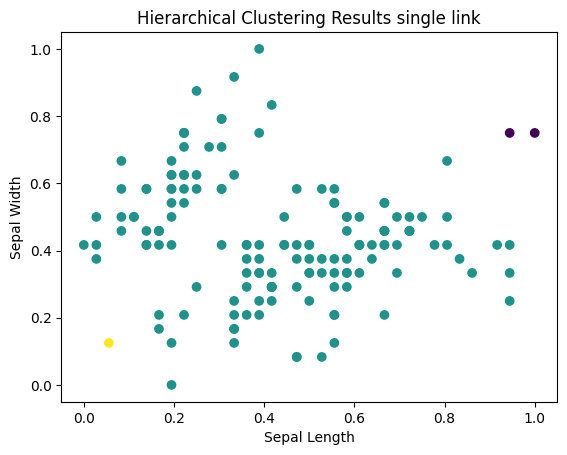

Adjusted Rand Index: 0.5583714437541352


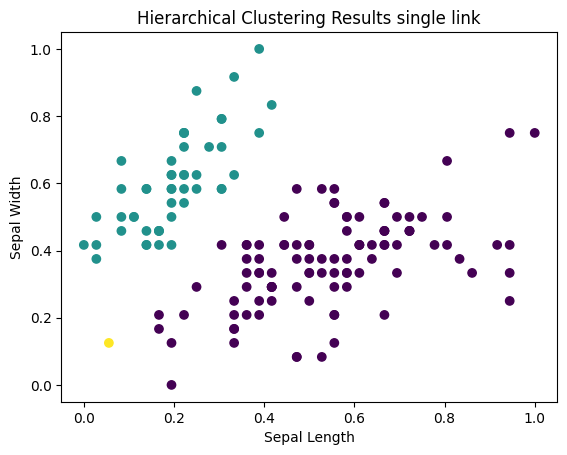

Adjusted Rand Index: 0.5583714437541352


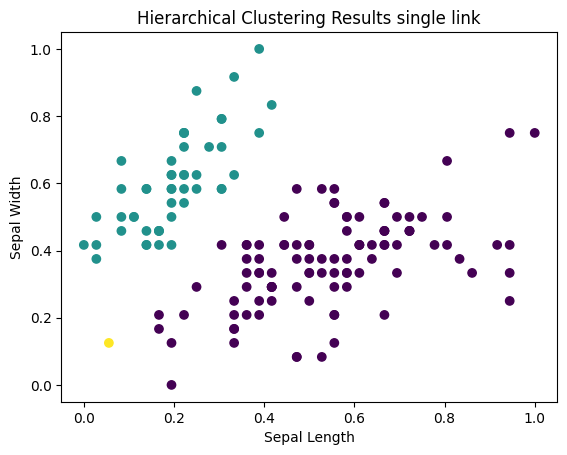

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'single', 'minkowski', 3)
hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 3)
hierarchical(MinMaxScaler(), 'single', 'chebyshev', 3)
hierarchical(MinMaxScaler(), 'single', 'cosine', 3)

Adjusted Rand Index: 0.5583714437541352


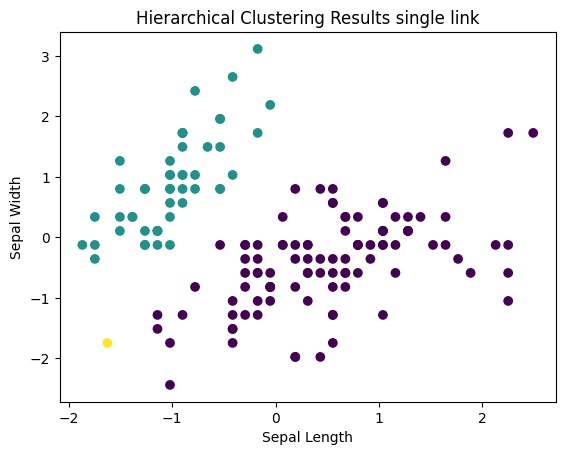

Adjusted Rand Index: 0.0001863171940630574


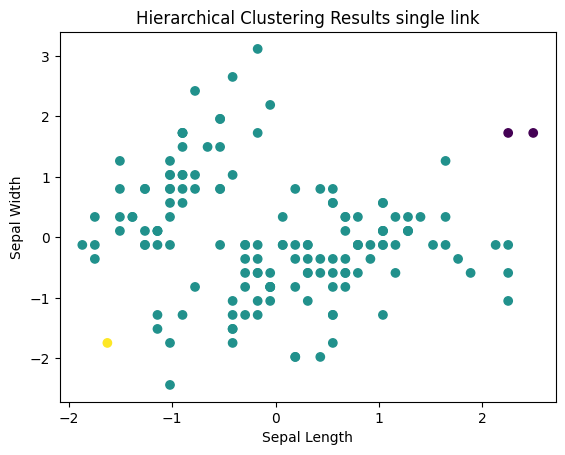

Adjusted Rand Index: 0.5583714437541352


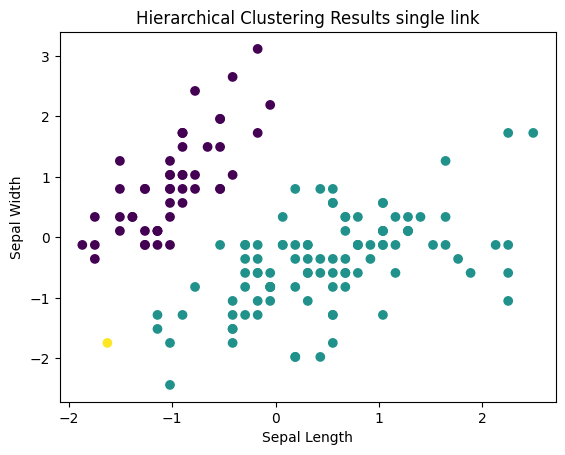

Adjusted Rand Index: 0.5413923937297748


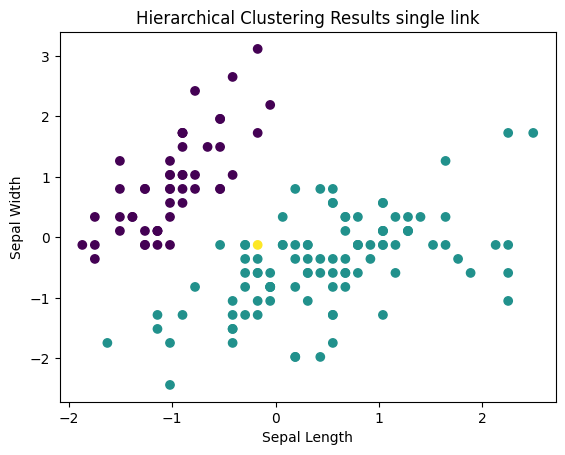

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'single', 'minkowski', 3)
hierarchical(StandardScaler(), 'single', 'mahalanobis', 3)
hierarchical(StandardScaler(), 'single', 'chebyshev', 3)
hierarchical(StandardScaler(), 'single', 'cosine', 3)

*Complete link*

Adjusted Rand Index: 0.7060059674676762


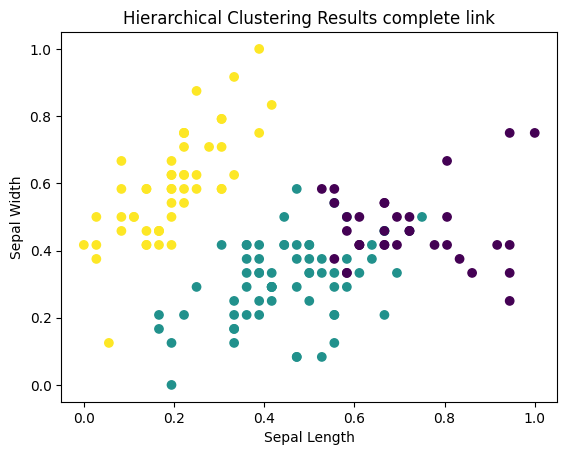

Adjusted Rand Index: 0.007996063625164267


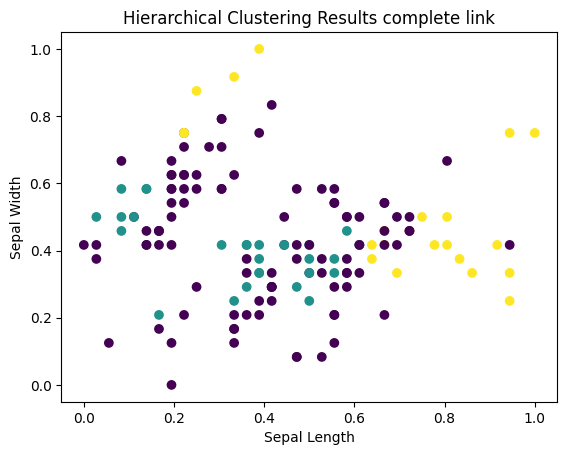

Adjusted Rand Index: 0.5503169680510004


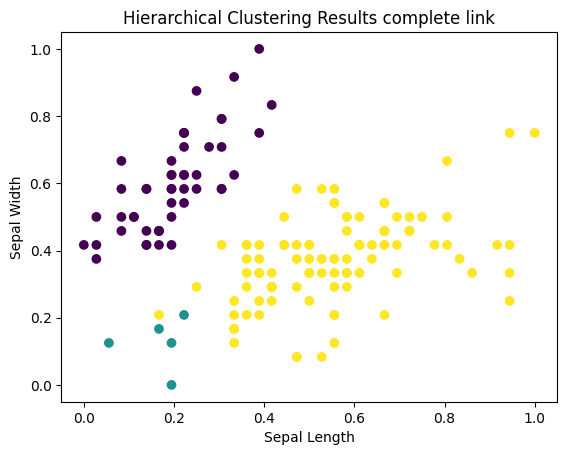

Adjusted Rand Index: 0.5583714437541352


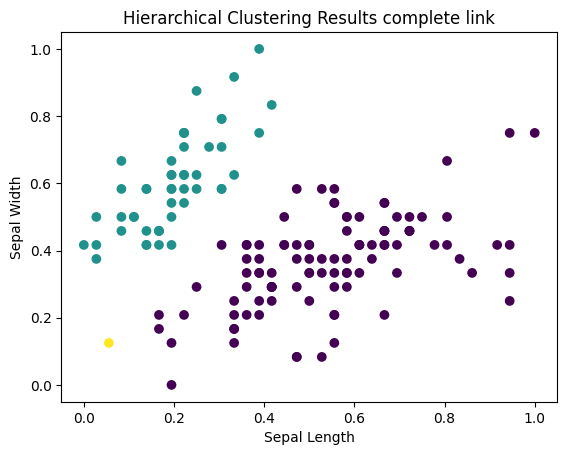

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'complete', 'minkowski', 3)
hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 3)
hierarchical(MinMaxScaler(), 'complete', 'chebyshev', 3)
hierarchical(MinMaxScaler(), 'complete', 'cosine', 3)

Adjusted Rand Index: 0.5726305793711641


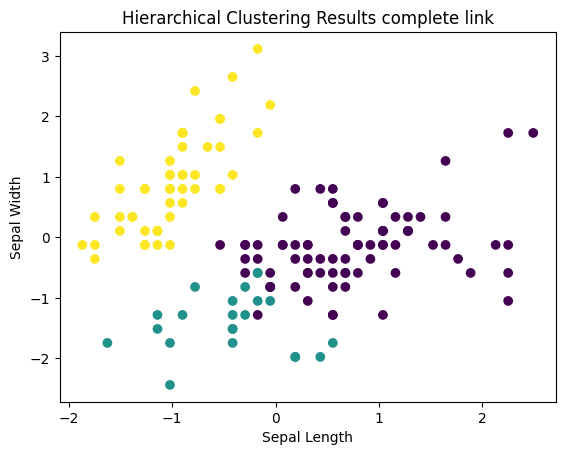

Adjusted Rand Index: 0.007996063625164267


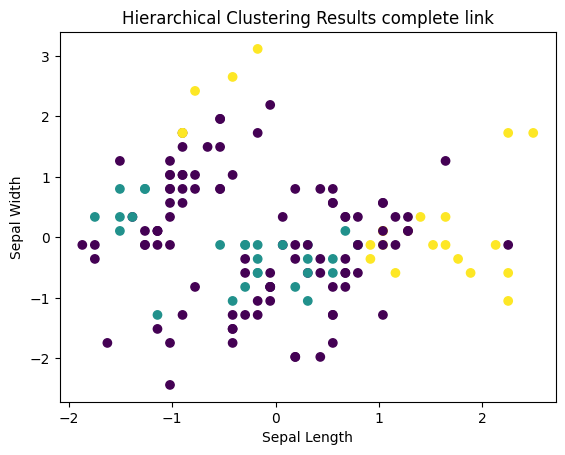

Adjusted Rand Index: 0.5482492858423555


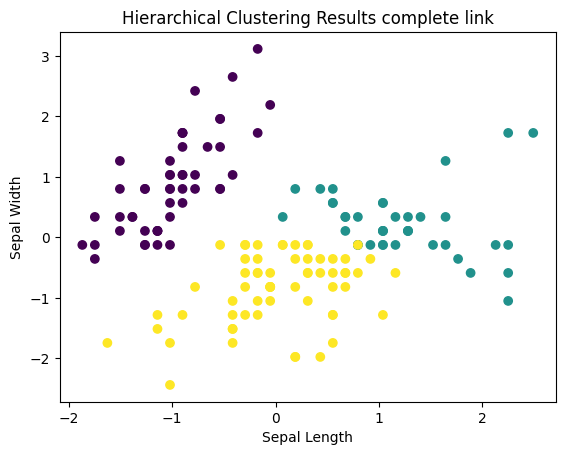

Adjusted Rand Index: 0.5495942581875788


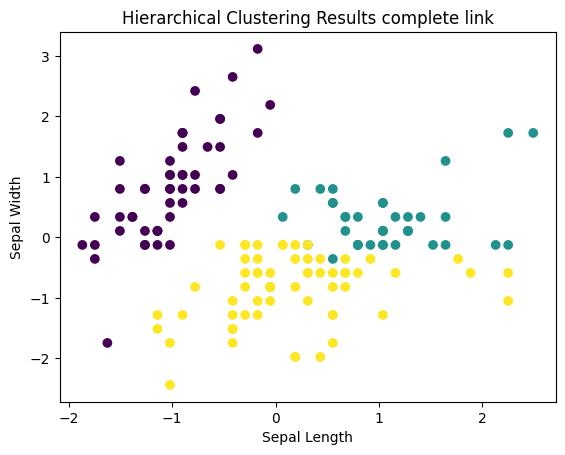

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'complete', 'minkowski', 3)
hierarchical(StandardScaler(), 'complete', 'mahalanobis', 3)
hierarchical(StandardScaler(), 'complete', 'chebyshev', 3)
hierarchical(StandardScaler(), 'complete', 'cosine', 3)

*Average Link*

Adjusted Rand Index: 0.7195837484778036


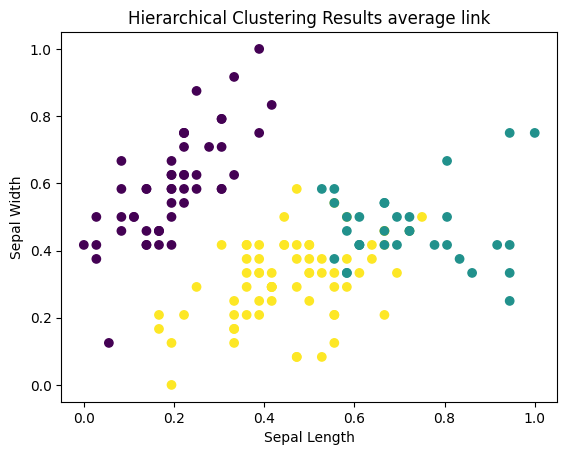

Adjusted Rand Index: 0.000730655662992382


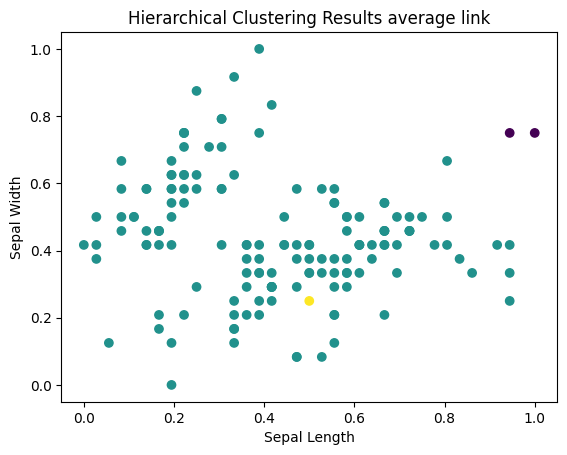

Adjusted Rand Index: 0.5583714437541352


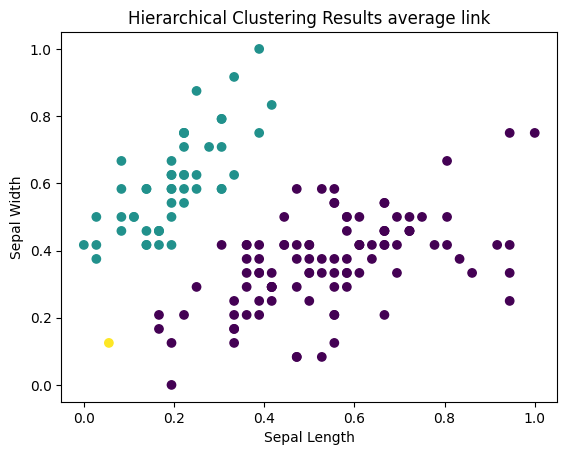

Adjusted Rand Index: 0.5583714437541352


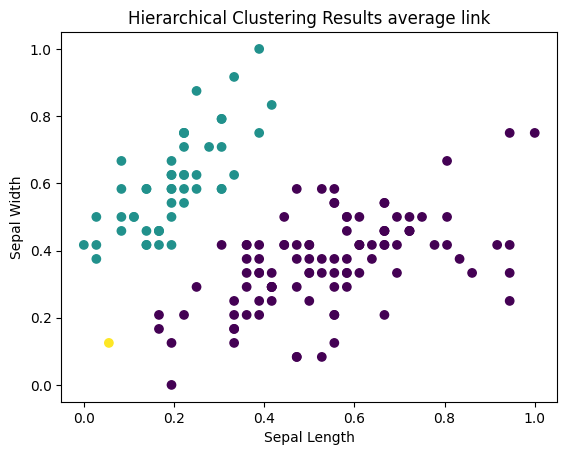

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'average', 'minkowski', 3)
hierarchical(MinMaxScaler(), 'average', 'mahalanobis', 3)
hierarchical(MinMaxScaler(), 'average', 'chebyshev', 3)
hierarchical(MinMaxScaler(), 'average', 'cosine', 3)

Adjusted Rand Index: 0.5621364251426576


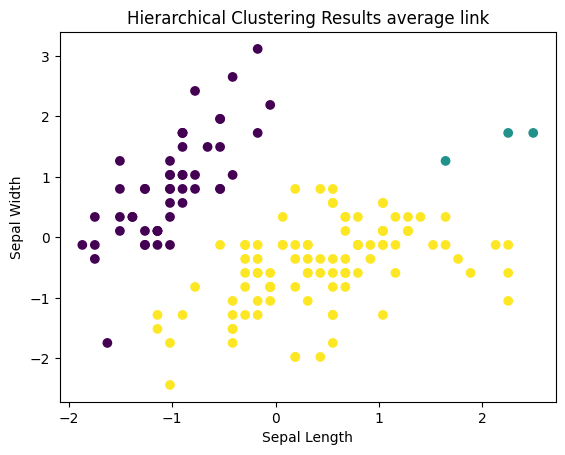

Adjusted Rand Index: 0.000730655662992382


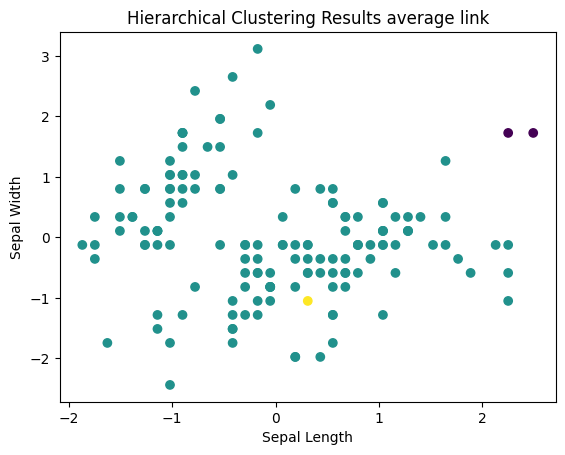

Adjusted Rand Index: 0.537807593632331


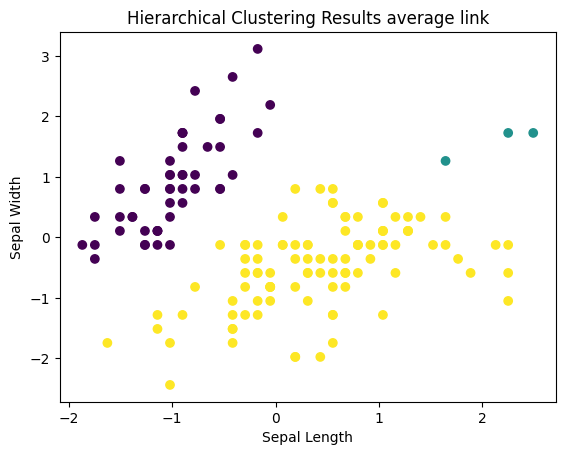

Adjusted Rand Index: 0.60973554873343


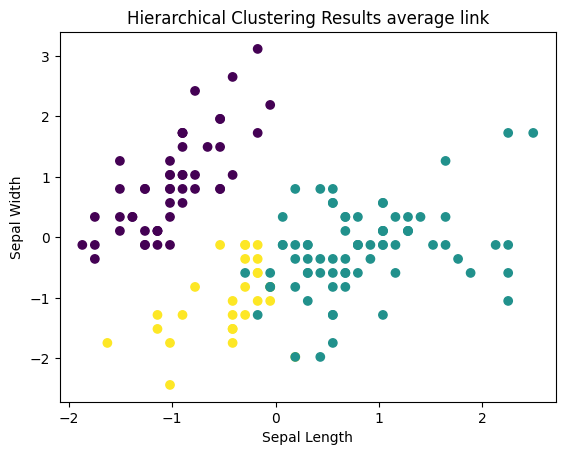

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'average', 'minkowski', 3)
hierarchical(StandardScaler(), 'average', 'mahalanobis', 3)
hierarchical(StandardScaler(), 'average', 'chebyshev', 3)
hierarchical(StandardScaler(), 'average', 'cosine', 3)

*Ward variance*

Adjusted Rand Index: 0.7195837484778036


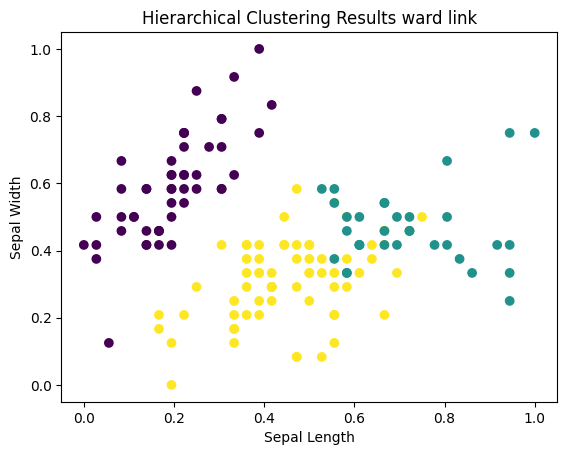

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'ward', 'euclidean', 3)

Adjusted Rand Index: 0.6153229932145449


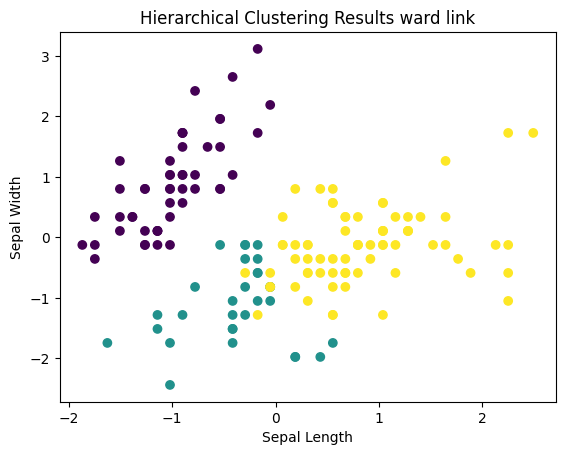

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'ward', 'euclidean', 3)

**Density-based algorithms (DBSCAN)**

In [ ]:
# Min-Max scaler normalization data

def dbscan_alg(scaler, eps, min_samples, metric):

  X = iris.iloc[:, :4]
  Y = iris.iloc[:, 4]

  X_scaled = scaler.fit_transform(X)
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  labels = dbscan.fit_predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  return ari, X_scaled, labels

def plot(scaler, metric):

  ari_max = 0
  eps_max = 0
  X_scaled_max = []
  labels_max = []

  for eps in range(1, 101, 1):
    eps = eps / 100.0
    ari, X_scaled, labels = dbscan_alg(scaler, eps, 10, metric)

    if ari_max < ari:
      ari_max = ari
      X_scaled_max = X_scaled
      labels_max = labels
      eps_max = eps

  print("Adjusted Rand Index with eps " + str(eps_max) + " : ", ari_max)

  plt.scatter(X_scaled_max[:, 0], X_scaled_max[:, 1], c=labels_max)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('DBSCAN Clustering Results')
  plt.show()

Adjusted Rand Index with eps 0.31 :  0.5681159420289855


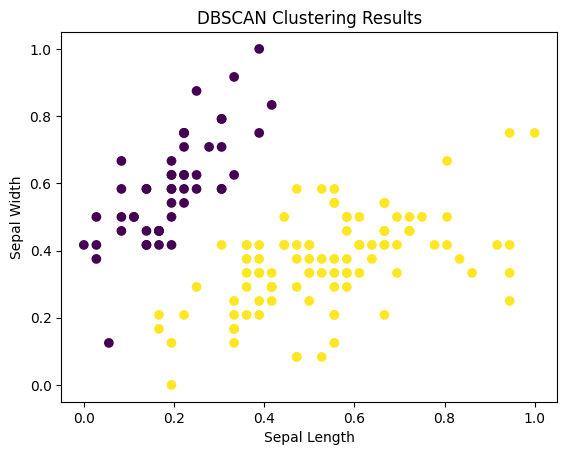

Adjusted Rand Index with eps 0.12 :  0.653403710562801


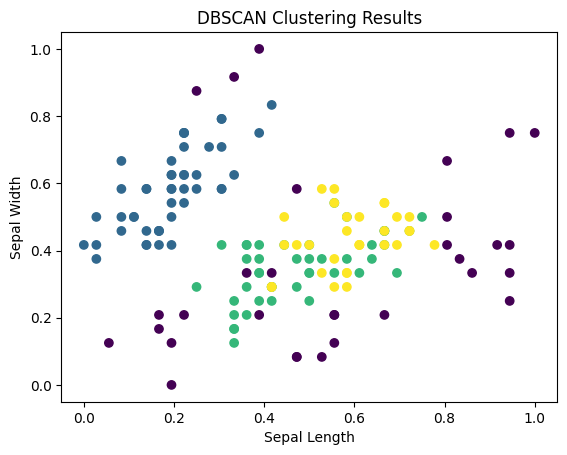

Adjusted Rand Index with eps 0.05 :  0.5681159420289855


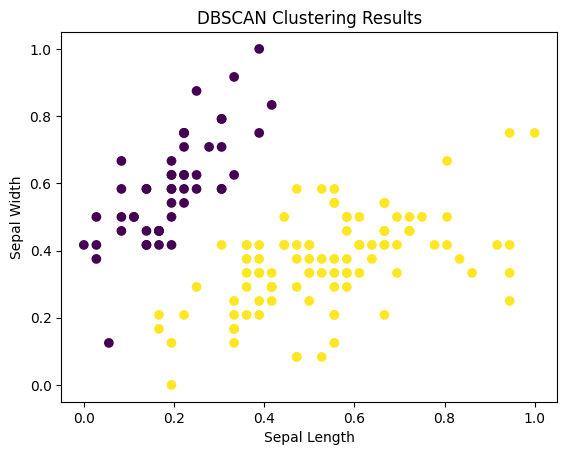

In [ ]:
## Min-Max Scaler

plot(MinMaxScaler(), 'euclidean')
plot(MinMaxScaler(), 'chebyshev')
plot(MinMaxScaler(), 'cosine')

Adjusted Rand Index with eps 0.99 :  0.5503452567273898


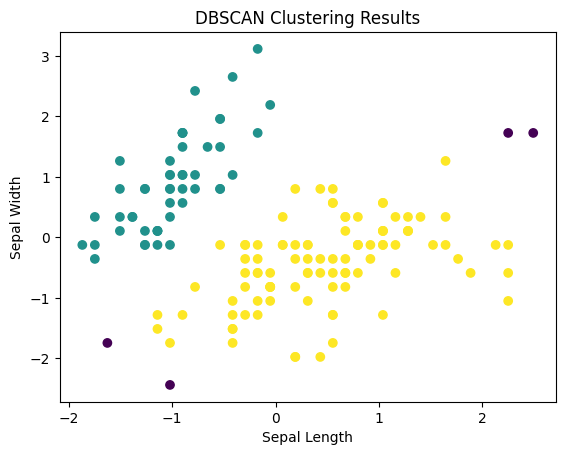

Adjusted Rand Index with eps 0.97 :  0.5583714437541352


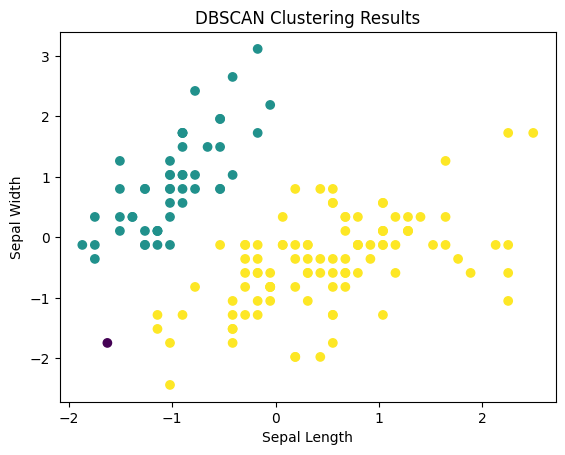

Adjusted Rand Index with eps 0.08 :  0.5946823446823447


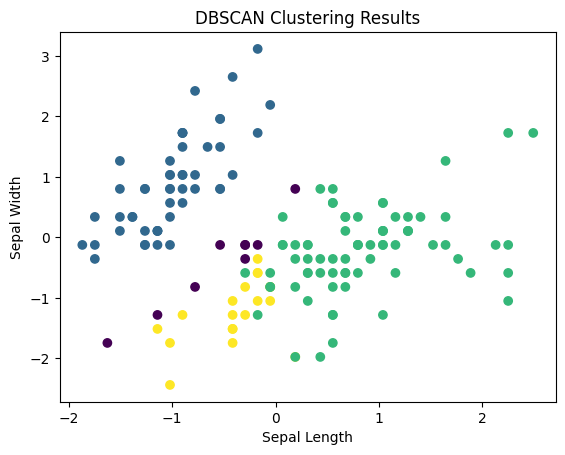

In [ ]:
## Z-Score Scaler

plot(StandardScaler(), 'euclidean')
plot(StandardScaler(), 'chebyshev')
plot(StandardScaler(), 'cosine')

*Self - organizing maps (SOM)*

(120, 4) (120,) (30, 4) (30,)
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Iteration:  7000
Iteration:  8000
Iteration:  9000
Iteration:  10000
Iteration:  11000
Iteration:  12000
Iteration:  13000
Iteration:  14000
Iteration:  15000
Iteration:  16000
Iteration:  17000
Iteration:  18000
Iteration:  19000
Iteration:  20000
SOM training completed


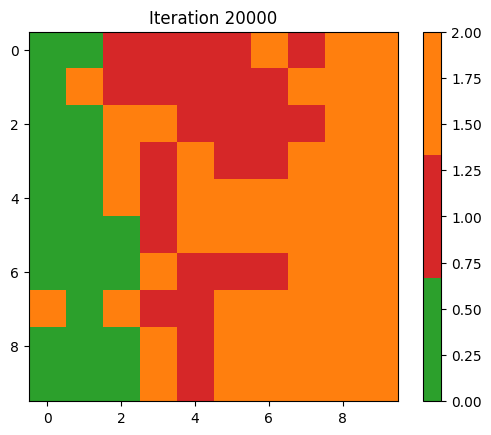

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.8074463899272083


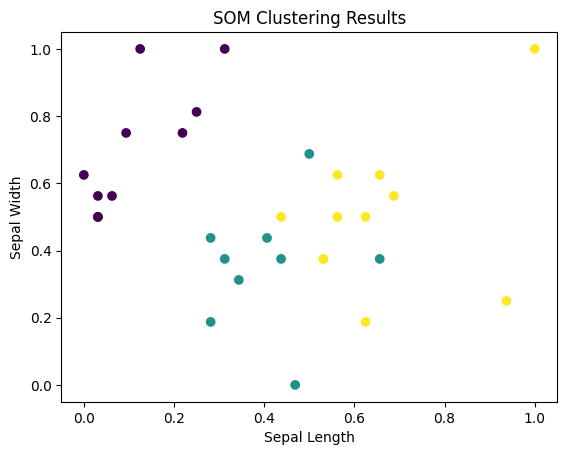

In [ ]:
data_x = iris.iloc[:, :4]
data_y = iris.iloc[:, 4]

train_x, test_x, train_y, test_y = train_test_split(data_x, data_y, test_size=0.2, random_state=42)
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)

train_x = train_x.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

test_x = test_x.reset_index(drop=True)
test_y = test_y.reset_index(drop=True)

def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def e_distance(x,y):
  return distance.euclidean(x,y)

def m_distance(x,y):
  return distance.cityblock(x,y)

def winning_neuron(data, t, som, num_rows, num_cols):
  winner = [0,0]
  shortest_distance = np.sqrt(data.shape[1])
  input_data = data[t]
  for row in range(num_rows):
    for col in range(num_cols):
      distance = e_distance(som[row][col], data[t])
      if distance < shortest_distance:
        shortest_distance = distance
        winner = [row,col]
  return winner

def decay(step, max_steps,max_learning_rate,max_m_dsitance):
  coefficient = 1.0 - (np.float64(step)/max_steps)
  learning_rate = coefficient*max_learning_rate
  neighbourhood_range = ceil(coefficient * max_m_dsitance)
  return learning_rate, neighbourhood_range

num_rows = 10
num_cols = 10
max_m_dsitance = 4
max_learning_rate = 0.5
max_steps = 20000

train_x_norm = minmax_scaler(train_x)

num_dims = train_x_norm.shape[1]
np.random.seed(40)
som = np.random.random_sample(size=(num_rows, num_cols, num_dims))

for step in range(max_steps):
  if (step+1) % 1000 == 0:
    print("Iteration: ", step+1)
  learning_rate, neighbourhood_range = decay(step, max_steps,max_learning_rate,max_m_dsitance)

  t = np.random.randint(0,high=train_x_norm.shape[0])
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  for row in range(num_rows):
    for col in range(num_cols):
      if m_distance([row,col],winner) <= neighbourhood_range:
        som[row][col] += learning_rate*(train_x_norm[t]-som[row][col]) #update neighbour's weight

print("SOM training completed")

label_data = train_y
map = np.empty(shape=(num_rows, num_cols), dtype=object)

for row in range(num_rows):
  for col in range(num_cols):
    map[row][col] = []

for t in range(train_x_norm.shape[0]):
  if (t+1) % 1000 == 0:
    print("sample data: ", t+1)
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  map[winner[0]][winner[1]].append(label_data[t])

label_map = np.zeros(shape=(num_rows, num_cols),dtype=np.int64)
for row in range(num_rows):
  for col in range(num_cols):
    label_list = map[row][col]
    if len(label_list)==0:
      label = 2
    else:
      label = max(label_list, key=label_list.count)
    label_map[row][col] = label

title = ('Iteration ' + str(max_steps))
cmap = colors.ListedColormap(['tab:green', 'tab:red', 'tab:orange'])
plt.imshow(label_map, cmap=cmap)
plt.colorbar()
plt.title(title)
plt.show()

kmeans = KMeans(n_clusters=3, random_state=42).fit(som.reshape(num_rows * num_cols, -1))
clustered = kmeans.predict(som.reshape(num_rows * num_cols, -1))

data = minmax_scaler(test_x)

winner_labels = []

for t in range(data.shape[0]):
 winner = winning_neuron(data, t, som, num_rows, num_cols)
 row = winner[0]
 col = winner[1]
 predicted = clustered[row * num_cols + col]
 winner_labels.append(predicted)

ari = adjusted_rand_score(test_y, np.array(winner_labels))
print(ari)

plt.scatter(data[:, 0], data[:, 1], c=test_y)
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('SOM Clustering Results')
plt.show()


**The 2d_10c data analisys**

*About the dataset*

In [ ]:
dataset_2d_10c = pd.read_csv("2d-10c.dat", header=None, sep=" ")
dataset_2d_10c = dataset_2d_10c.drop(index=[0, 1, 2])
dataset_2d_10c.head()

,0,1,2
3,12.757900,-4.81962,0.0
4,-0.298175,-5.03868,0.0
5,9.155580,-3.81778,0.0
6,4.298230,-6.25105,0.0
7,8.833200,-3.48504,0.0


In [ ]:
dataset_2d_10c.shape

(2525, 3)

In [ ]:
dataset_2d_10c.isna().sum() ## Null or missing values

0    0
1    0
2    0
dtype: int64

In [ ]:
## Target variable distribution

target_counts = dataset_2d_10c.iloc[:, 2].value_counts()
target_distribution = target_counts / target_counts.sum()

print(target_distribution)

5.0    0.192475
6.0    0.187723
0.0    0.168317
2.0    0.141386
4.0    0.109307
3.0    0.081980
1.0    0.041980
8.0    0.029703
9.0    0.023762
7.0    0.023366
Name: 2, dtype: float64


*Execute the algorithms*

**K-Means**

In [ ]:
def k_means(scaler, max_iter, k):

  X = dataset_2d_10c.iloc[:, :2]
  Y = dataset_2d_10c.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.7462436443521445


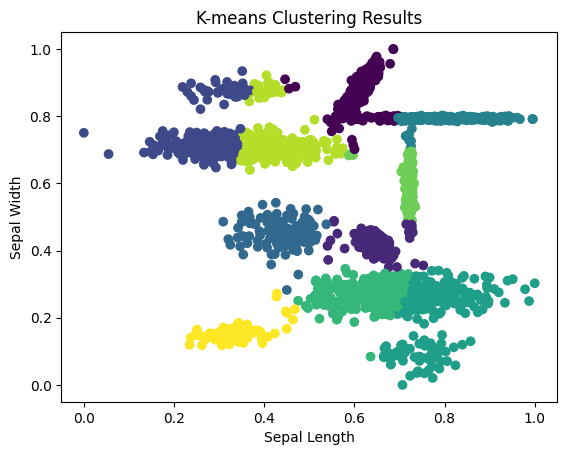

In [ ]:
## Min-Max Scaler

k_means(MinMaxScaler(), 300, 10)
# k_means(MinMaxScaler(), 500, 10)
# k_means(MinMaxScaler(), 1000, 10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.7324324232359001


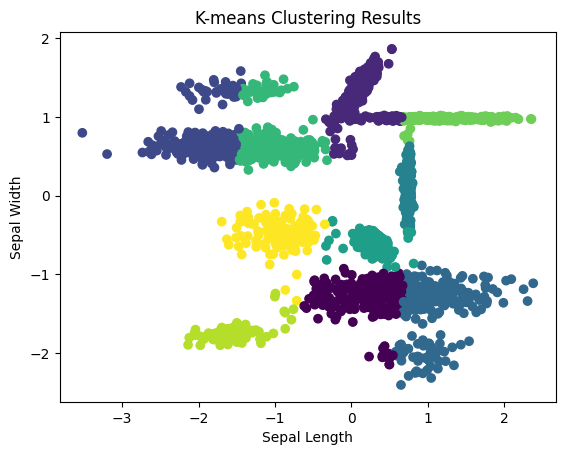

In [ ]:
## Z-Score Scaler

k_means(StandardScaler(), 300, 10)
# k_means(StandardScaler(), 500, 10)
# k_means(StandardScaler(), 1000, 10)

**EM for clustering under Gaussian assumptions**

In [ ]:
def em(scaler, max_iter, k):

  X = dataset_2d_10c.iloc[:, :2]
  Y = dataset_2d_10c.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

Adjusted Rand Index: 0.9240814766036899


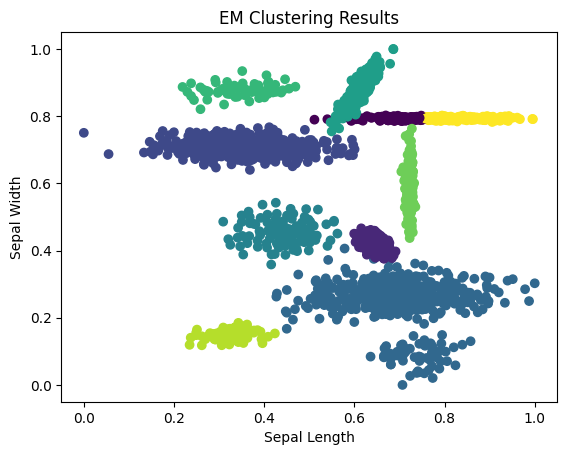

In [ ]:
## Min-Max Scaler

em(MinMaxScaler(), 100, 10)
# em(MinMaxScaler(), 500, 10)
# em(MinMaxScaler(), 1000, 10)

Adjusted Rand Index: 0.9982089084808446


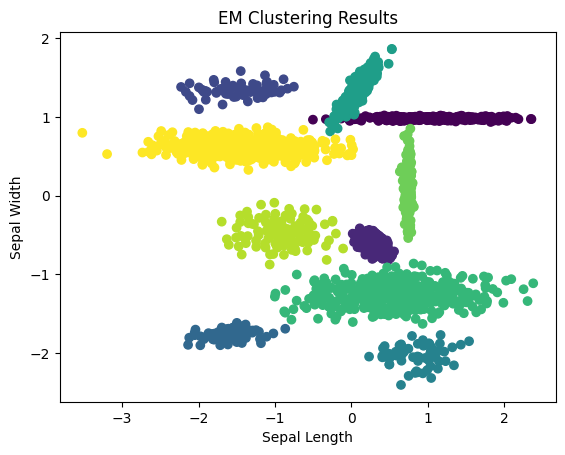

In [ ]:
## Z-Score Scaler

em(StandardScaler(), 300, 10)
# em(StandardScaler(), 500, 10)
# em(StandardScaler(), 1000, 10)

**Hierarchical algorithms**

In [ ]:
def hierarchical(scaler, method, metric, k):
  X = dataset_2d_10c.iloc[:, :2]
  Y = dataset_2d_10c.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  linkage_matrix = linkage(X_scaled, method=method, metric=metric)
  labels = fcluster(linkage_matrix, k, criterion='maxclust')

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title("Hierarchical Clustering Results " + method + " link")
  plt.show()

*Single link*

Adjusted Rand Index: 0.3265971017563202


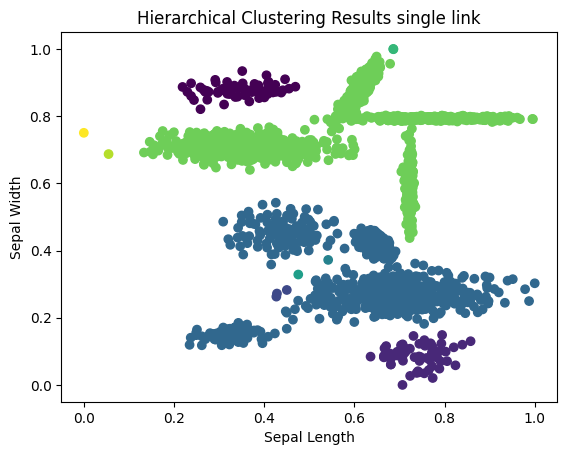

Adjusted Rand Index: 0.3626314609402589


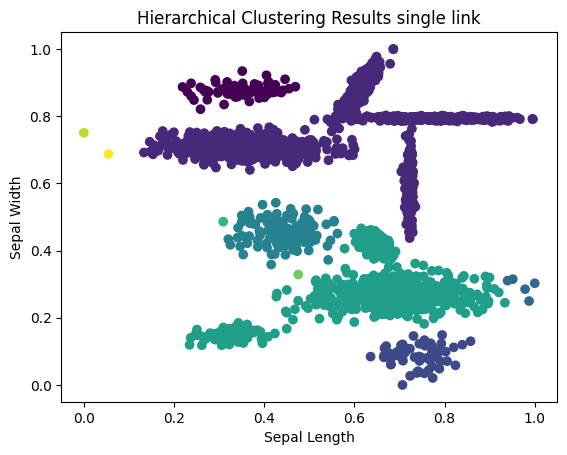

Adjusted Rand Index: 0.32697541656463025


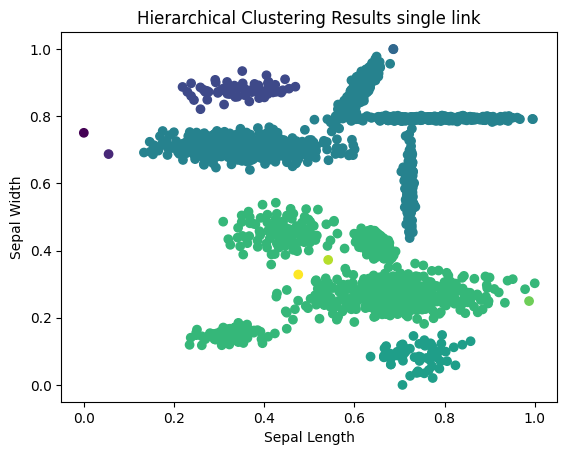

Adjusted Rand Index: 0.01502453879403703


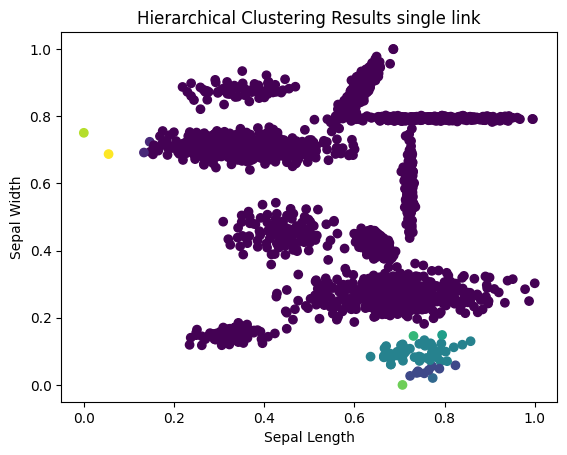

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'single', 'minkowski', 10)
hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 10)
hierarchical(MinMaxScaler(), 'single', 'chebyshev', 10)
hierarchical(MinMaxScaler(), 'single', 'cosine', 10)

Adjusted Rand Index: 0.36306139186145114


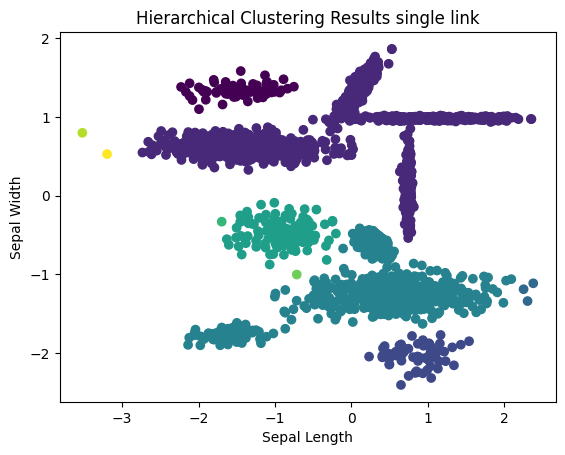

Adjusted Rand Index: 0.3626314609402589


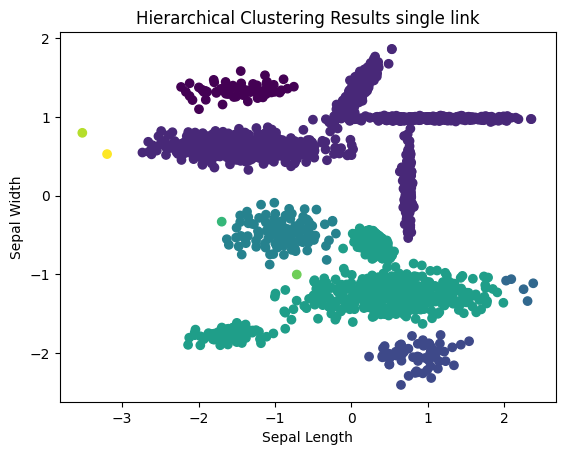

Adjusted Rand Index: 0.3424581365259483


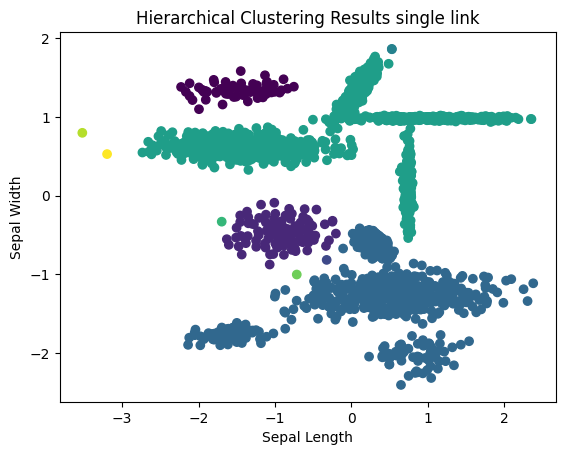

Adjusted Rand Index: 0.5216639220458255


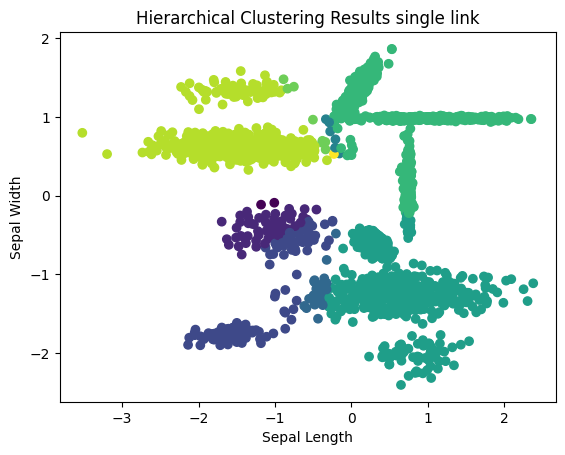

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'single', 'minkowski', 10)
hierarchical(StandardScaler(), 'single', 'mahalanobis', 10)
hierarchical(StandardScaler(), 'single', 'chebyshev', 10)
hierarchical(StandardScaler(), 'single', 'cosine', 10)

*Complete link*

Adjusted Rand Index: 0.7398133195620392


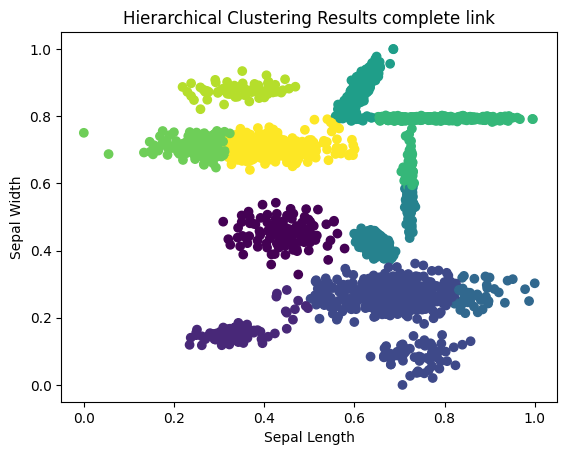

Adjusted Rand Index: 0.5858302584351665


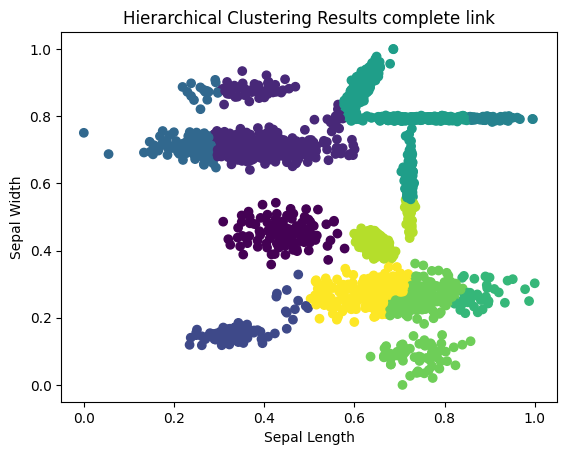

Adjusted Rand Index: 0.5478431163006732


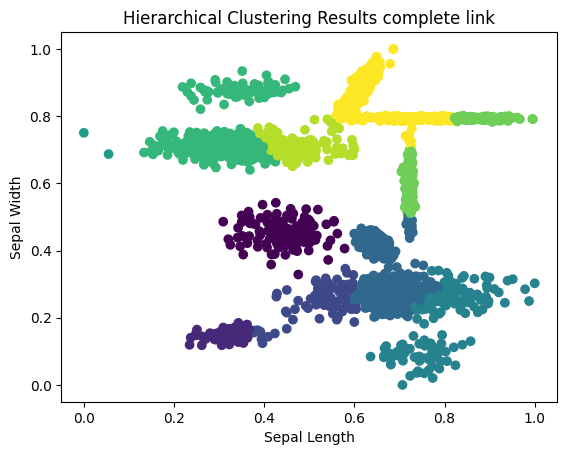

Adjusted Rand Index: 0.5077690597614881


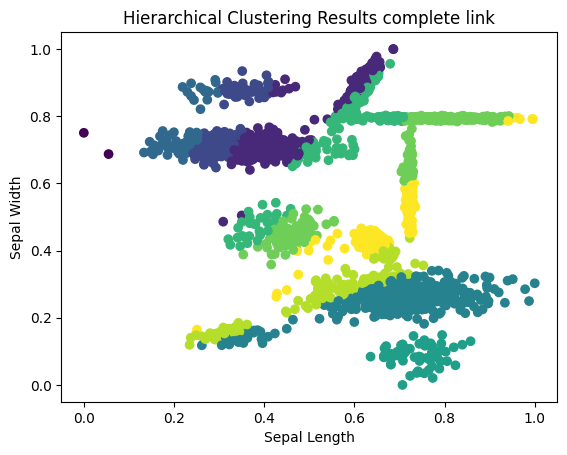

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'complete', 'minkowski', 10)
hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 10)
hierarchical(MinMaxScaler(), 'complete', 'chebyshev', 10)
hierarchical(MinMaxScaler(), 'complete', 'cosine', 10)

Adjusted Rand Index: 0.5788494654191659


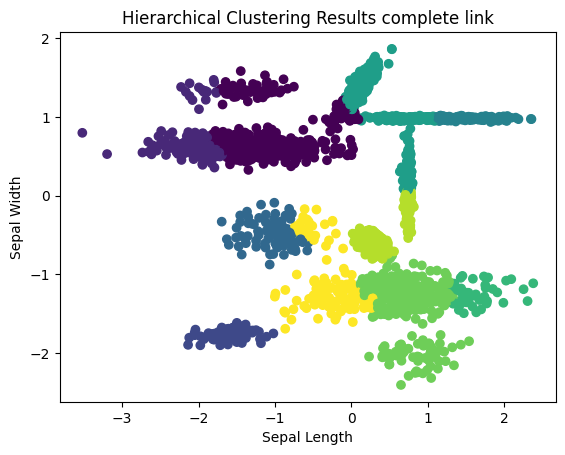

Adjusted Rand Index: 0.5858302584351665


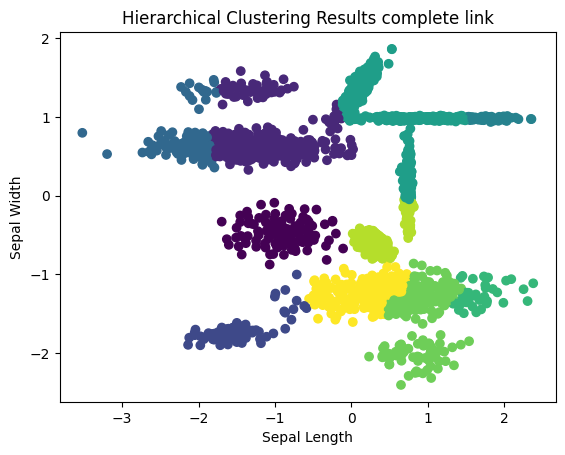

Adjusted Rand Index: 0.49789715532422035


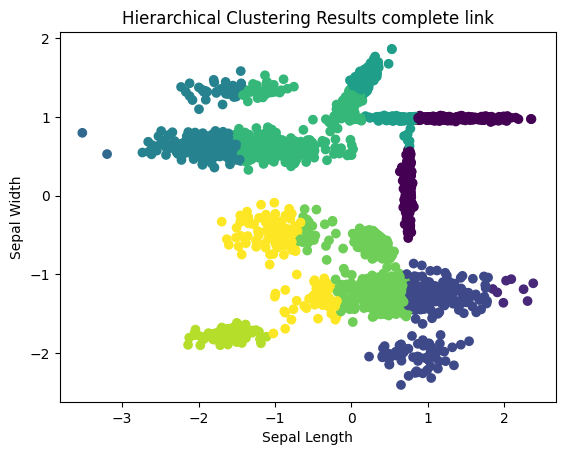

Adjusted Rand Index: 0.5700304450608495


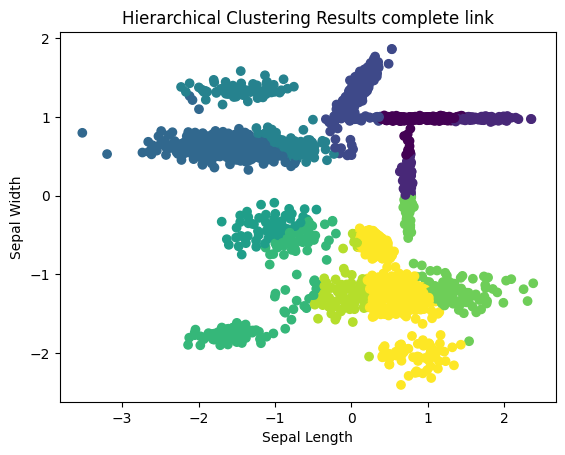

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'complete', 'minkowski', 10)
hierarchical(StandardScaler(), 'complete', 'mahalanobis', 10)
hierarchical(StandardScaler(), 'complete', 'chebyshev', 10)
hierarchical(StandardScaler(), 'complete', 'cosine', 10)

*Average Link*

Adjusted Rand Index: 0.6290584392325542


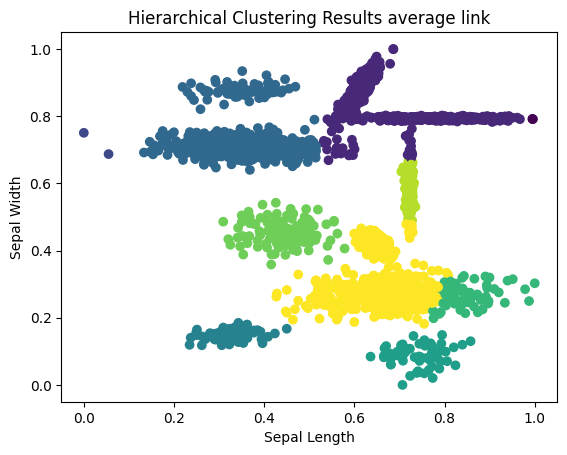

Adjusted Rand Index: 0.7178524726732542


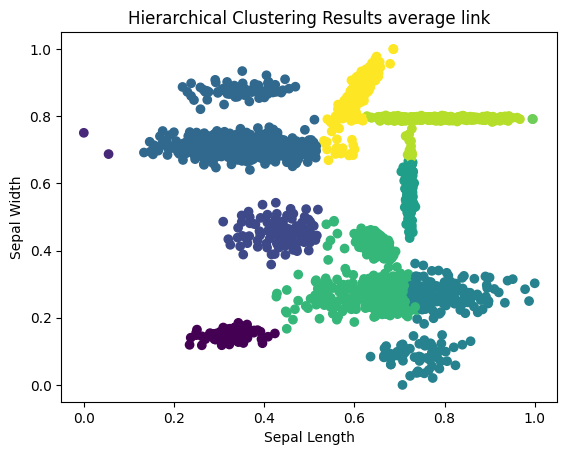

Adjusted Rand Index: 0.710350124712046


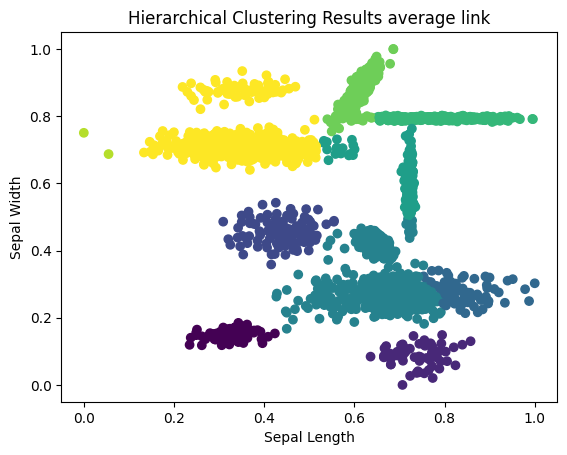

Adjusted Rand Index: 0.555632232212784


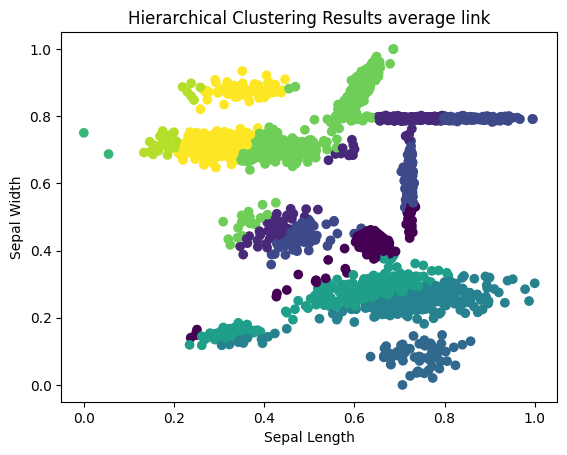

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'average', 'minkowski', 10)
hierarchical(MinMaxScaler(), 'average', 'mahalanobis', 10)
hierarchical(MinMaxScaler(), 'average', 'chebyshev', 10)
hierarchical(MinMaxScaler(), 'average', 'cosine', 10)

Adjusted Rand Index: 0.7282505385885099


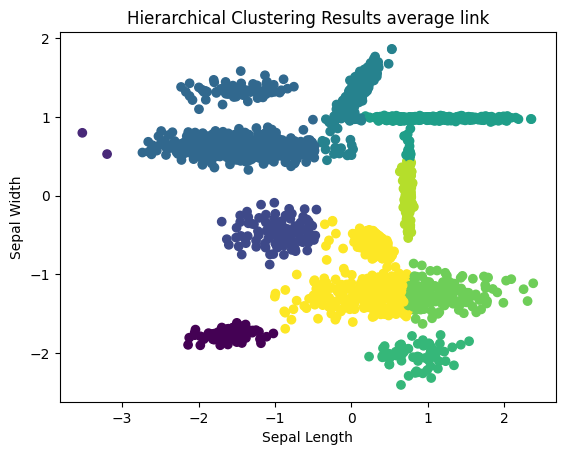

Adjusted Rand Index: 0.7178524726732542


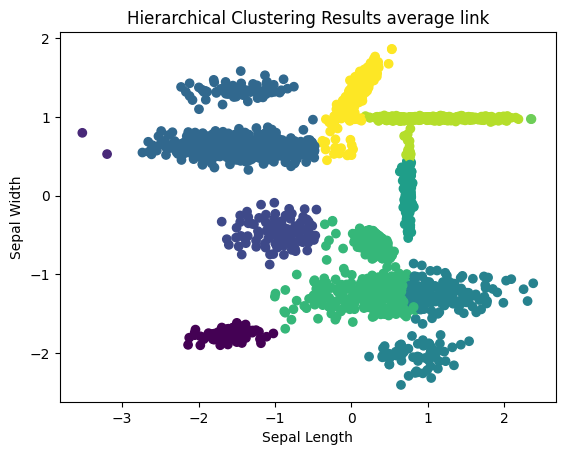

Adjusted Rand Index: 0.6355775580283256


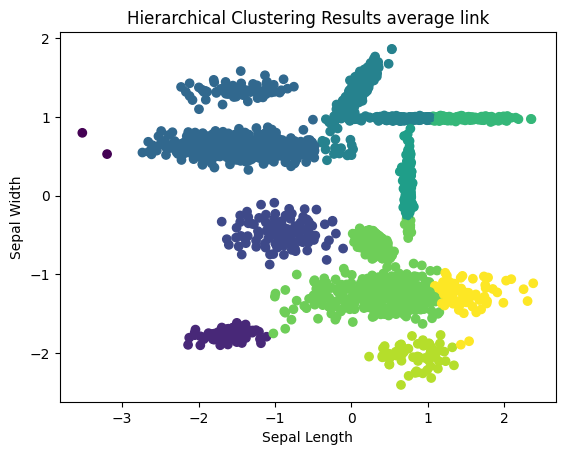

Adjusted Rand Index: 0.6475683230617539


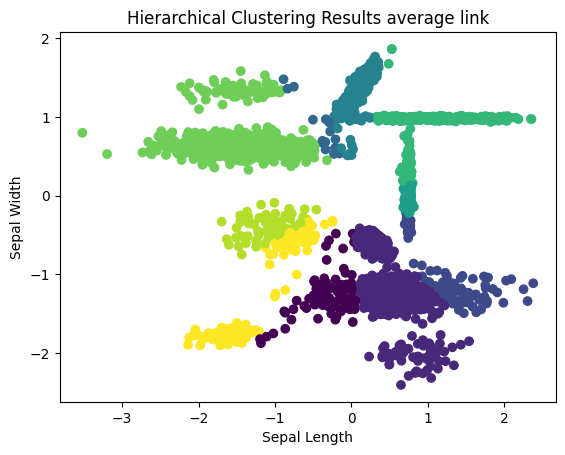

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'average', 'minkowski', 10)
hierarchical(StandardScaler(), 'average', 'mahalanobis', 10)
hierarchical(StandardScaler(), 'average', 'chebyshev', 10)
hierarchical(StandardScaler(), 'average', 'cosine', 10)

*Ward variance*

Adjusted Rand Index: 0.8182577651448736


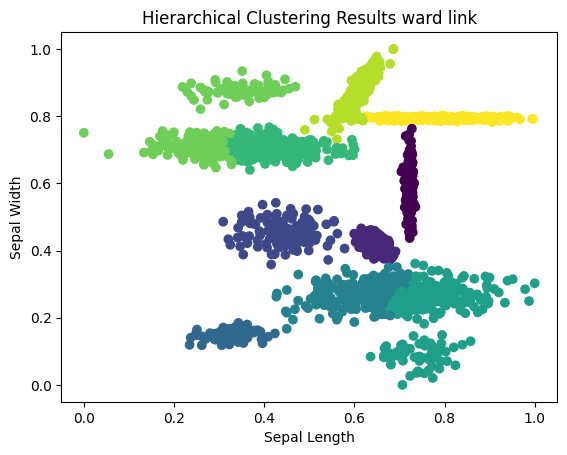

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'ward', 'euclidean', 10)

Adjusted Rand Index: 0.8170271521894713


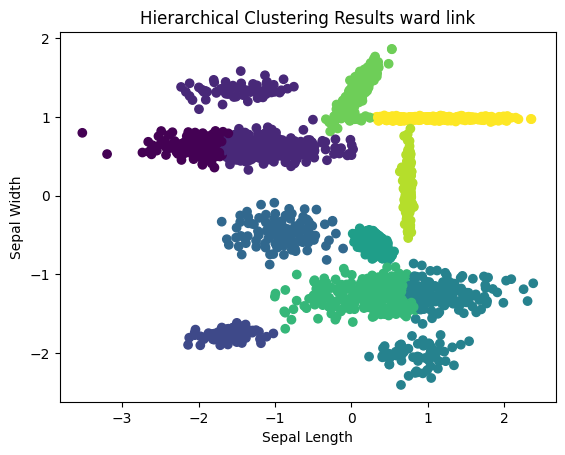

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'ward', 'euclidean', 10)

**Density-based algorithms (DBSCAN)**

In [ ]:
def dbscan_alg(scaler, eps, min_samples, metric):

  X = dataset_2d_10c.iloc[:, :2]
  Y = dataset_2d_10c.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  labels = dbscan.fit_predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  return ari, X_scaled, labels

def plot(scaler, metric):

  ari_max = 0
  eps_max = 0
  X_scaled_max = []
  labels_max = []

  for eps in range(1, 101, 1):
    eps = eps / 100.0
    ari, X_scaled, labels = dbscan_alg(scaler, eps, 10, metric)

    if ari_max < ari:
      ari_max = ari
      X_scaled_max = X_scaled
      labels_max = labels
      eps_max = eps

  print("Adjusted Rand Index with eps " + str(eps_max) + " : ", ari_max)

  plt.scatter(X_scaled_max[:, 0], X_scaled_max[:, 1], c=labels_max)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('DBSCAN Clustering Results')
  plt.show()

Adjusted Rand Index with eps 0.03 :  0.8489288710008164


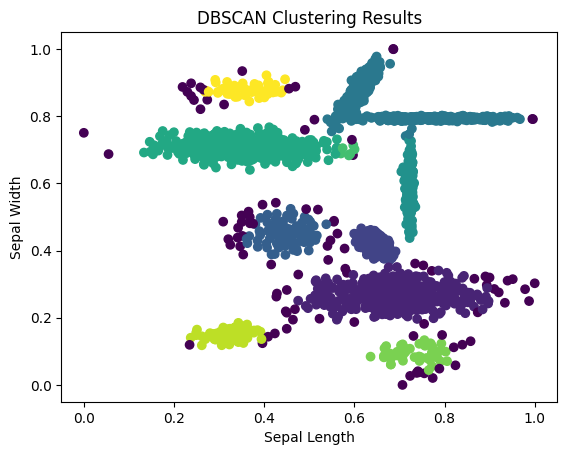

Adjusted Rand Index with eps 0.02 :  0.8039854056506842


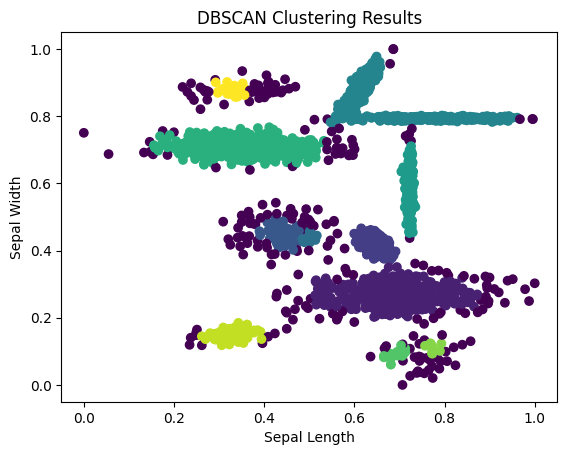

In [ ]:
## Min-Max Scaler

plot(MinMaxScaler(), 'euclidean')
plot(MinMaxScaler(), 'chebyshev')

Adjusted Rand Index with eps 0.11 :  0.877623615016262


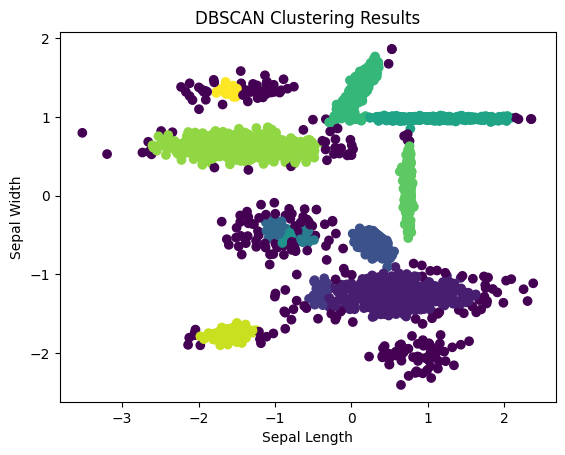

Adjusted Rand Index with eps 0.1 :  0.883903925814681


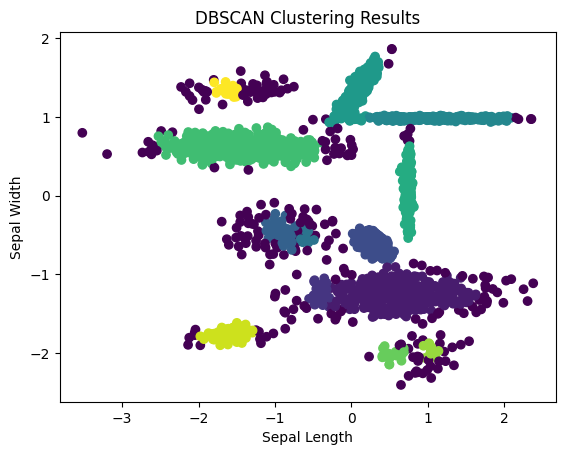

In [ ]:
## Z-Score Scaler

plot(StandardScaler(), 'euclidean')
plot(StandardScaler(), 'chebyshev')

**Self - organizing maps (SOM)**

(2020, 2) (2020,) (505, 2) (505,)
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Iteration:  7000
Iteration:  8000
Iteration:  9000
Iteration:  10000
Iteration:  11000
Iteration:  12000
Iteration:  13000
Iteration:  14000
Iteration:  15000
Iteration:  16000
Iteration:  17000
Iteration:  18000
Iteration:  19000
Iteration:  20000
SOM training completed
sample data:  1000
sample data:  2000


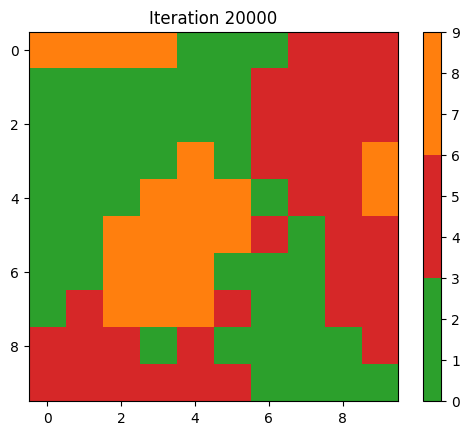

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.4718928345857817


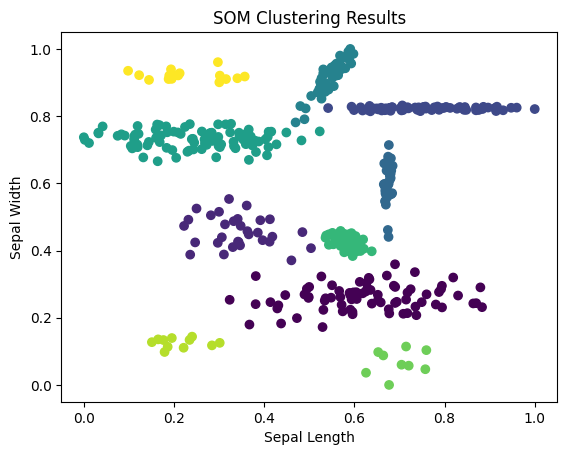

In [ ]:
data_x = dataset_2d_10c.iloc[:, :2]
data_y = dataset_2d_10c.iloc[:, 2]

train_x, test_x, train_y, test_y = train_test_split(data_x, data_y, test_size=0.2, random_state=42)
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)

train_x = train_x.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

test_x = test_x.reset_index(drop=True)
test_y = test_y.reset_index(drop=True)

def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def e_distance(x,y):
  return distance.euclidean(x,y)

def m_distance(x,y):
  return distance.cityblock(x,y)

def winning_neuron(data, t, som, num_rows, num_cols):
  winner = [0,0]
  shortest_distance = np.sqrt(data.shape[1])
  input_data = data[t]
  for row in range(num_rows):
    for col in range(num_cols):
      distance = e_distance(som[row][col], data[t])
      if distance < shortest_distance:
        shortest_distance = distance
        winner = [row,col]
  return winner

def decay(step, max_steps,max_learning_rate,max_m_dsitance):
  coefficient = 1.0 - (np.float64(step)/max_steps)
  learning_rate = coefficient*max_learning_rate
  neighbourhood_range = ceil(coefficient * max_m_dsitance)
  return learning_rate, neighbourhood_range

num_rows = 10
num_cols = 10
max_m_dsitance = 4
max_learning_rate = 0.5
max_steps = 20000

train_x_norm = minmax_scaler(train_x)

num_dims = train_x_norm.shape[1]
np.random.seed(40)
som = np.random.random_sample(size=(num_rows, num_cols, num_dims))

for step in range(max_steps):
  if (step+1) % 1000 == 0:
    print("Iteration: ", step+1)
  learning_rate, neighbourhood_range = decay(step, max_steps,max_learning_rate,max_m_dsitance)

  t = np.random.randint(0,high=train_x_norm.shape[0])
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  for row in range(num_rows):
    for col in range(num_cols):
      if m_distance([row,col],winner) <= neighbourhood_range:
        som[row][col] += learning_rate*(train_x_norm[t]-som[row][col]) #update neighbour's weight

print("SOM training completed")

label_data = train_y
map = np.empty(shape=(num_rows, num_cols), dtype=object)

for row in range(num_rows):
  for col in range(num_cols):
    map[row][col] = []

for t in range(train_x_norm.shape[0]):
  if (t+1) % 1000 == 0:
    print("sample data: ", t+1)
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  map[winner[0]][winner[1]].append(label_data[t])

label_map = np.zeros(shape=(num_rows, num_cols),dtype=np.int64)
for row in range(num_rows):
  for col in range(num_cols):
    label_list = map[row][col]
    if len(label_list)==0:
      label = 2
    else:
      label = max(label_list, key=label_list.count)
    label_map[row][col] = label

title = ('Iteration ' + str(max_steps))
cmap = colors.ListedColormap(['tab:green', 'tab:red', 'tab:orange'])
plt.imshow(label_map, cmap=cmap)
plt.colorbar()
plt.title(title)
plt.show()

kmeans = KMeans(n_clusters=3, random_state=42).fit(som.reshape(num_rows * num_cols, -1))
clustered = kmeans.predict(som.reshape(num_rows * num_cols, -1))

data = minmax_scaler(test_x)

winner_labels = []

for t in range(data.shape[0]):
 winner = winning_neuron(data, t, som, num_rows, num_cols)
 row = winner[0]
 col = winner[1]
 predicted = clustered[row * num_cols + col]
 winner_labels.append(predicted)

ari = adjusted_rand_score(test_y, np.array(winner_labels))
print(ari)

plt.scatter(data[:, 0], data[:, 1], c=test_y)
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('SOM Clustering Results')
plt.show()


**The long data analisys**

*About the dataset*

In [ ]:
long = pd.read_csv("long.data", header=None, sep=" ")
long.head()

,0,1,2
0,0.167967,-0.171240,0
1,-1.257550,0.054219,0
2,1.648140,0.027165,0
3,-0.124180,0.038627,0
4,2.458720,-0.039070,0


In [ ]:
long.shape

(1000, 3)

In [ ]:
long.isna().sum()

0    0
1    0
2    0
dtype: int64

In [ ]:
## Target variable distribution

target_counts = long.iloc[:, 2].value_counts()
target_distribution = target_counts / target_counts.sum()

print(target_distribution)

0    0.5
1    0.5
Name: 2, dtype: float64


*Execute the algorithms*

**K-Means**

In [ ]:
def k_means(scaler, max_iter, k):

  X = long.iloc[:, :2]
  Y = long.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 1.0


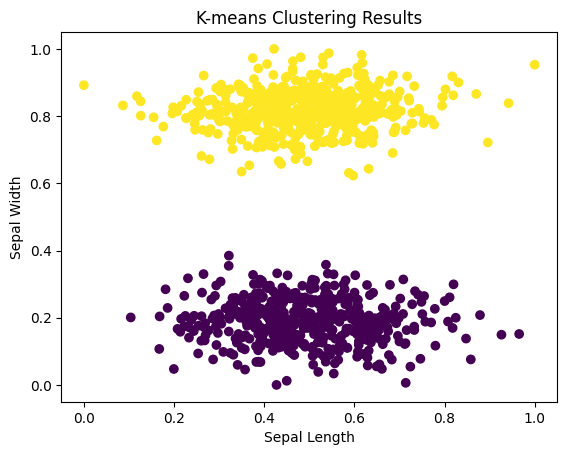

In [ ]:
## Min-Max Scaler

k_means(MinMaxScaler(), 300, 2)
# k_means(MinMaxScaler(), 500, 2)
# k_means(MinMaxScaler(), 1000, 2)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 1.0


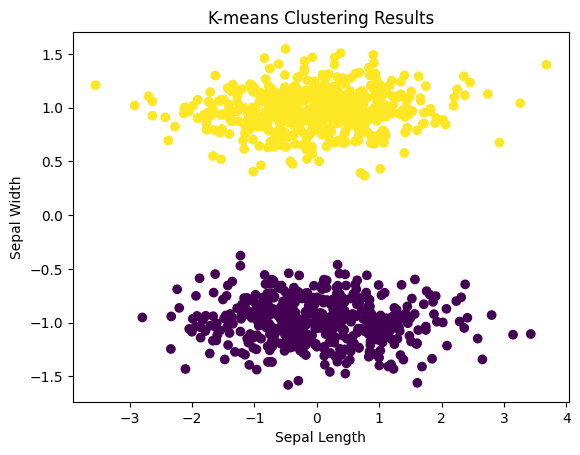

In [ ]:
## Z-Score Scaler

k_means(StandardScaler(), 300, 2)
# k_means(StandardScaler(), 500, 2)
# k_means(StandardScaler(), 1000, 2)

**EM for clustering under Gaussian assumptions**

In [ ]:
def em(scaler, max_iter, k):

  X = long.iloc[:, :2]
  Y = long.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

Adjusted Rand Index: 1.0


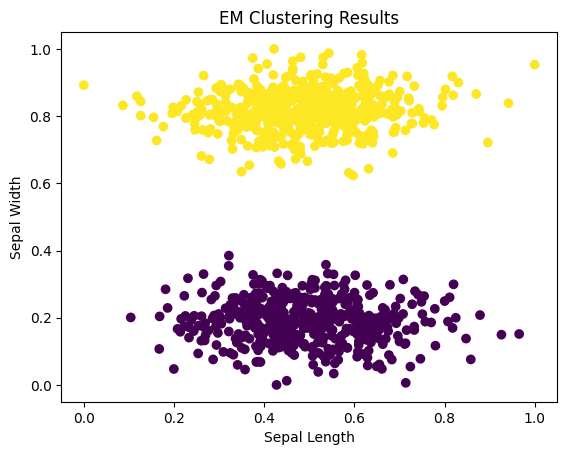

In [ ]:
## Min-Max Scaler

em(MinMaxScaler(), 100, 2)
# em(MinMaxScaler(), 500, 2)
# em(MinMaxScaler(), 1000, 2)

Adjusted Rand Index: 1.0


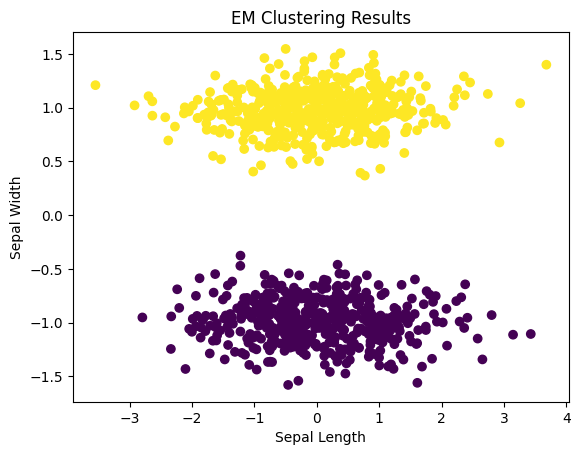

In [ ]:
## Z-Score Scaler

em(StandardScaler(), 300, 2)
# em(StandardScaler(), 500, 2)
# em(StandardScaler(), 1000, 2)

**Hierarchical algorithms**

In [ ]:
def hierarchical(scaler, method, metric, k):
  X = long.iloc[:, :2]
  Y = long.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  linkage_matrix = linkage(X_scaled, method=method, metric=metric)
  labels = fcluster(linkage_matrix, k, criterion='maxclust')

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title("Hierarchical Clustering Results " + method + " link")
  plt.show()

*Single link*

Adjusted Rand Index: 1.0


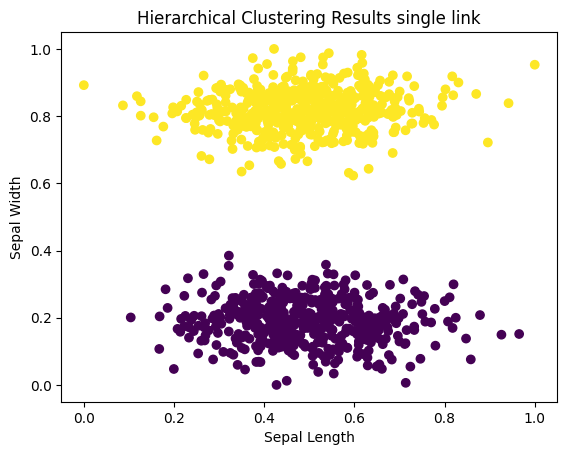

Adjusted Rand Index: 1.0


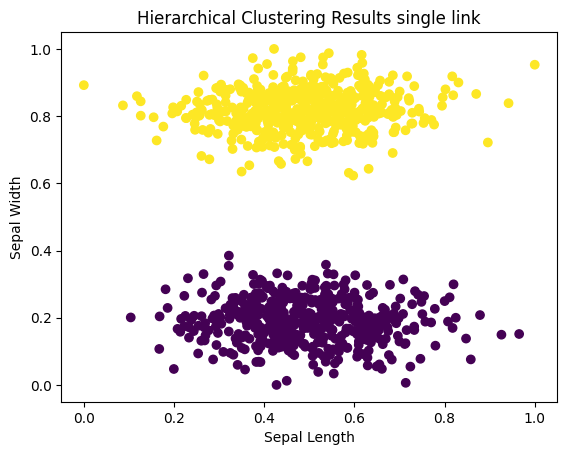

Adjusted Rand Index: 1.0


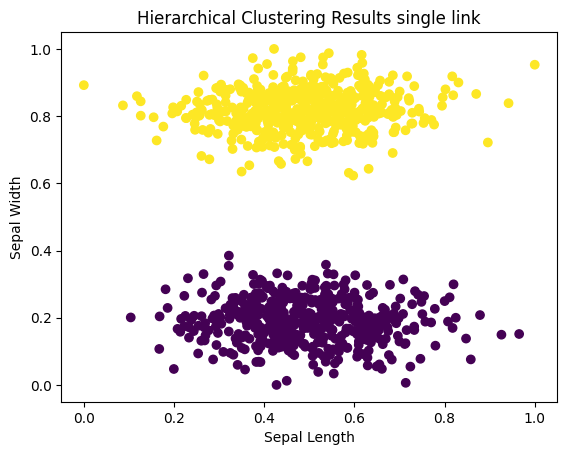

Adjusted Rand Index: 0.0


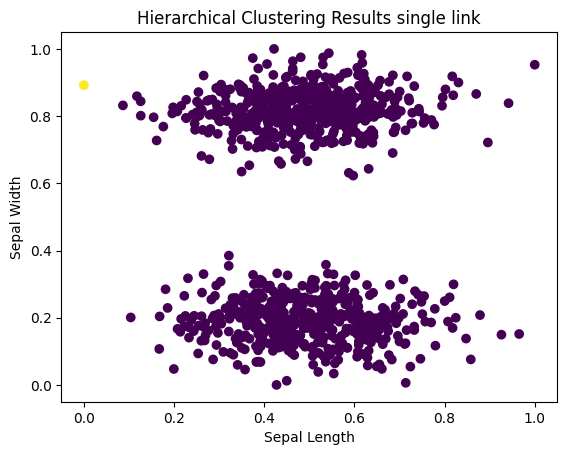

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'single', 'minkowski', 2)
hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 2)
hierarchical(MinMaxScaler(), 'single', 'chebyshev', 2)
hierarchical(MinMaxScaler(), 'single', 'cosine', 2)

Adjusted Rand Index: 1.0


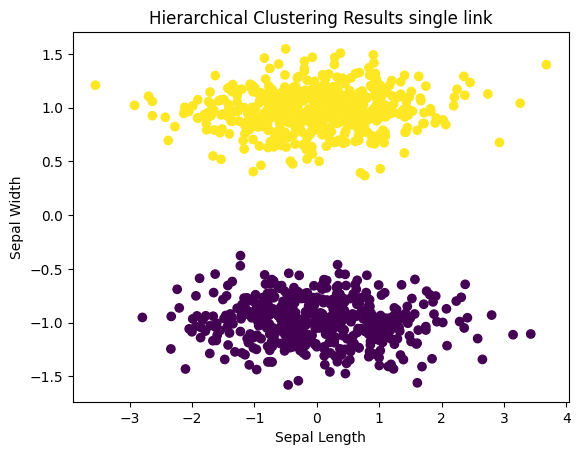

Adjusted Rand Index: 1.0


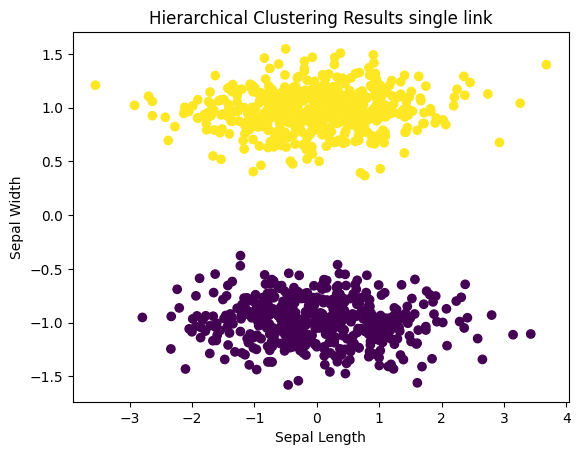

Adjusted Rand Index: 1.0


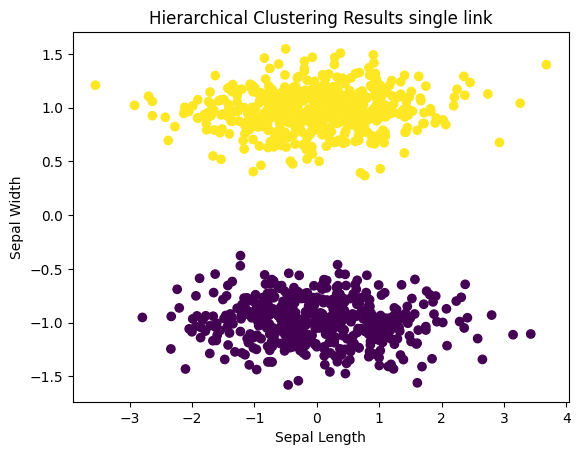

Adjusted Rand Index: 1.0


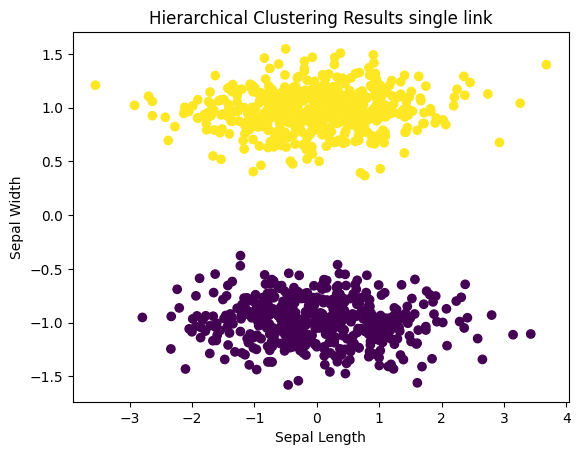

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'single', 'minkowski', 2)
hierarchical(StandardScaler(), 'single', 'mahalanobis', 2)
hierarchical(StandardScaler(), 'single', 'chebyshev', 2)
hierarchical(StandardScaler(), 'single', 'cosine', 2)

*Complete link*

Adjusted Rand Index: 1.0


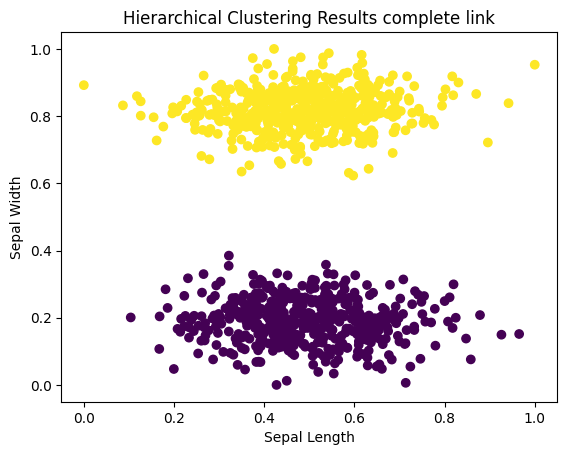

Adjusted Rand Index: 0.009450908594953032


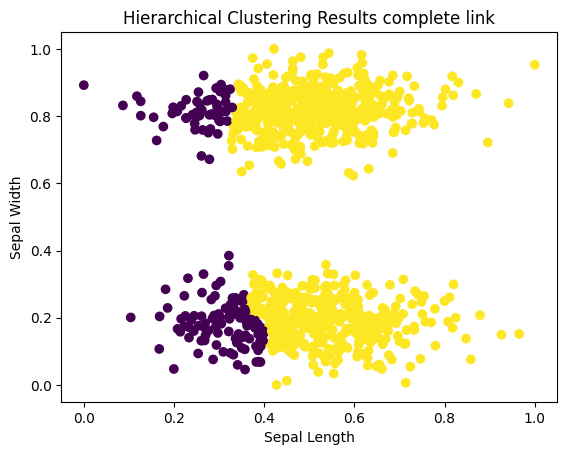

Adjusted Rand Index: 0.7086796678564846


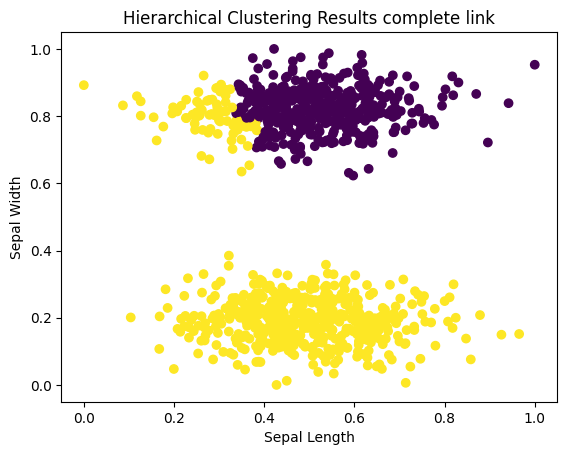

Adjusted Rand Index: 0.7954607006305575


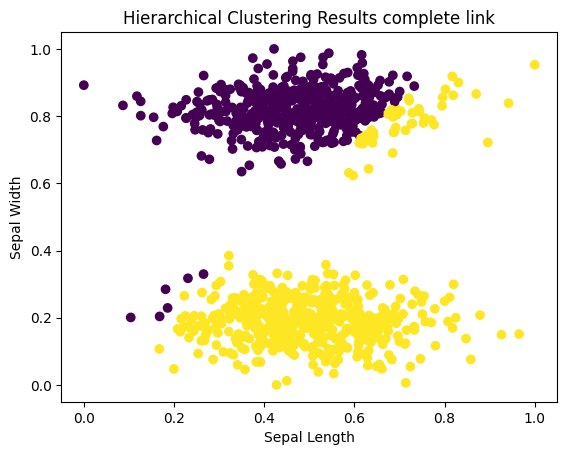

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'complete', 'minkowski', 2)
hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 2)
hierarchical(MinMaxScaler(), 'complete', 'chebyshev', 2)
hierarchical(MinMaxScaler(), 'complete', 'cosine', 2)

Adjusted Rand Index: 0.009450908594953032


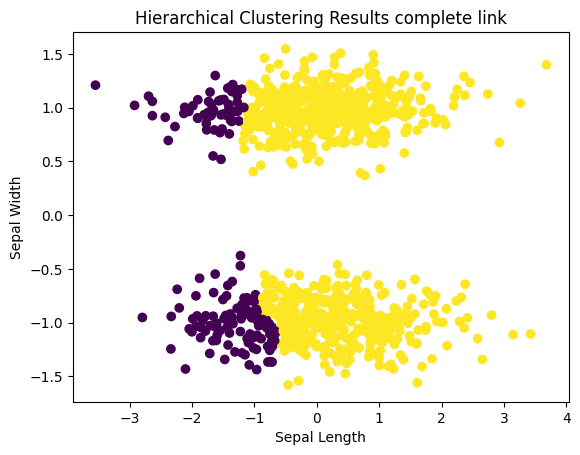

Adjusted Rand Index: 0.009450908594953032


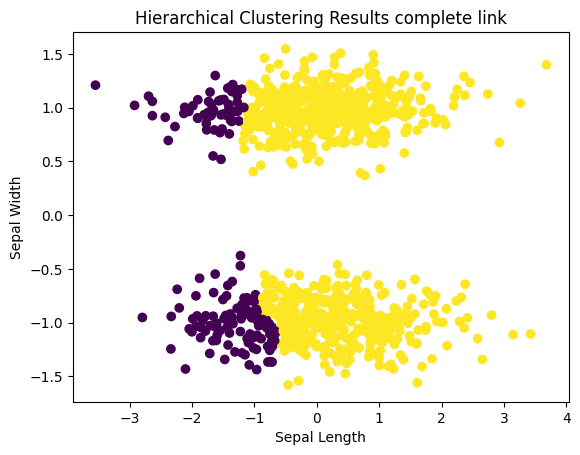

Adjusted Rand Index: 0.03635068648619571


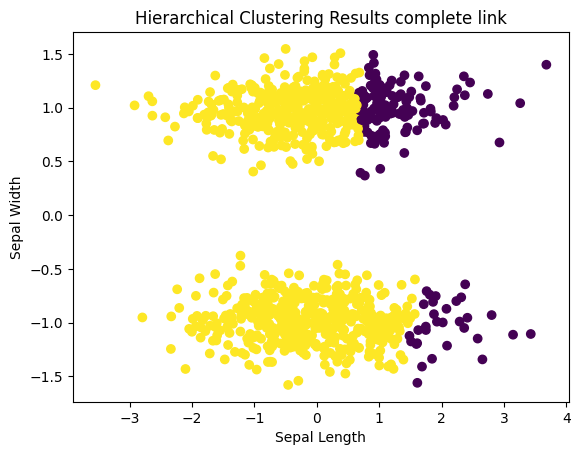

Adjusted Rand Index: 1.0


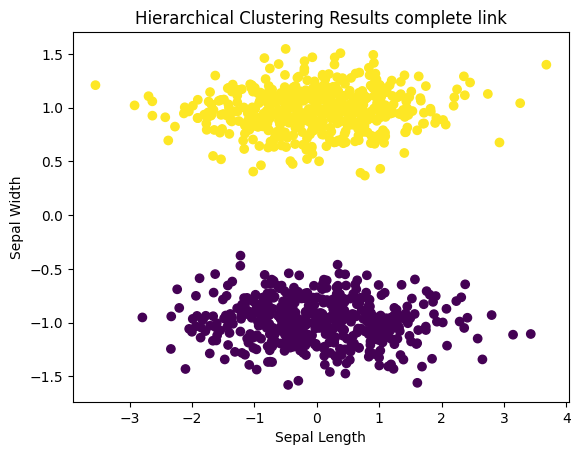

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'complete', 'minkowski', 2)
hierarchical(StandardScaler(), 'complete', 'mahalanobis', 2)
hierarchical(StandardScaler(), 'complete', 'chebyshev', 2)
hierarchical(StandardScaler(), 'complete', 'cosine', 2)

*Average Link*

Adjusted Rand Index: 1.0


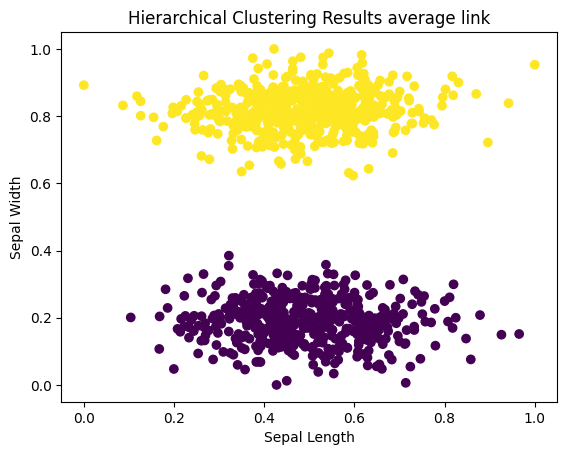

Adjusted Rand Index: 0.000200739823873989


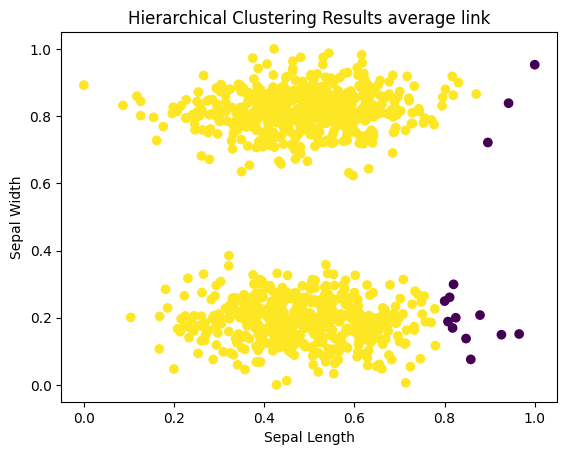

Adjusted Rand Index: 1.0


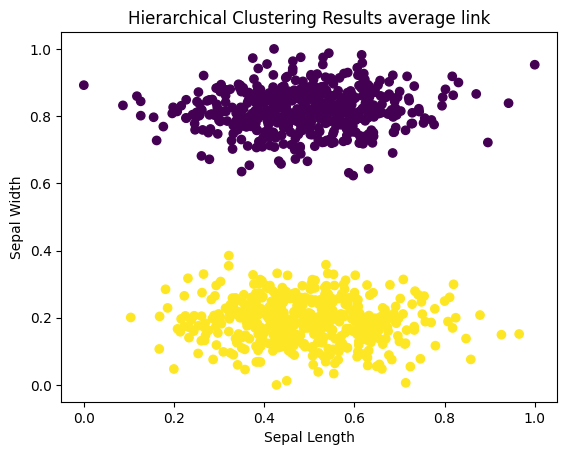

Adjusted Rand Index: 0.9408408007691188


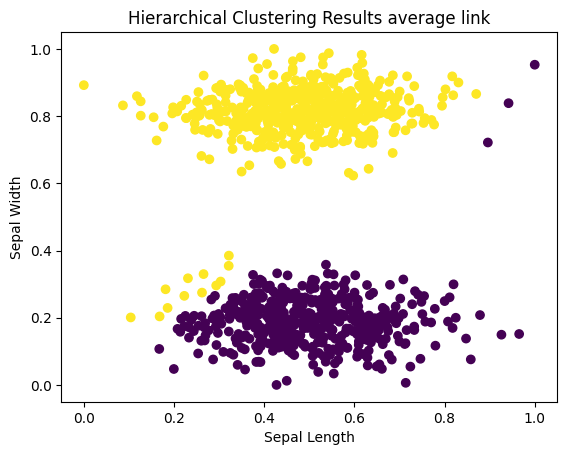

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'average', 'minkowski', 2)
hierarchical(MinMaxScaler(), 'average', 'mahalanobis', 2)
hierarchical(MinMaxScaler(), 'average', 'chebyshev', 2)
hierarchical(MinMaxScaler(), 'average', 'cosine', 2)

Adjusted Rand Index: 0.3569067782126992


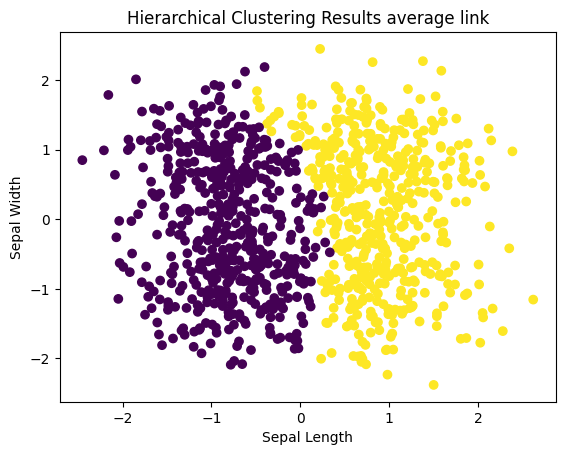

Adjusted Rand Index: 0.357979596471176


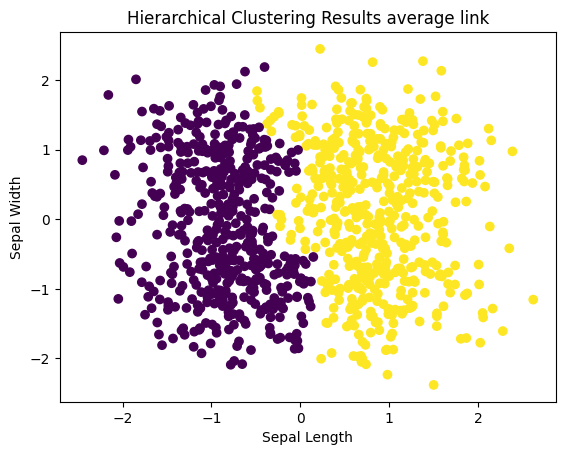

Adjusted Rand Index: 0.3286705442263502


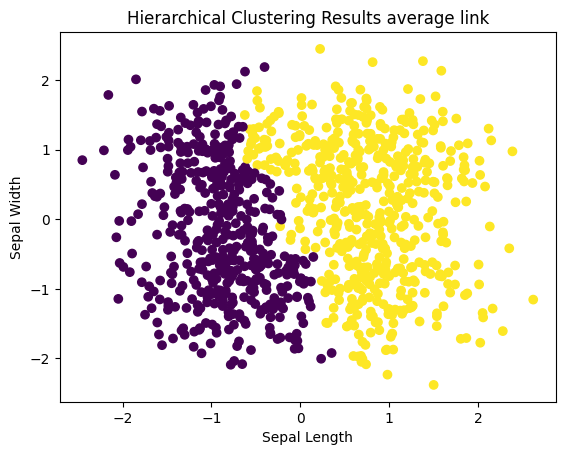

Adjusted Rand Index: 0.3249834800727539


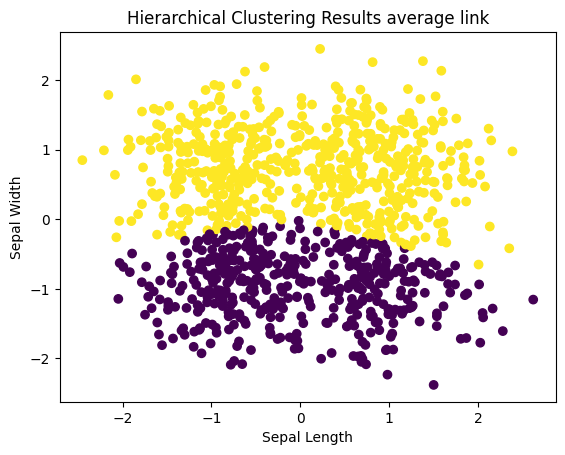

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'average', 'minkowski', 2)
hierarchical(StandardScaler(), 'average', 'mahalanobis', 2)
hierarchical(StandardScaler(), 'average', 'chebyshev', 2)
hierarchical(StandardScaler(), 'average', 'cosine', 2)

*Ward variance*

Adjusted Rand Index: 1.0


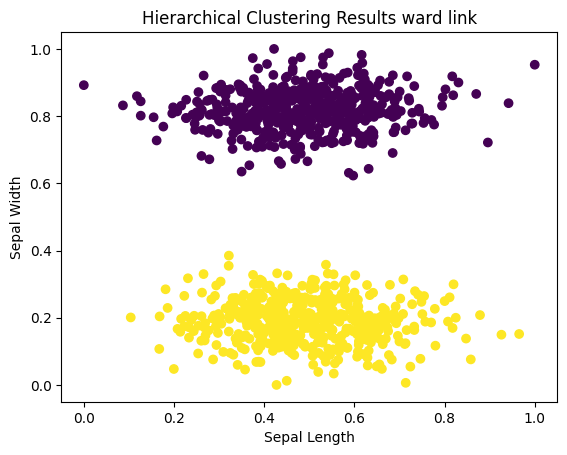

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'ward', 'euclidean', 2)

Adjusted Rand Index: 1.0


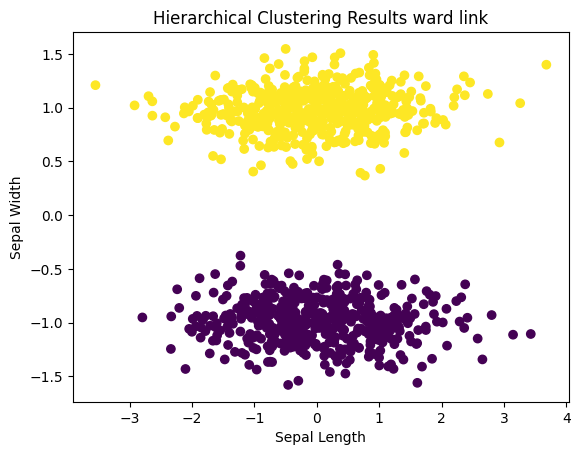

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'ward', 'euclidean', 2)

**Density-based algorithms (DBSCAN)**

In [ ]:
def dbscan_alg(scaler, eps, min_samples, metric):

  X = long.iloc[:, :2]
  Y = long.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  labels = dbscan.fit_predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  return ari, X_scaled, labels

def plot(scaler, metric):

  ari_max = 0
  eps_max = 0
  X_scaled_max = []
  labels_max = []

  for eps in range(1, 101, 1):
    eps = eps / 100.0
    ari, X_scaled, labels = dbscan_alg(scaler, eps, 10, metric)

    if ari_max < ari:
      ari_max = ari
      X_scaled_max = X_scaled
      labels_max = labels
      eps_max = eps

  print("Adjusted Rand Index with eps " + str(eps_max) + " : ", ari_max)

  plt.scatter(X_scaled_max[:, 0], X_scaled_max[:, 1], c=labels_max)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('DBSCAN Clustering Results')
  plt.show()

Adjusted Rand Index with eps 0.15 :  1.0


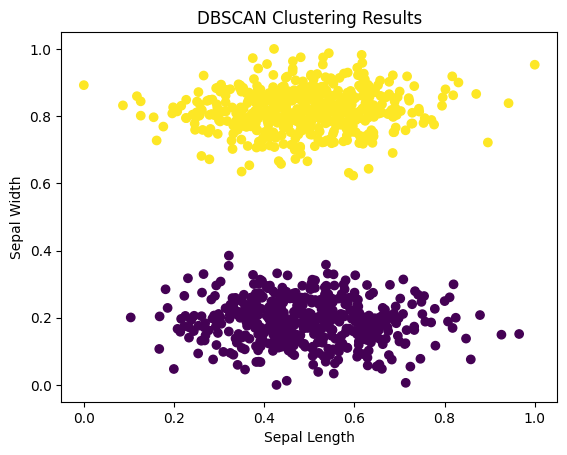

Adjusted Rand Index with eps 0.13 :  1.0


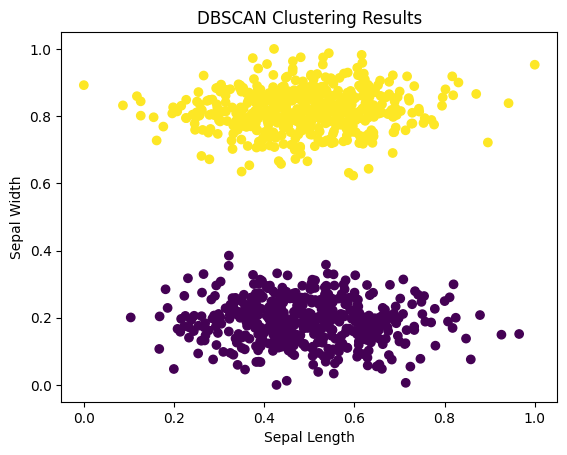

In [ ]:
## Min-Max Scaler

plot(MinMaxScaler(), 'euclidean')
plot(MinMaxScaler(), 'chebyshev')

Adjusted Rand Index with eps 0.74 :  0.9960119920959685


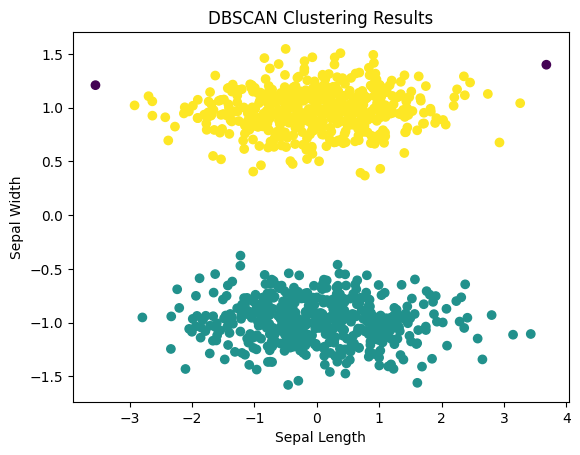

Adjusted Rand Index with eps 0.76 :  0.998001996003992


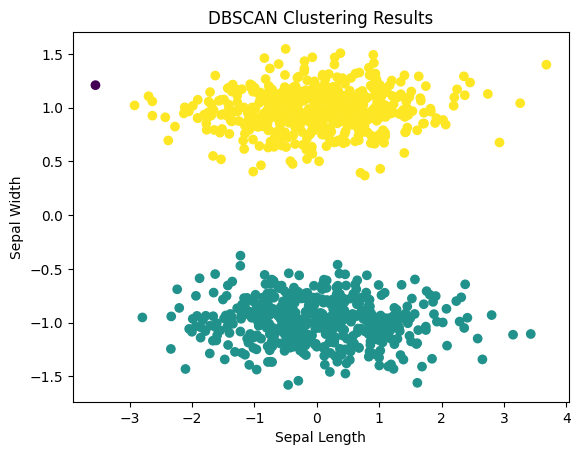

In [ ]:
## Z-Score Scaler

plot(StandardScaler(), 'euclidean')
plot(StandardScaler(), 'chebyshev')

**Self - organizing maps (SOM)**

(800, 2) (800,) (200, 2) (200,)
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Iteration:  7000
Iteration:  8000
Iteration:  9000
Iteration:  10000
Iteration:  11000
Iteration:  12000
Iteration:  13000
Iteration:  14000
Iteration:  15000
Iteration:  16000
Iteration:  17000
Iteration:  18000
Iteration:  19000
Iteration:  20000
SOM training completed


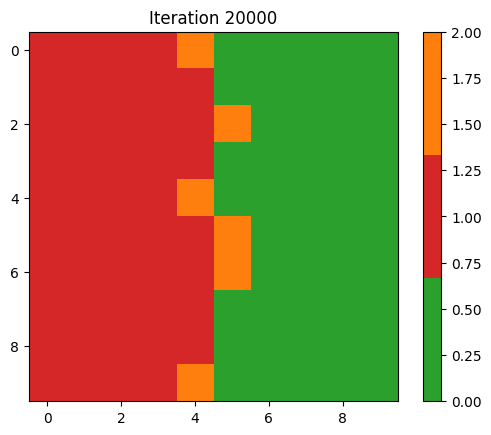

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.7909035437730536


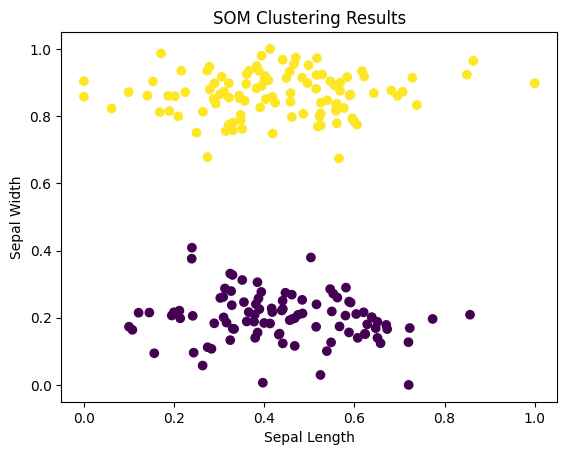

In [ ]:
data_x = long.iloc[:, :2]
data_y = long.iloc[:, 2]

train_x, test_x, train_y, test_y = train_test_split(data_x, data_y, test_size=0.2, random_state=42)
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)

train_x = train_x.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

test_x = test_x.reset_index(drop=True)
test_y = test_y.reset_index(drop=True)

def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def e_distance(x,y):
  return distance.euclidean(x,y)

def m_distance(x,y):
  return distance.cityblock(x,y)

def winning_neuron(data, t, som, num_rows, num_cols):
  winner = [0,0]
  shortest_distance = np.sqrt(data.shape[1])
  input_data = data[t]
  for row in range(num_rows):
    for col in range(num_cols):
      distance = e_distance(som[row][col], data[t])
      if distance < shortest_distance:
        shortest_distance = distance
        winner = [row,col]
  return winner

def decay(step, max_steps,max_learning_rate,max_m_dsitance):
  coefficient = 1.0 - (np.float64(step)/max_steps)
  learning_rate = coefficient*max_learning_rate
  neighbourhood_range = ceil(coefficient * max_m_dsitance)
  return learning_rate, neighbourhood_range

num_rows = 10
num_cols = 10
max_m_dsitance = 4
max_learning_rate = 0.5
max_steps = 20000

train_x_norm = minmax_scaler(train_x)

num_dims = train_x_norm.shape[1]
np.random.seed(40)
som = np.random.random_sample(size=(num_rows, num_cols, num_dims))

for step in range(max_steps):
  if (step+1) % 1000 == 0:
    print("Iteration: ", step+1)
  learning_rate, neighbourhood_range = decay(step, max_steps,max_learning_rate,max_m_dsitance)

  t = np.random.randint(0,high=train_x_norm.shape[0])
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  for row in range(num_rows):
    for col in range(num_cols):
      if m_distance([row,col],winner) <= neighbourhood_range:
        som[row][col] += learning_rate*(train_x_norm[t]-som[row][col]) #update neighbour's weight

print("SOM training completed")

label_data = train_y
map = np.empty(shape=(num_rows, num_cols), dtype=object)

for row in range(num_rows):
  for col in range(num_cols):
    map[row][col] = []

for t in range(train_x_norm.shape[0]):
  if (t+1) % 1000 == 0:
    print("sample data: ", t+1)
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  map[winner[0]][winner[1]].append(label_data[t])

label_map = np.zeros(shape=(num_rows, num_cols),dtype=np.int64)
for row in range(num_rows):
  for col in range(num_cols):
    label_list = map[row][col]
    if len(label_list)==0:
      label = 2
    else:
      label = max(label_list, key=label_list.count)
    label_map[row][col] = label

title = ('Iteration ' + str(max_steps))
cmap = colors.ListedColormap(['tab:green', 'tab:red', 'tab:orange'])
plt.imshow(label_map, cmap=cmap)
plt.colorbar()
plt.title(title)
plt.show()

kmeans = KMeans(n_clusters=3, random_state=42).fit(som.reshape(num_rows * num_cols, -1))
clustered = kmeans.predict(som.reshape(num_rows * num_cols, -1))

data = minmax_scaler(test_x)

winner_labels = []

for t in range(data.shape[0]):
 winner = winning_neuron(data, t, som, num_rows, num_cols)
 row = winner[0]
 col = winner[1]
 predicted = clustered[row * num_cols + col]
 winner_labels.append(predicted)

ari = adjusted_rand_score(test_y, np.array(winner_labels))
print(ari)

plt.scatter(data[:, 0], data[:, 1], c=test_y)
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('SOM Clustering Results')
plt.show()

**The square data analisys**

In [ ]:
square = pd.read_csv("square.data", header=None, sep=" ")
square.head()

,0,1,2
0,6.10273,6.28359,0
1,5.46167,8.29113,0
2,6.50055,4.81082,0
3,5.00059,9.02367,0
4,3.66494,11.85230,0


In [ ]:
square.shape

(1000, 3)

In [ ]:
square.isna().sum()

0    0
1    0
2    0
dtype: int64

In [ ]:
## Target variable distribution

target_counts = square.iloc[:, 2].value_counts()
target_distribution = target_counts / target_counts.sum()

print(target_distribution)

0    0.25
1    0.25
2    0.25
3    0.25
Name: 2, dtype: float64


*Execute the algorithms*

**K-Means**

In [ ]:
def k_means(scaler, max_iter, k):

  X = square.iloc[:, :2]
  Y = square.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.6909048680390053


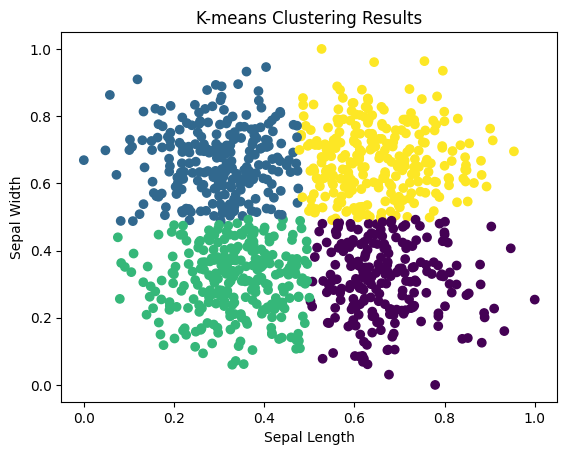

In [ ]:
## Min-Max Scaler

k_means(MinMaxScaler(), 300, 4)
# k_means(MinMaxScaler(), 500, 4)
# k_means(MinMaxScaler(), 1000, 4)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.6909048680390053


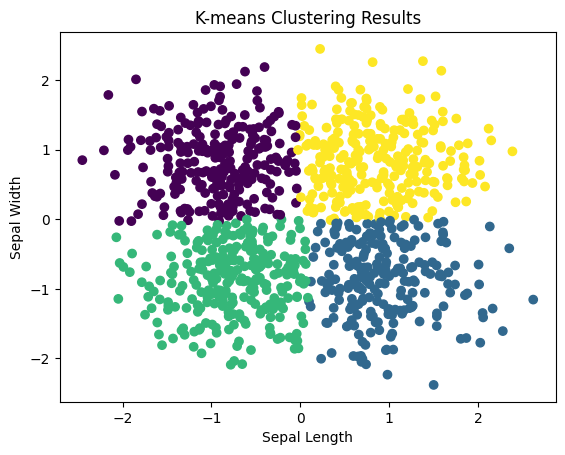

In [ ]:
## Z-Score Scaler

k_means(StandardScaler(), 300, 4)
# k_means(StandardScaler(), 500, 4)
# k_means(StandardScaler(), 1000, 4)

**EM for clustering under Gaussian assumptions**

In [ ]:
def em(scaler, max_iter, k):

  X = square.iloc[:, :2]
  Y = square.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

Adjusted Rand Index: 0.6844401817390434


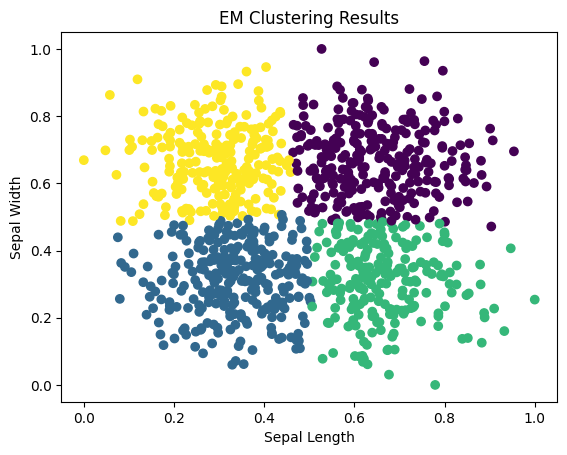

In [ ]:
## Min-Max Scaler

em(MinMaxScaler(), 100, 4)
# em(MinMaxScaler(), 500, 4)
# em(MinMaxScaler(), 1000, 4)

Adjusted Rand Index: 0.6821867797761458


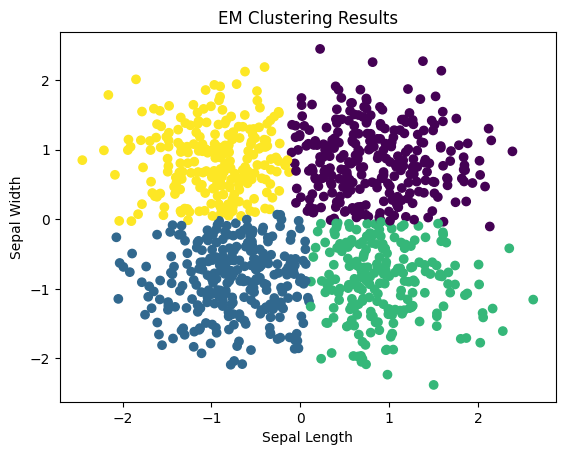

In [ ]:
## Z-Score Scaler

em(StandardScaler(), 300, 4)
# em(StandardScaler(), 500, 4)
# em(StandardScaler(), 1000, 4)

**Hierarchical algorithms**

In [ ]:
def hierarchical(scaler, method, metric, k):
  X = square.iloc[:, :2]
  Y = square.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  linkage_matrix = linkage(X_scaled, method=method, metric=metric)
  labels = fcluster(linkage_matrix, k, criterion='maxclust')

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title("Hierarchical Clustering Results " + method + " link")
  plt.show()

*Single link*

Adjusted Rand Index: 1.3507537471235578e-06


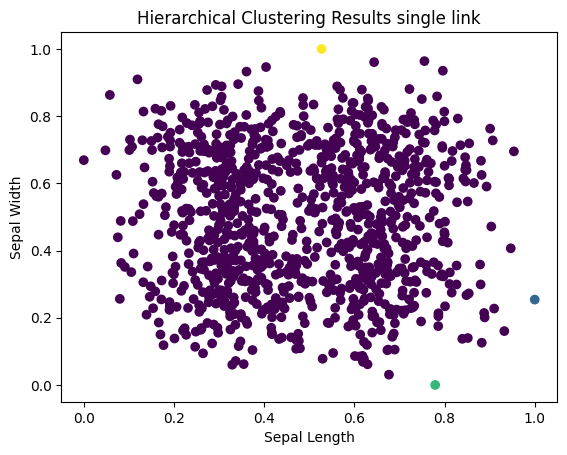

Adjusted Rand Index: 1.3507537471235578e-06


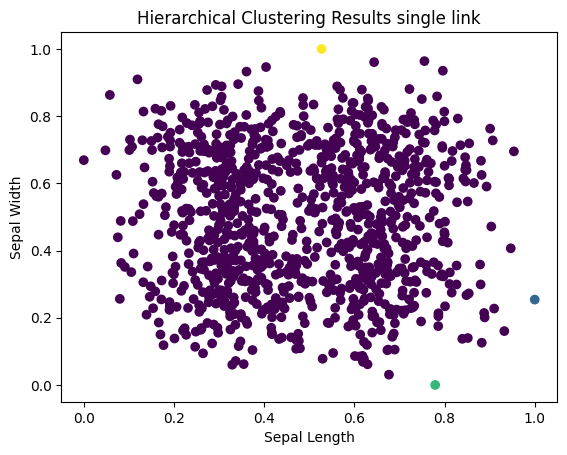

Adjusted Rand Index: 1.3507537471235578e-06


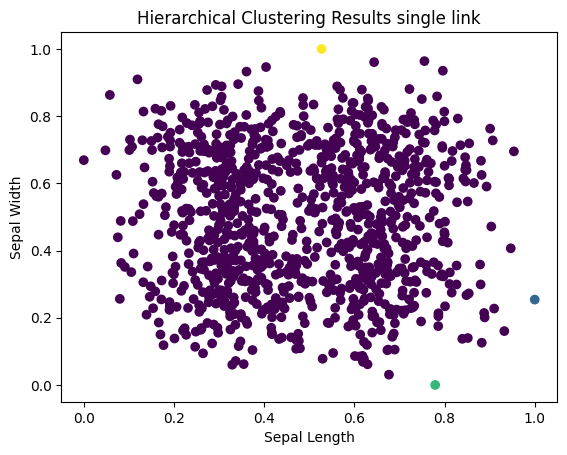

Adjusted Rand Index: 1.6155708916014088e-05


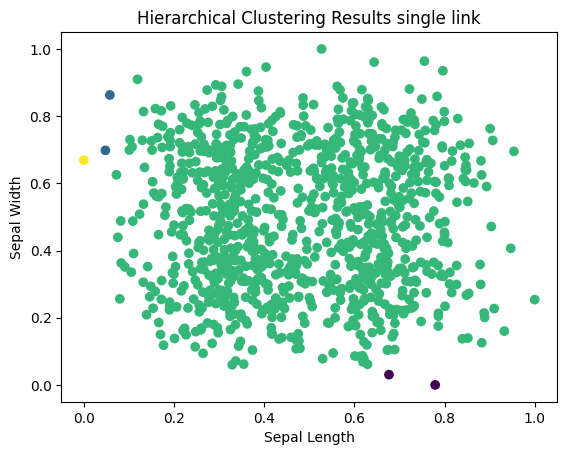

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'single', 'minkowski', 4)
hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 4)
hierarchical(MinMaxScaler(), 'single', 'chebyshev', 4)
hierarchical(MinMaxScaler(), 'single', 'cosine', 4)

Adjusted Rand Index: 1.3507537471235578e-06


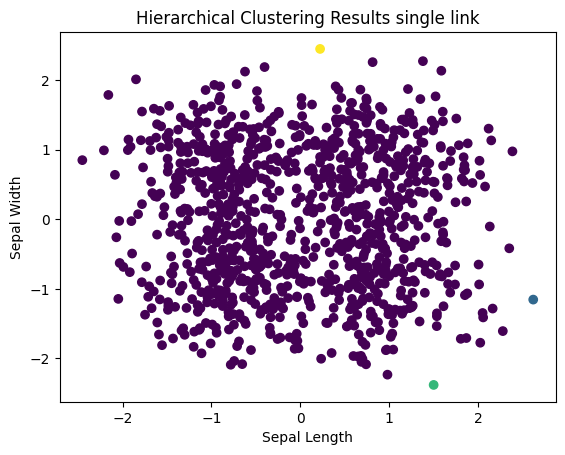

Adjusted Rand Index: 1.3507537471235578e-06


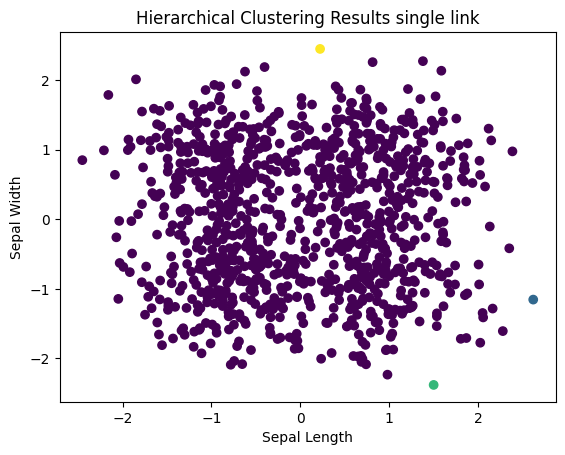

Adjusted Rand Index: 1.3507537471235578e-06


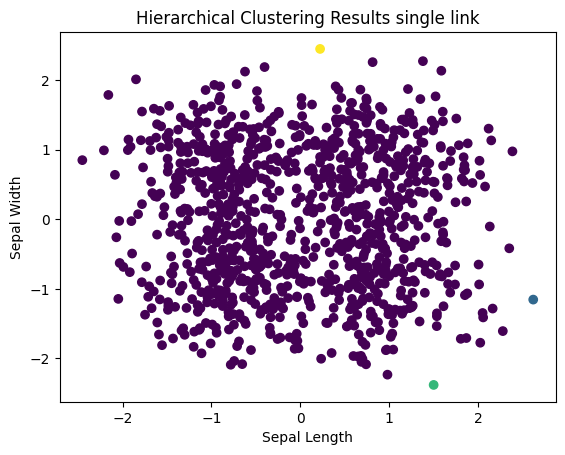

Adjusted Rand Index: 0.509918668461644


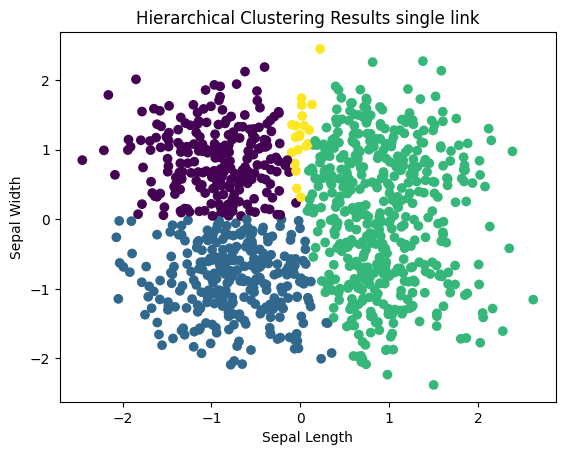

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'single', 'minkowski', 4)
hierarchical(StandardScaler(), 'single', 'mahalanobis', 4)
hierarchical(StandardScaler(), 'single', 'chebyshev', 4)
hierarchical(StandardScaler(), 'single', 'cosine', 4)

*Complete link*

Adjusted Rand Index: 0.4544652516932665


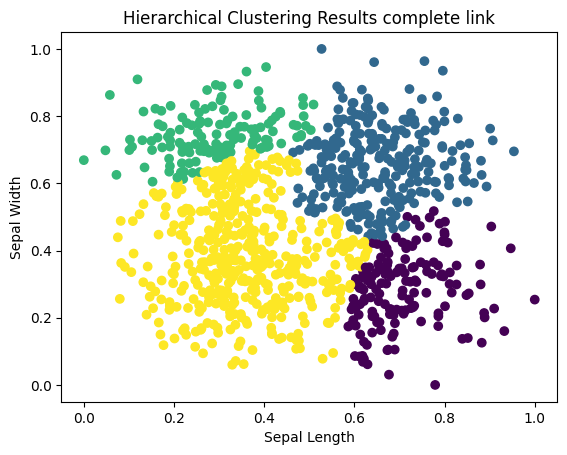

Adjusted Rand Index: 0.5329045672226177


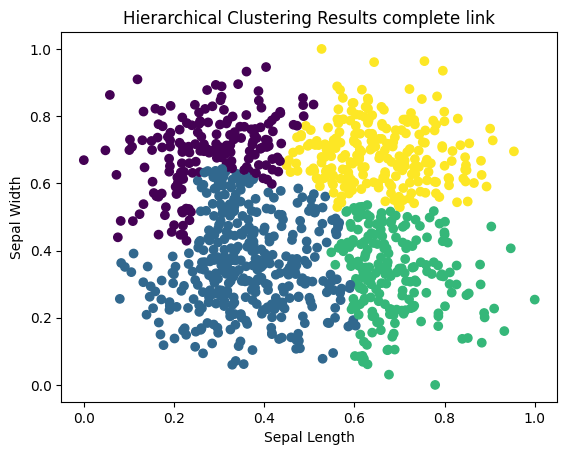

Adjusted Rand Index: 0.4000967913458879


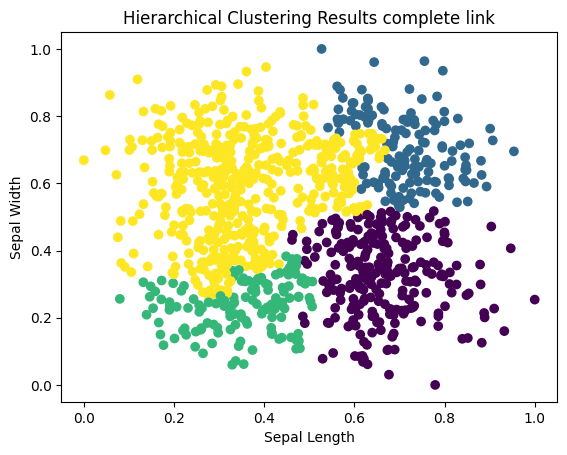

Adjusted Rand Index: 0.2906272437158951


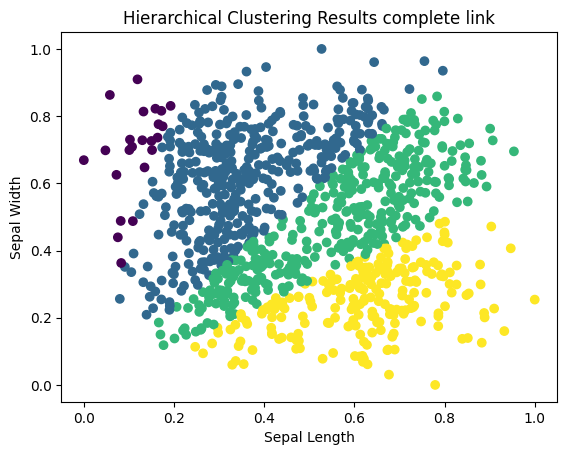

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'complete', 'minkowski', 4)
hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 4)
hierarchical(MinMaxScaler(), 'complete', 'chebyshev', 4)
hierarchical(MinMaxScaler(), 'complete', 'cosine', 4)

Adjusted Rand Index: 0.45803772005971105


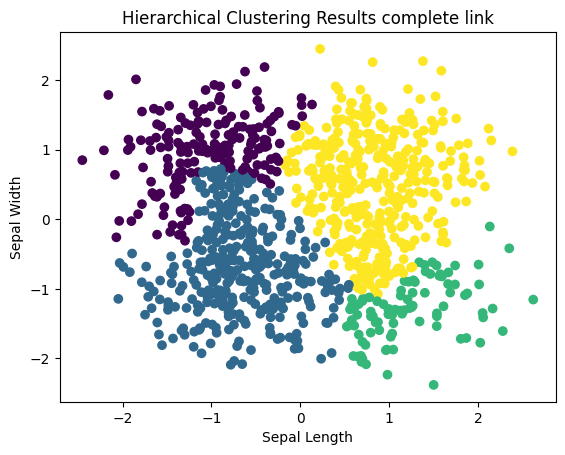

Adjusted Rand Index: 0.5329045672226177


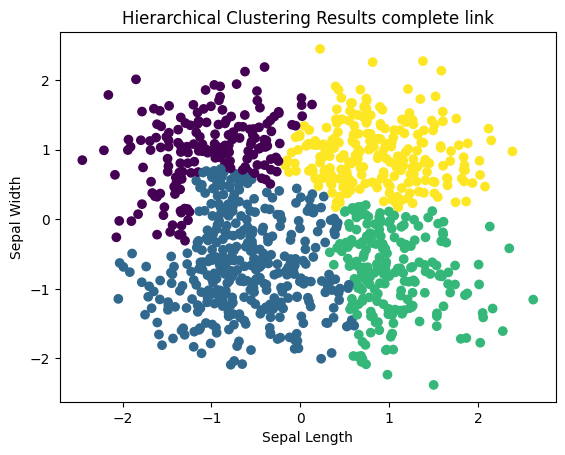

Adjusted Rand Index: 0.48526789914304413


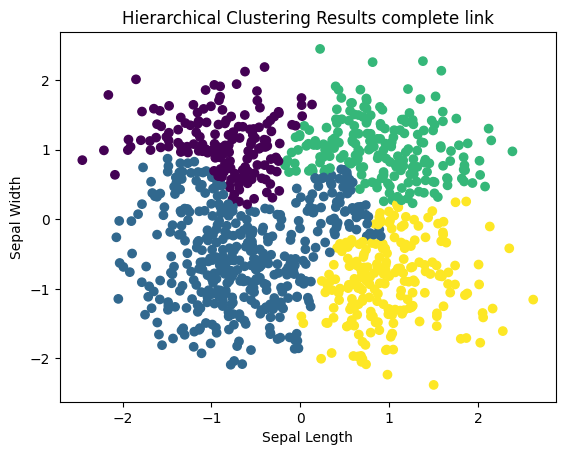

Adjusted Rand Index: 0.504052767750263


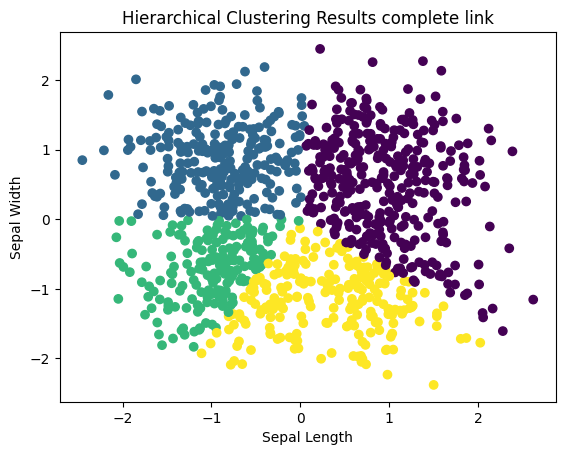

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'complete', 'minkowski', 4)
hierarchical(StandardScaler(), 'complete', 'mahalanobis', 4)
hierarchical(StandardScaler(), 'complete', 'chebyshev', 4)
hierarchical(StandardScaler(), 'complete', 'cosine', 4)

*Average Link*

Adjusted Rand Index: 0.6448833594456927


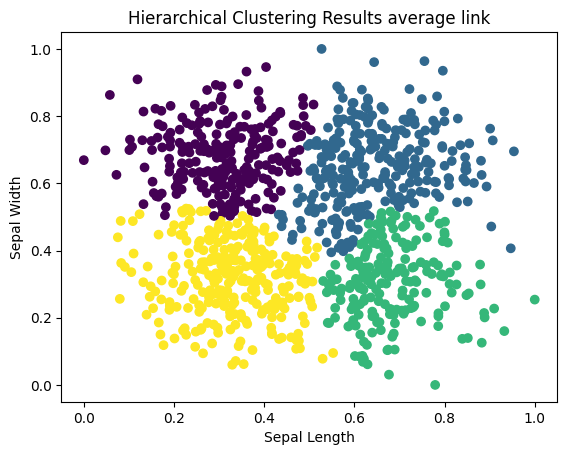

Adjusted Rand Index: 0.5861129879853141


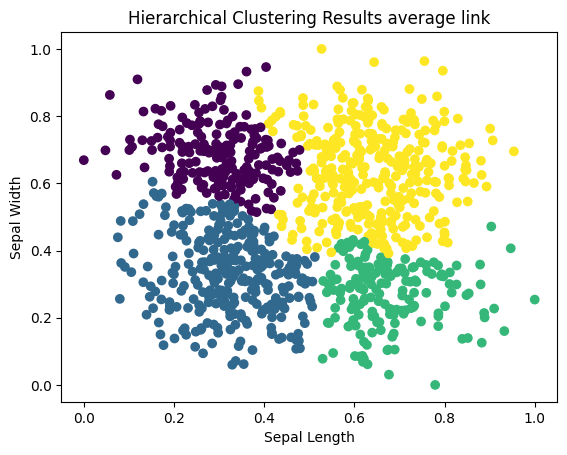

Adjusted Rand Index: 0.587541368317804


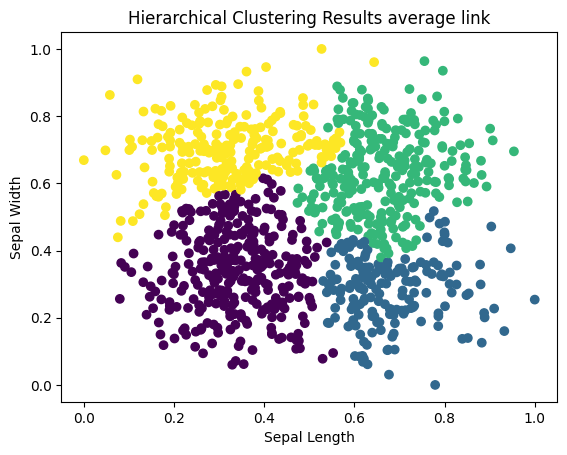

Adjusted Rand Index: 0.30669338913536875


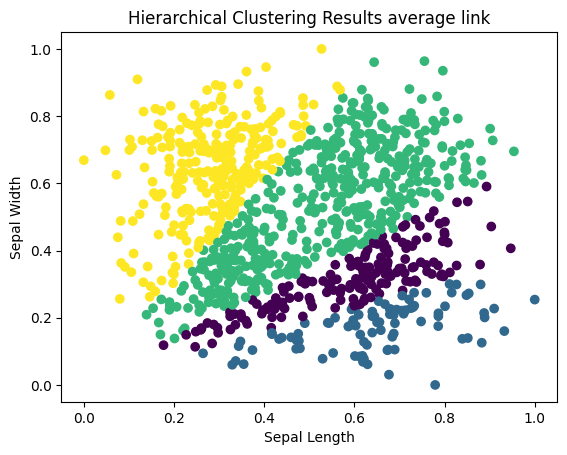

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'average', 'minkowski', 4)
hierarchical(MinMaxScaler(), 'average', 'mahalanobis', 4)
hierarchical(MinMaxScaler(), 'average', 'chebyshev', 4)
hierarchical(MinMaxScaler(), 'average', 'cosine', 4)

Adjusted Rand Index: 0.6029483766056315


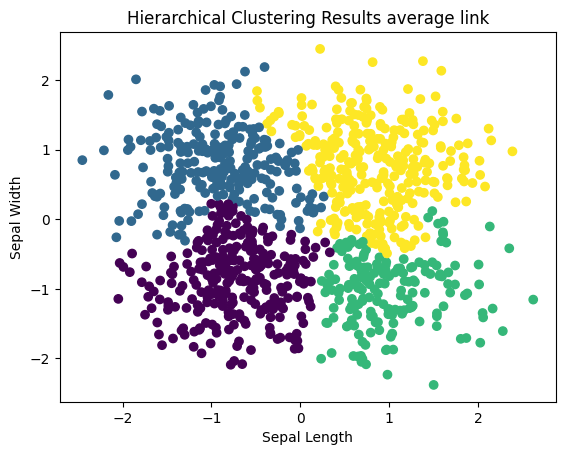

Adjusted Rand Index: 0.5861129879853141


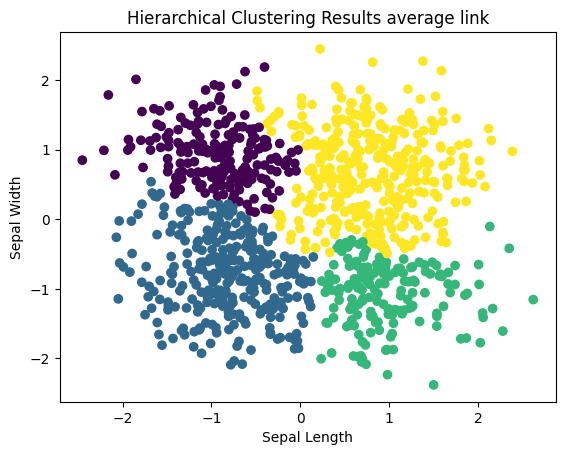

Adjusted Rand Index: 0.5739205645500693


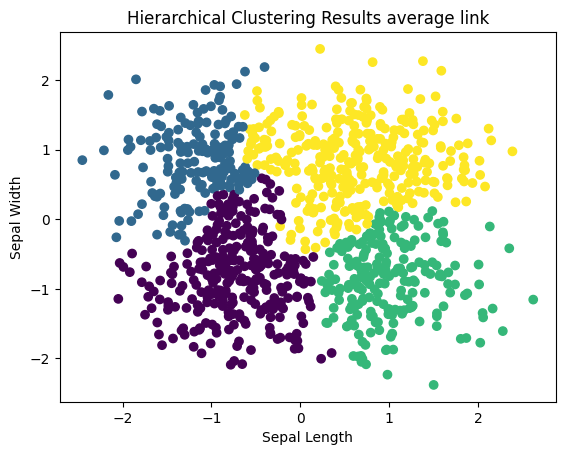

Adjusted Rand Index: 0.6067330893553097


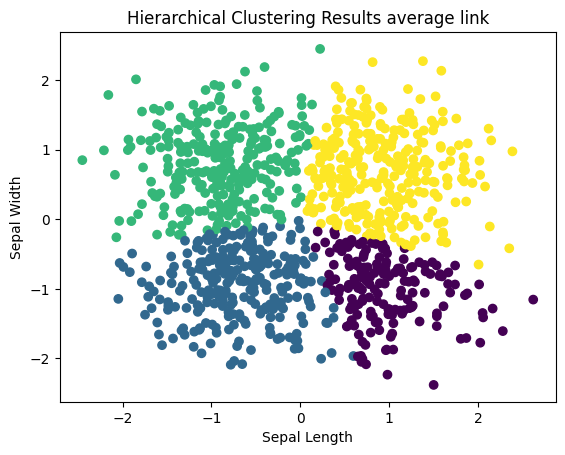

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'average', 'minkowski', 4)
hierarchical(StandardScaler(), 'average', 'mahalanobis', 4)
hierarchical(StandardScaler(), 'average', 'chebyshev', 4)
hierarchical(StandardScaler(), 'average', 'cosine', 4)

*Ward variance*

Adjusted Rand Index: 0.6019760662413867


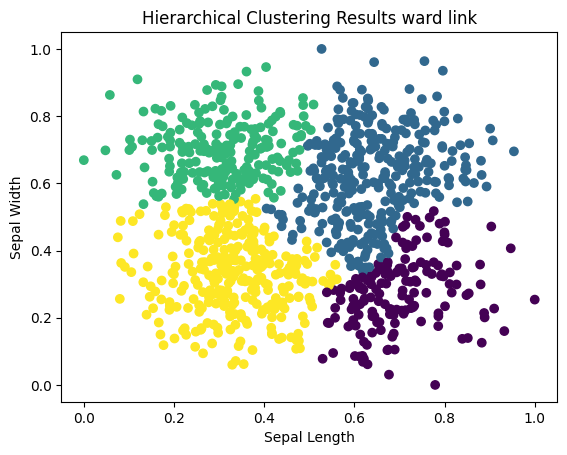

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'ward', 'euclidean', 4)

Adjusted Rand Index: 0.5946287023125574


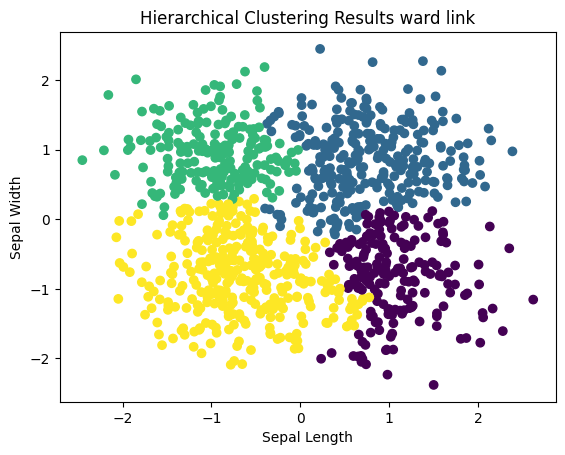

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'ward', 'euclidean', 4)

**Density-based algorithms (DBSCAN)**

In [ ]:
def dbscan_alg(scaler, eps, min_samples, metric):

  X = square.iloc[:, :2]
  Y = square.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  labels = dbscan.fit_predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  return ari, X_scaled, labels

def plot(scaler, metric):

  ari_max = 0
  eps_max = 0
  X_scaled_max = []
  labels_max = []

  for eps in range(1, 101, 1):
    eps = eps / 100.0
    ari, X_scaled, labels = dbscan_alg(scaler, eps, 10, metric)

    if ari_max < ari:
      ari_max = ari
      X_scaled_max = X_scaled
      labels_max = labels
      eps_max = eps

  print("Adjusted Rand Index with eps " + str(eps_max) + " : ", ari_max)

  plt.scatter(X_scaled_max[:, 0], X_scaled_max[:, 1], c=labels_max)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('DBSCAN Clustering Results')
  plt.show()

Adjusted Rand Index with eps 0.03 :  0.0520098512220047


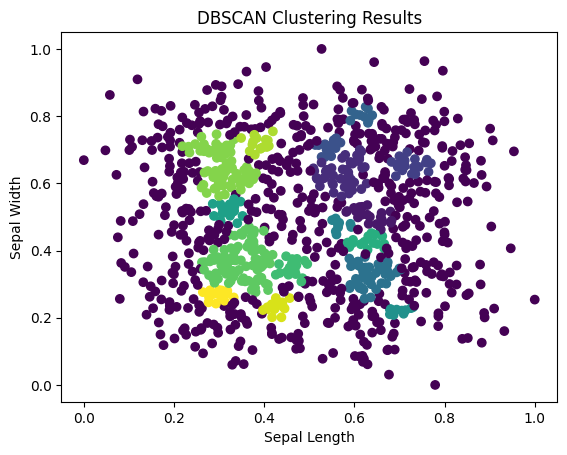

Adjusted Rand Index with eps 0.03 :  0.1194325969076929


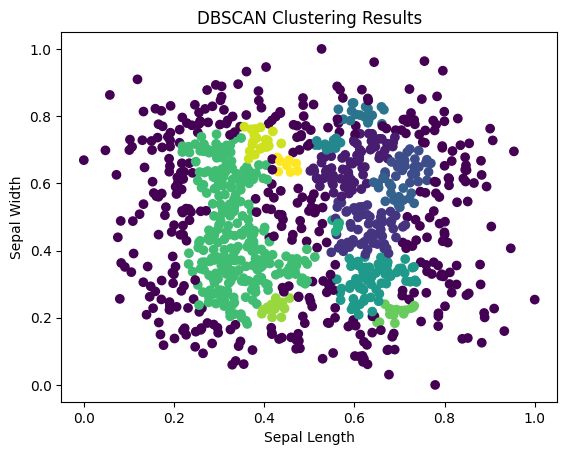

In [ ]:
## Min-Max Scaler

plot(MinMaxScaler(), 'euclidean')
plot(MinMaxScaler(), 'chebyshev')

Adjusted Rand Index with eps 0.19 :  0.23766596768869436


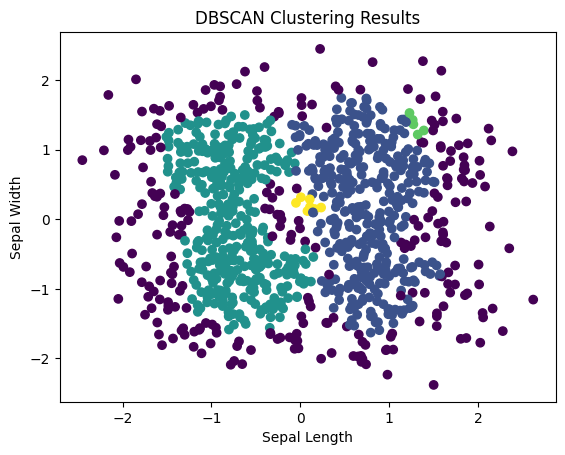

Adjusted Rand Index with eps 0.17 :  0.2570791209839766


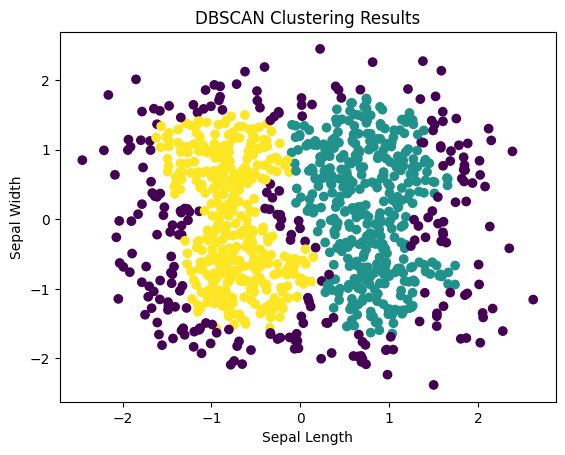

In [ ]:
## Z-Score Scaler

plot(StandardScaler(), 'euclidean')
plot(StandardScaler(), 'chebyshev')

**Self - organizing maps (SOM)**

(800, 2) (800,) (200, 2) (200,)
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Iteration:  7000
Iteration:  8000
Iteration:  9000
Iteration:  10000
Iteration:  11000
Iteration:  12000
Iteration:  13000
Iteration:  14000
Iteration:  15000
Iteration:  16000
Iteration:  17000
Iteration:  18000
Iteration:  19000
Iteration:  20000
SOM training completed


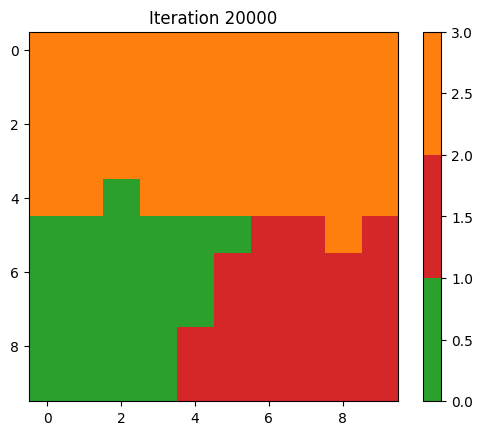

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.4278045192470433


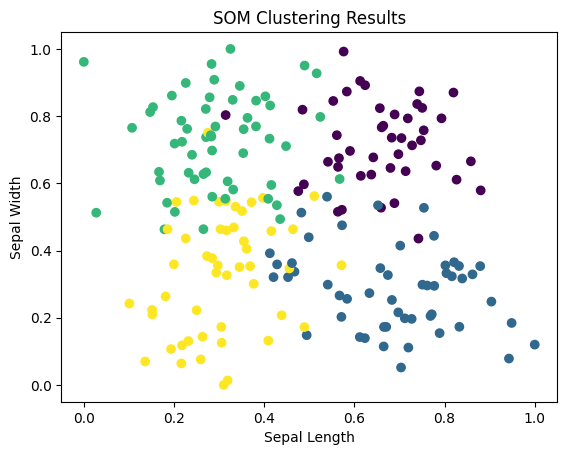

In [ ]:
data_x = square.iloc[:, :2]
data_y = square.iloc[:, 2]

train_x, test_x, train_y, test_y = train_test_split(data_x, data_y, test_size=0.2, random_state=42)
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)

train_x = train_x.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

test_x = test_x.reset_index(drop=True)
test_y = test_y.reset_index(drop=True)

def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def e_distance(x,y):
  return distance.euclidean(x,y)

def m_distance(x,y):
  return distance.cityblock(x,y)

def winning_neuron(data, t, som, num_rows, num_cols):
  winner = [0,0]
  shortest_distance = np.sqrt(data.shape[1])
  input_data = data[t]
  for row in range(num_rows):
    for col in range(num_cols):
      distance = e_distance(som[row][col], data[t])
      if distance < shortest_distance:
        shortest_distance = distance
        winner = [row,col]
  return winner

def decay(step, max_steps,max_learning_rate,max_m_dsitance):
  coefficient = 1.0 - (np.float64(step)/max_steps)
  learning_rate = coefficient*max_learning_rate
  neighbourhood_range = ceil(coefficient * max_m_dsitance)
  return learning_rate, neighbourhood_range

num_rows = 10
num_cols = 10
max_m_dsitance = 4
max_learning_rate = 0.5
max_steps = 20000

train_x_norm = minmax_scaler(train_x)

num_dims = train_x_norm.shape[1]
np.random.seed(40)
som = np.random.random_sample(size=(num_rows, num_cols, num_dims))

for step in range(max_steps):
  if (step+1) % 1000 == 0:
    print("Iteration: ", step+1)
  learning_rate, neighbourhood_range = decay(step, max_steps,max_learning_rate,max_m_dsitance)

  t = np.random.randint(0,high=train_x_norm.shape[0])
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  for row in range(num_rows):
    for col in range(num_cols):
      if m_distance([row,col],winner) <= neighbourhood_range:
        som[row][col] += learning_rate*(train_x_norm[t]-som[row][col]) #update neighbour's weight

print("SOM training completed")

label_data = train_y
map = np.empty(shape=(num_rows, num_cols), dtype=object)

for row in range(num_rows):
  for col in range(num_cols):
    map[row][col] = []

for t in range(train_x_norm.shape[0]):
  if (t+1) % 1000 == 0:
    print("sample data: ", t+1)
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  map[winner[0]][winner[1]].append(label_data[t])

label_map = np.zeros(shape=(num_rows, num_cols),dtype=np.int64)
for row in range(num_rows):
  for col in range(num_cols):
    label_list = map[row][col]
    if len(label_list)==0:
      label = 2
    else:
      label = max(label_list, key=label_list.count)
    label_map[row][col] = label

title = ('Iteration ' + str(max_steps))
cmap = colors.ListedColormap(['tab:green', 'tab:red', 'tab:orange'])
plt.imshow(label_map, cmap=cmap)
plt.colorbar()
plt.title(title)
plt.show()

kmeans = KMeans(n_clusters=3, random_state=42).fit(som.reshape(num_rows * num_cols, -1))
clustered = kmeans.predict(som.reshape(num_rows * num_cols, -1))

data = minmax_scaler(test_x)

winner_labels = []

for t in range(data.shape[0]):
 winner = winning_neuron(data, t, som, num_rows, num_cols)
 row = winner[0]
 col = winner[1]
 predicted = clustered[row * num_cols + col]
 winner_labels.append(predicted)

ari = adjusted_rand_score(test_y, np.array(winner_labels))
print(ari)

plt.scatter(data[:, 0], data[:, 1], c=test_y)
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('SOM Clustering Results')
plt.show()

**The smile data analisys**

*About the dataset*

In [ ]:
smile = pd.read_csv("smile.csv", header=None)
smile.head()

,0,1,2
0,-0.674245,-0.664492,0
1,0.846659,-0.538960,0
2,0.536777,-0.835193,0
3,-0.412617,-1.025037,0
4,-0.776213,-0.494642,0


In [ ]:
smile.shape

(400, 3)

In [ ]:
smile.isna().sum()

0    0
1    0
2    0
dtype: int64

In [ ]:
## Target variable distribution

target_counts = smile.iloc[:, 2].value_counts()
target_distribution = target_counts / target_counts.sum()

print(target_distribution)

1    0.500
0    0.250
2    0.125
3    0.125
Name: 2, dtype: float64


*Execute the algorithms*

**K-Means**

In [ ]:
def k_means(scaler, max_iter, k):

  X = smile.iloc[:, :2]
  Y = smile.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.1851848367390459


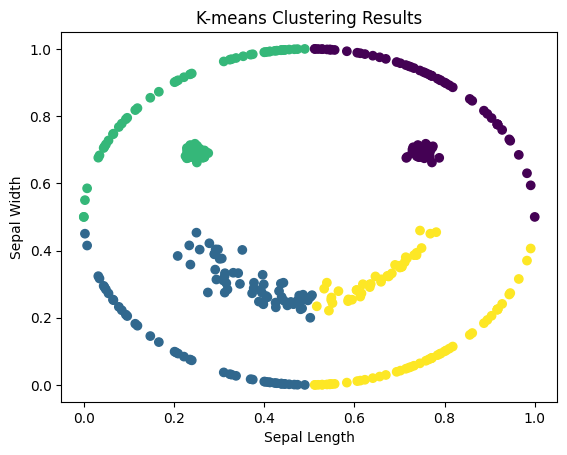

In [ ]:
## Min-Max Scaler

k_means(MinMaxScaler(), 300, 4)
# k_means(MinMaxScaler(), 500, 4)
# k_means(MinMaxScaler(), 1000, 4)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.18553382194749438


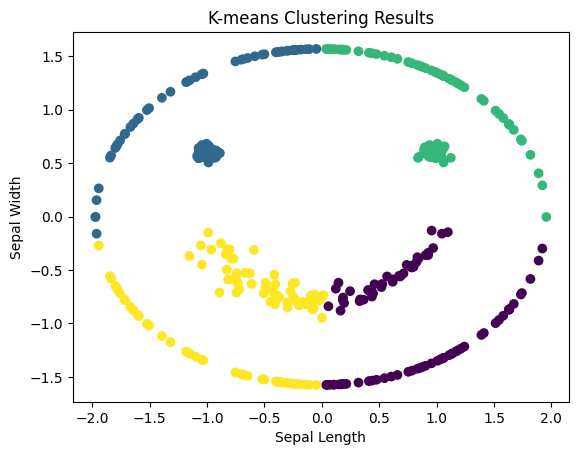

In [ ]:
## Z-Score Scaler

k_means(StandardScaler(), 300, 4)
# k_means(StandardScaler(), 500, 4)
# k_means(StandardScaler(), 1000, 4)

**EM for clustering under Gaussian assumptions**

In [ ]:
def em(scaler, max_iter, k):

  X = smile.iloc[:, :2]
  Y = smile.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

Adjusted Rand Index: 0.19229022827641973


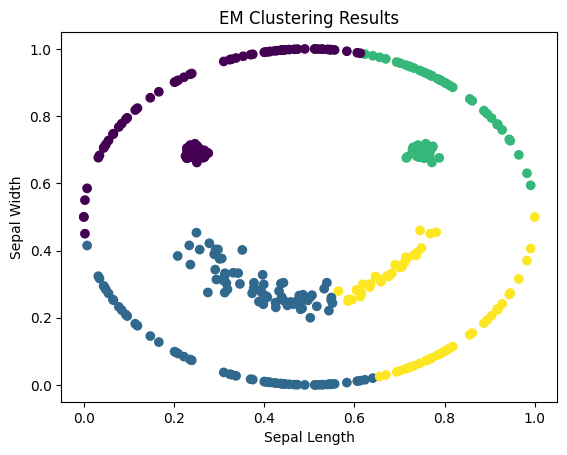

In [ ]:
## Min-Max Scaler

em(MinMaxScaler(), 100, 4)
# em(MinMaxScaler(), 500, 4)
# em(MinMaxScaler(), 1000, 4)

Adjusted Rand Index: 0.19251284537985958


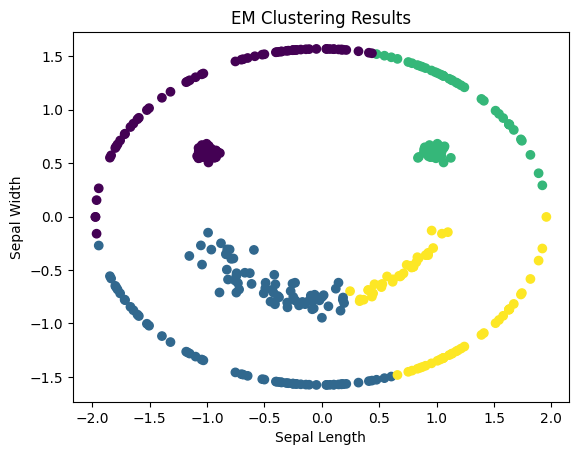

In [ ]:
## Z-Score Scaler

em(StandardScaler(), 300, 4)
# em(StandardScaler(), 500, 4)
# em(StandardScaler(), 1000, 4)

**Hierarchical algorithms**

In [ ]:
def hierarchical(scaler, method, metric, k):
  X = smile.iloc[:, :2]
  Y = smile.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  linkage_matrix = linkage(X_scaled, method=method, metric=metric)
  labels = fcluster(linkage_matrix, k, criterion='maxclust')

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title("Hierarchical Clustering Results " + method + " link")
  plt.show()

*Single link*

Adjusted Rand Index: 1.0


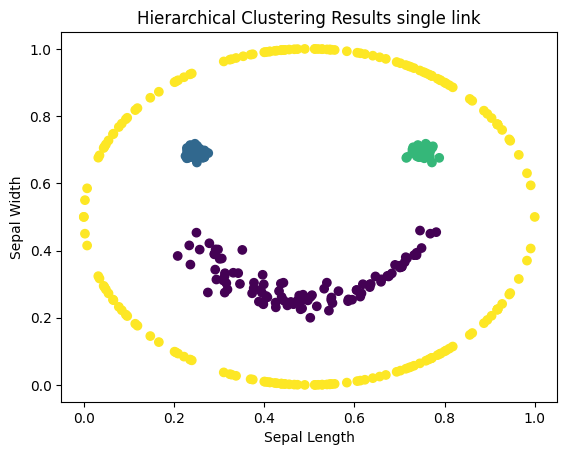

Adjusted Rand Index: 1.0


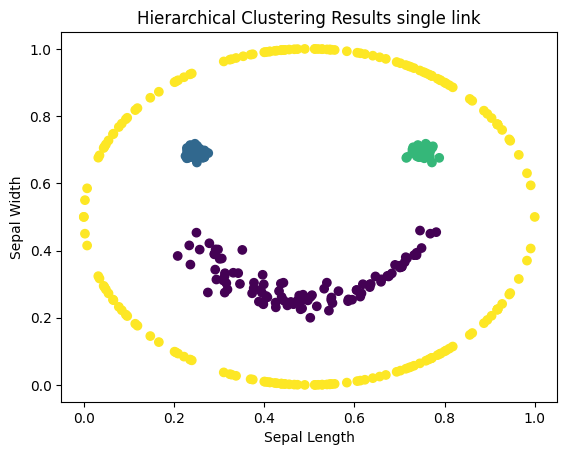

Adjusted Rand Index: 1.0


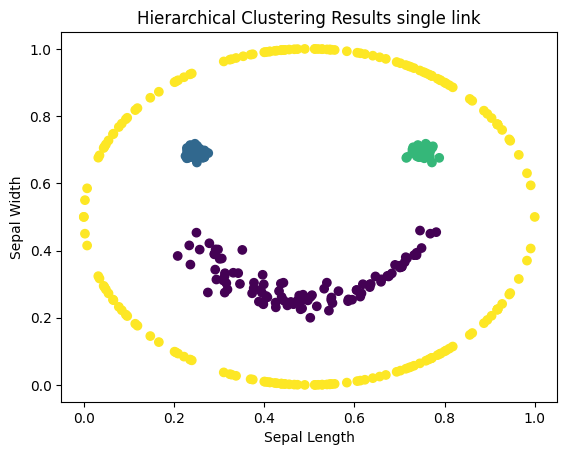

Adjusted Rand Index: -0.06399670746655861


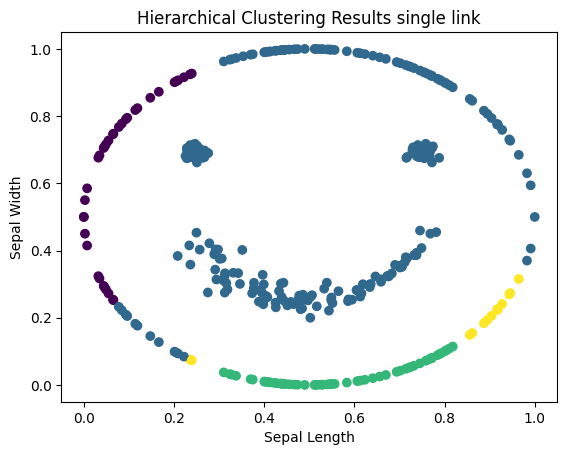

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'single', 'minkowski', 4)
hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 4)
hierarchical(MinMaxScaler(), 'single', 'chebyshev', 4)
hierarchical(MinMaxScaler(), 'single', 'cosine', 4)

Adjusted Rand Index: 1.0


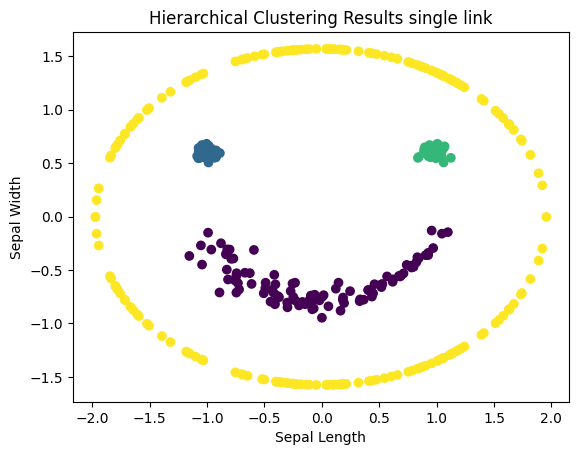

Adjusted Rand Index: 1.0


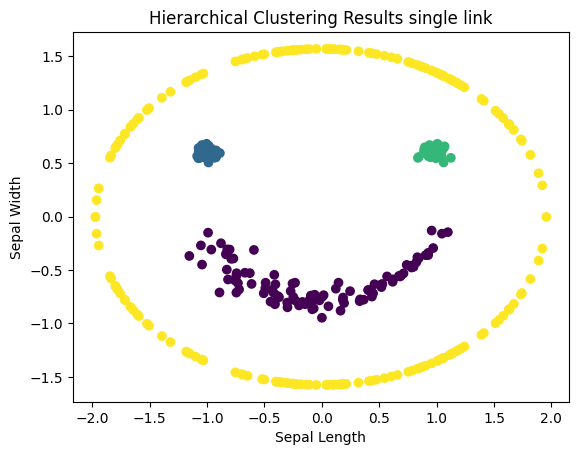

Adjusted Rand Index: 1.0


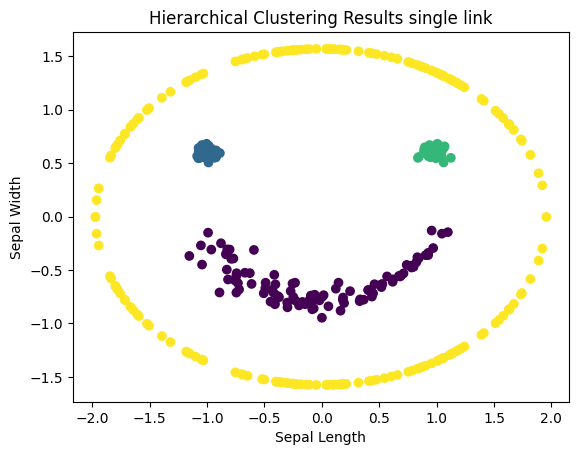

Adjusted Rand Index: 0.27518644762807865


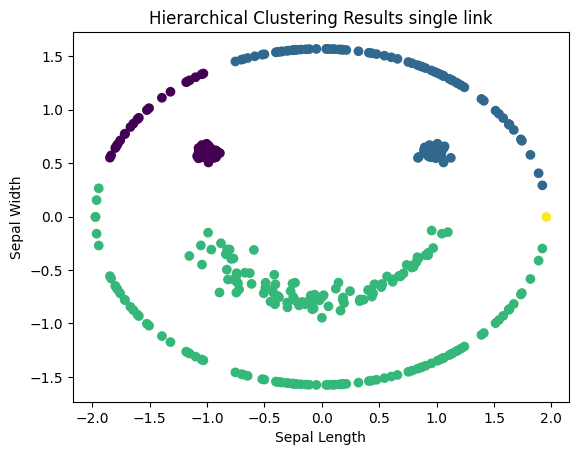

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'single', 'minkowski', 4)
hierarchical(StandardScaler(), 'single', 'mahalanobis', 4)
hierarchical(StandardScaler(), 'single', 'chebyshev', 4)
hierarchical(StandardScaler(), 'single', 'cosine', 4)

*Complete link*

Adjusted Rand Index: 0.19059329705918038


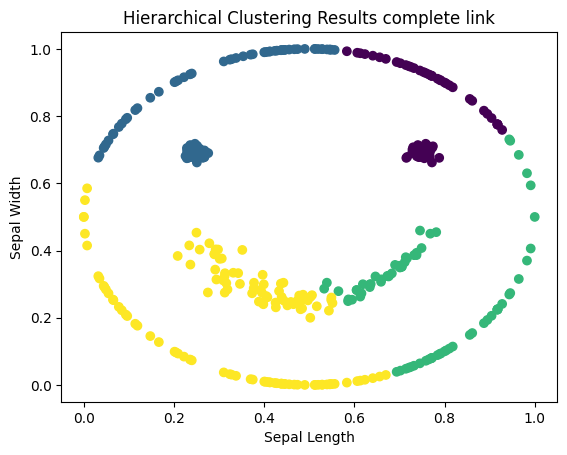

Adjusted Rand Index: 0.2038622216846395


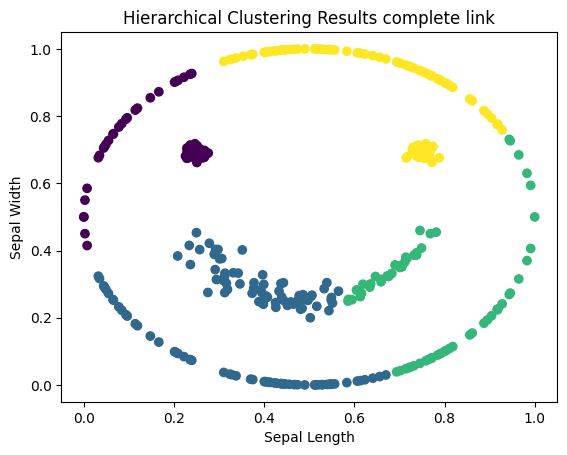

Adjusted Rand Index: 0.18878354075694814


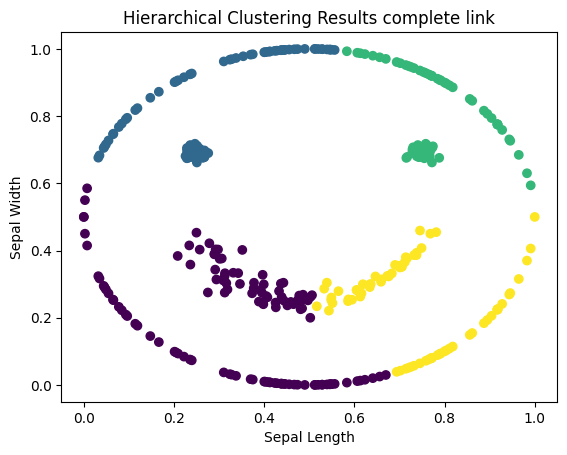

Adjusted Rand Index: 0.19127416138077885


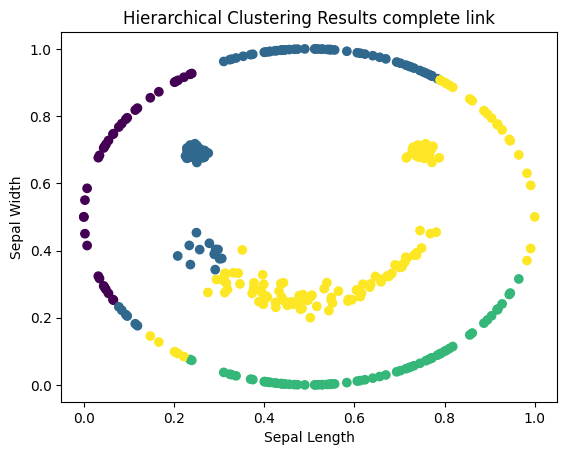

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'complete', 'minkowski', 4)
hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 4)
hierarchical(MinMaxScaler(), 'complete', 'chebyshev', 4)
hierarchical(MinMaxScaler(), 'complete', 'cosine', 4)

Adjusted Rand Index: 0.2038622216846395


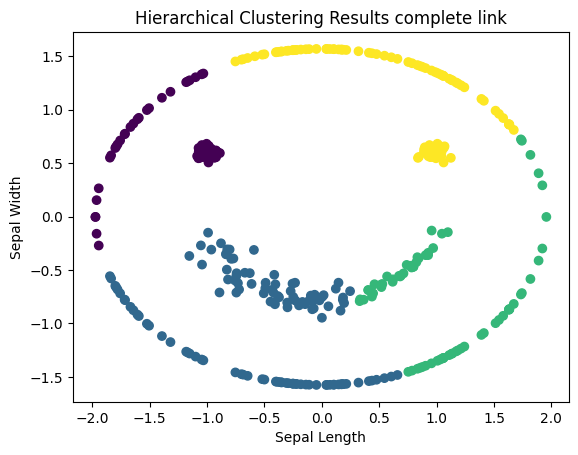

Adjusted Rand Index: 0.2038622216846395


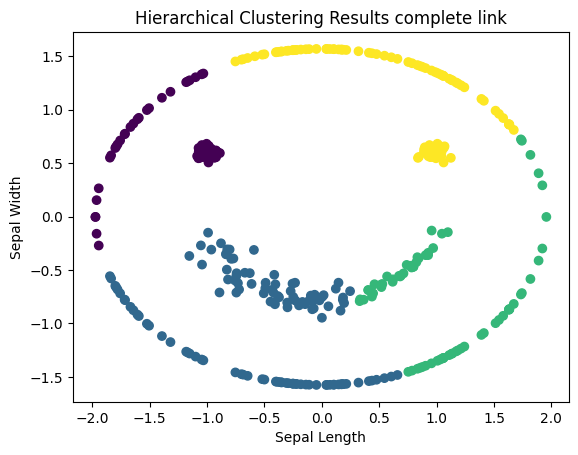

Adjusted Rand Index: 0.18896988955870211


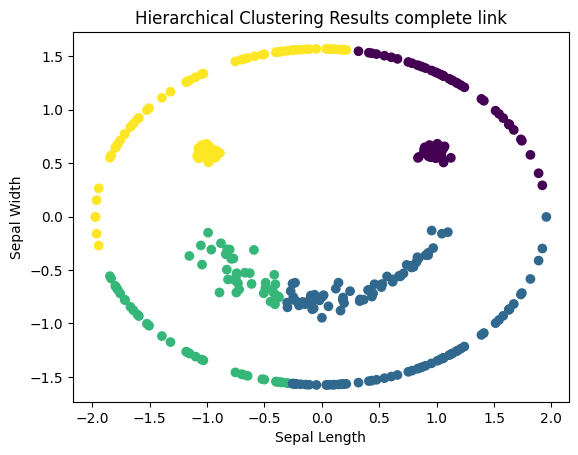

Adjusted Rand Index: 0.15757162346521145


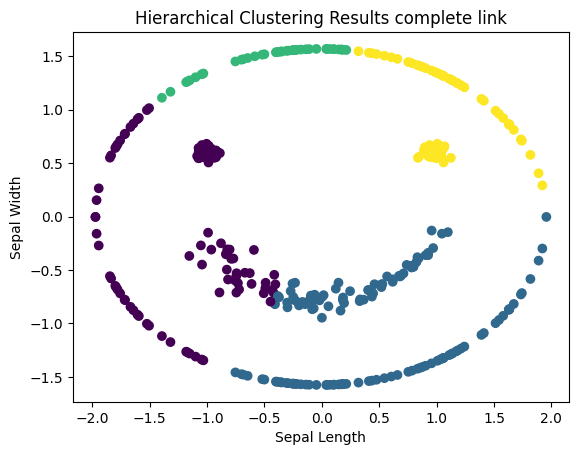

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'complete', 'minkowski', 4)
hierarchical(StandardScaler(), 'complete', 'mahalanobis', 4)
hierarchical(StandardScaler(), 'complete', 'chebyshev', 4)
hierarchical(StandardScaler(), 'complete', 'cosine', 4)

*Average Link*

Adjusted Rand Index: 0.21477856942634743


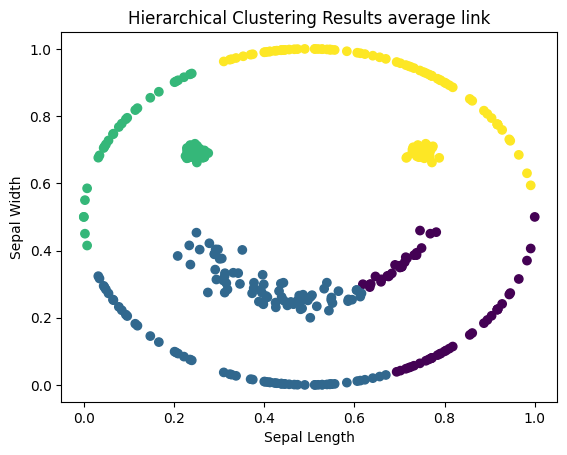

Adjusted Rand Index: 0.2458668674230882


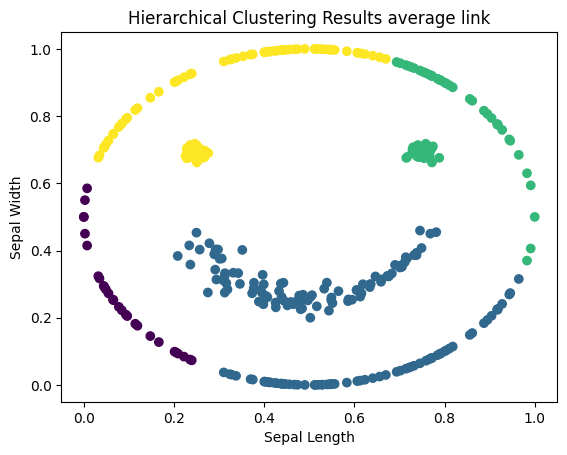

Adjusted Rand Index: 0.19491324908859395


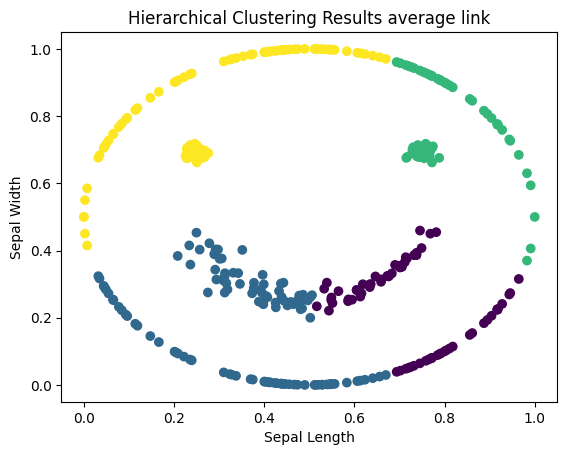

Adjusted Rand Index: 0.21459881394130467


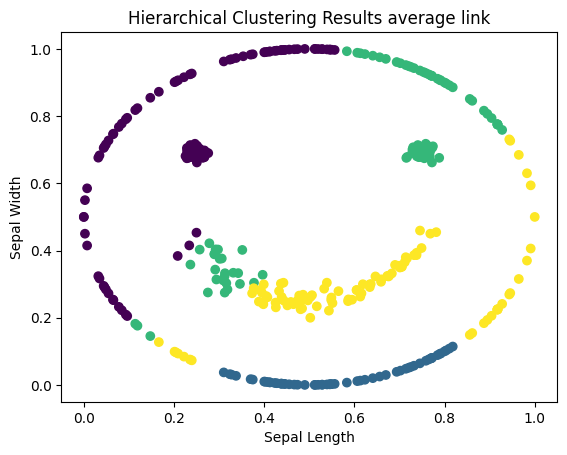

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'average', 'minkowski', 4)
hierarchical(MinMaxScaler(), 'average', 'mahalanobis', 4)
hierarchical(MinMaxScaler(), 'average', 'chebyshev', 4)
hierarchical(MinMaxScaler(), 'average', 'cosine', 4)

Adjusted Rand Index: 0.2458668674230882


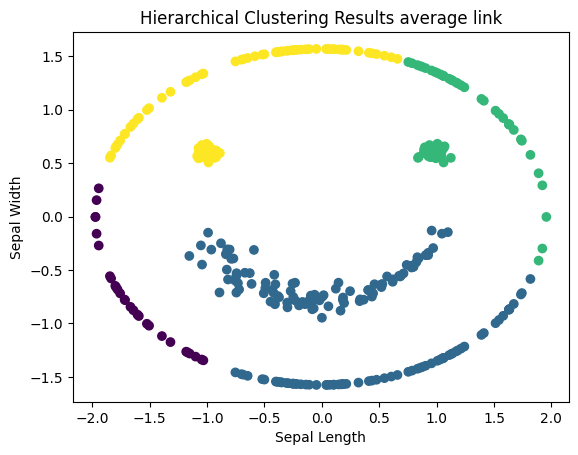

Adjusted Rand Index: 0.2458668674230882


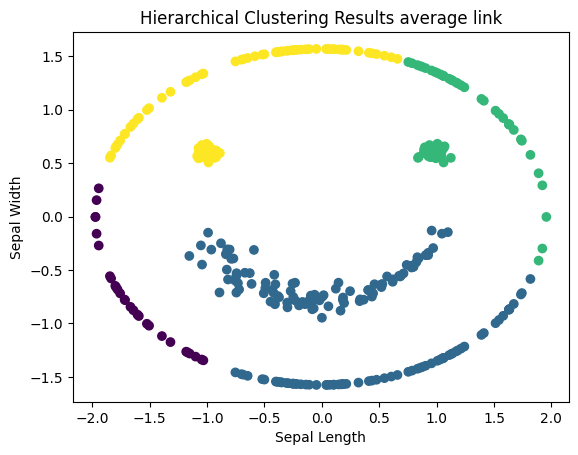

Adjusted Rand Index: 0.24623415361670395


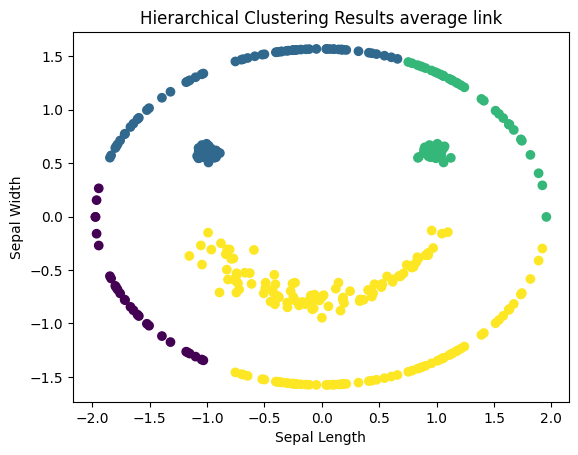

Adjusted Rand Index: 0.20336078413126754


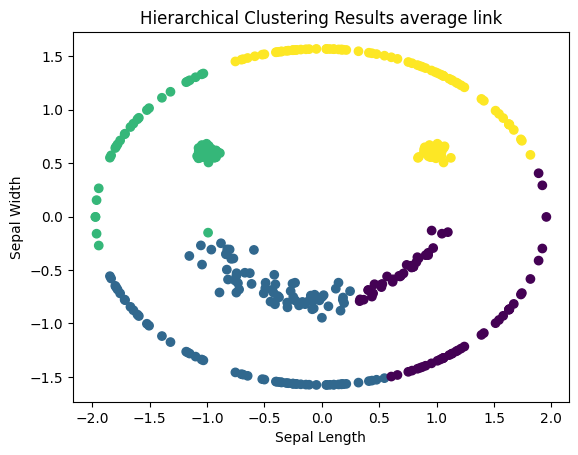

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'average', 'minkowski', 4)
hierarchical(StandardScaler(), 'average', 'mahalanobis', 4)
hierarchical(StandardScaler(), 'average', 'chebyshev', 4)
hierarchical(StandardScaler(), 'average', 'cosine', 4)

*Ward variance*

Adjusted Rand Index: 0.20414654709894994


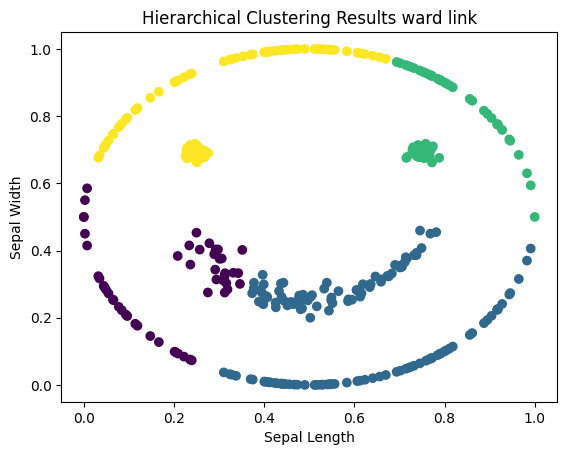

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'ward', 'euclidean', 4)

Adjusted Rand Index: 0.19777777777777777


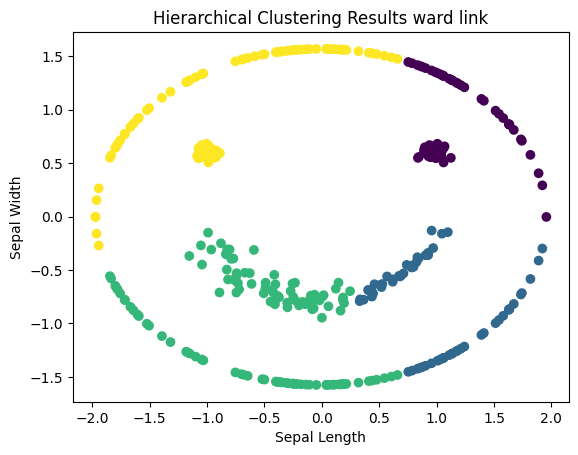

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'ward', 'euclidean', 4)

**Density-based algorithms (DBSCAN)**

In [ ]:
def dbscan_alg(scaler, eps, min_samples, metric):

  X = smile.iloc[:, :2]
  Y = smile.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  labels = dbscan.fit_predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  return ari, X_scaled, labels

def plot(scaler, metric):

  ari_max = 0
  eps_max = 0
  X_scaled_max = []
  labels_max = []

  for eps in range(1, 101, 1):
    eps = eps / 100.0
    ari, X_scaled, labels = dbscan_alg(scaler, eps, 10, metric)

    if ari_max < ari:
      ari_max = ari
      X_scaled_max = X_scaled
      labels_max = labels
      eps_max = eps

  print("Adjusted Rand Index with eps " + str(eps_max) + " : ", ari_max)

  plt.scatter(X_scaled_max[:, 0], X_scaled_max[:, 1], c=labels_max)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('DBSCAN Clustering Results')
  plt.show()

Adjusted Rand Index with eps 0.14 :  0.6916641744728608


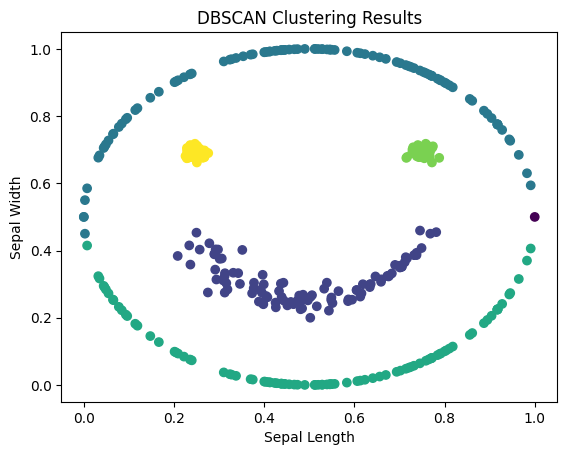

Adjusted Rand Index with eps 0.1 :  0.6786079720600244


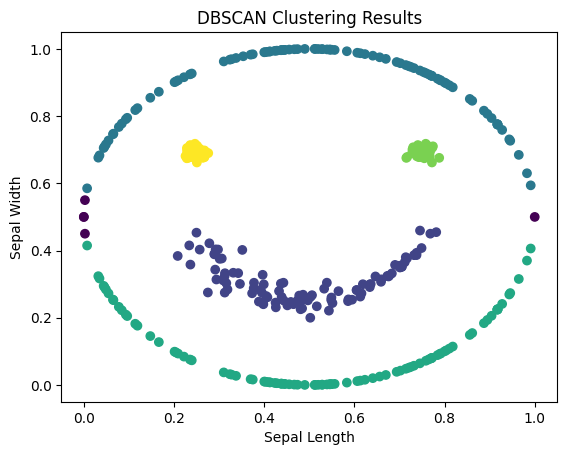

In [ ]:
## Min-Max Scaler

plot(MinMaxScaler(), 'euclidean')
plot(MinMaxScaler(), 'chebyshev')

Adjusted Rand Index with eps 0.53 :  1.0


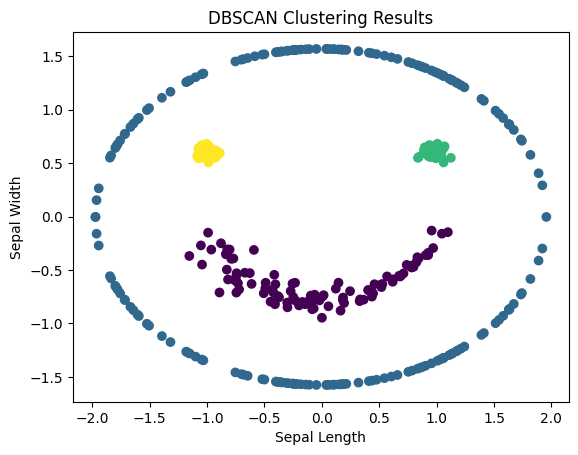

Adjusted Rand Index with eps 0.4 :  0.6849464028533594


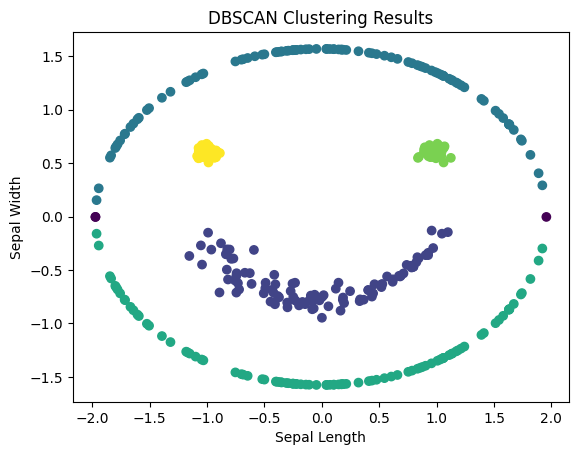

In [ ]:
## Z-Score Scaler

plot(StandardScaler(), 'euclidean')
plot(StandardScaler(), 'chebyshev')

**Self - organizing maps (SOM)**

(320, 2) (320,) (80, 2) (80,)
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Iteration:  7000
Iteration:  8000
Iteration:  9000
Iteration:  10000
Iteration:  11000
Iteration:  12000
Iteration:  13000
Iteration:  14000
Iteration:  15000
Iteration:  16000
Iteration:  17000
Iteration:  18000
Iteration:  19000
Iteration:  20000
SOM training completed


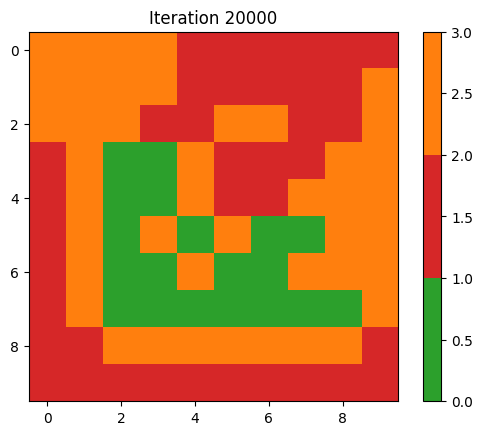

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.2534578552745049


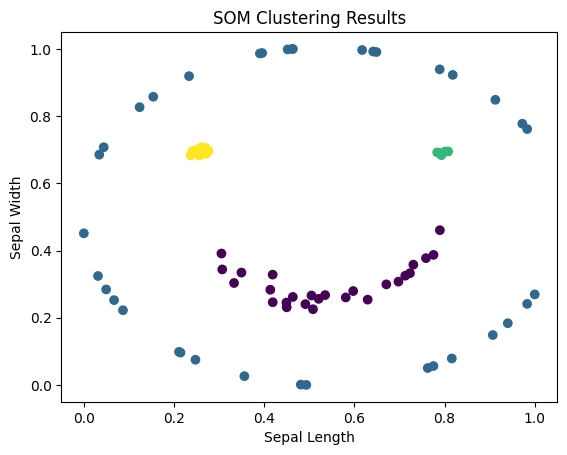

In [ ]:
data_x = smile.iloc[:, :2]
data_y = smile.iloc[:, 2]

train_x, test_x, train_y, test_y = train_test_split(data_x, data_y, test_size=0.2, random_state=42)
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)

train_x = train_x.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

test_x = test_x.reset_index(drop=True)
test_y = test_y.reset_index(drop=True)

def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def e_distance(x,y):
  return distance.euclidean(x,y)

def m_distance(x,y):
  return distance.cityblock(x,y)

def winning_neuron(data, t, som, num_rows, num_cols):
  winner = [0,0]
  shortest_distance = np.sqrt(data.shape[1])
  input_data = data[t]
  for row in range(num_rows):
    for col in range(num_cols):
      distance = e_distance(som[row][col], data[t])
      if distance < shortest_distance:
        shortest_distance = distance
        winner = [row,col]
  return winner

def decay(step, max_steps,max_learning_rate,max_m_dsitance):
  coefficient = 1.0 - (np.float64(step)/max_steps)
  learning_rate = coefficient*max_learning_rate
  neighbourhood_range = ceil(coefficient * max_m_dsitance)
  return learning_rate, neighbourhood_range

num_rows = 10
num_cols = 10
max_m_dsitance = 4
max_learning_rate = 0.5
max_steps = 20000

train_x_norm = minmax_scaler(train_x)

num_dims = train_x_norm.shape[1]
np.random.seed(40)
som = np.random.random_sample(size=(num_rows, num_cols, num_dims))

for step in range(max_steps):
  if (step+1) % 1000 == 0:
    print("Iteration: ", step+1)
  learning_rate, neighbourhood_range = decay(step, max_steps,max_learning_rate,max_m_dsitance)

  t = np.random.randint(0,high=train_x_norm.shape[0])
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  for row in range(num_rows):
    for col in range(num_cols):
      if m_distance([row,col],winner) <= neighbourhood_range:
        som[row][col] += learning_rate*(train_x_norm[t]-som[row][col]) #update neighbour's weight

print("SOM training completed")

label_data = train_y
map = np.empty(shape=(num_rows, num_cols), dtype=object)

for row in range(num_rows):
  for col in range(num_cols):
    map[row][col] = []

for t in range(train_x_norm.shape[0]):
  if (t+1) % 1000 == 0:
    print("sample data: ", t+1)
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  map[winner[0]][winner[1]].append(label_data[t])

label_map = np.zeros(shape=(num_rows, num_cols),dtype=np.int64)
for row in range(num_rows):
  for col in range(num_cols):
    label_list = map[row][col]
    if len(label_list)==0:
      label = 2
    else:
      label = max(label_list, key=label_list.count)
    label_map[row][col] = label

title = ('Iteration ' + str(max_steps))
cmap = colors.ListedColormap(['tab:green', 'tab:red', 'tab:orange'])
plt.imshow(label_map, cmap=cmap)
plt.colorbar()
plt.title(title)
plt.show()

kmeans = KMeans(n_clusters=3, random_state=42).fit(som.reshape(num_rows * num_cols, -1))
clustered = kmeans.predict(som.reshape(num_rows * num_cols, -1))

data = minmax_scaler(test_x)

winner_labels = []

for t in range(data.shape[0]):
 winner = winning_neuron(data, t, som, num_rows, num_cols)
 row = winner[0]
 col = winner[1]
 predicted = clustered[row * num_cols + col]
 winner_labels.append(predicted)

ari = adjusted_rand_score(test_y, np.array(winner_labels))
print(ari)

plt.scatter(data[:, 0], data[:, 1], c=test_y)
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('SOM Clustering Results')
plt.show()

**The order2-3clust data analisys**

*About the dataset*

In [ ]:
order2_3clust = pd.read_csv("order2-3clust.csv", header=None)
order2_3clust.head()

,0,1,2
0,-8.804895,104.458572,0
1,-1.409040,37.172486,0
2,7.336955,82.018129,0
3,5.751823,61.828626,0
4,-5.806146,57.801112,0


In [ ]:
order2_3clust.shape

(300, 3)

In [ ]:
order2_3clust.isna().sum()

0    0
1    0
2    0
dtype: int64

In [ ]:
## Target variable distribution

target_counts = order2_3clust.iloc[:, 2].value_counts()
target_distribution = target_counts / target_counts.sum()

print(target_distribution)

0    0.333333
1    0.333333
2    0.333333
Name: 2, dtype: float64


*Execute the algorithms*

**K-Means**

In [ ]:
def k_means(scaler, max_iter, k):

  X = order2_3clust.iloc[:, :2]
  Y = order2_3clust.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.26356056119466853


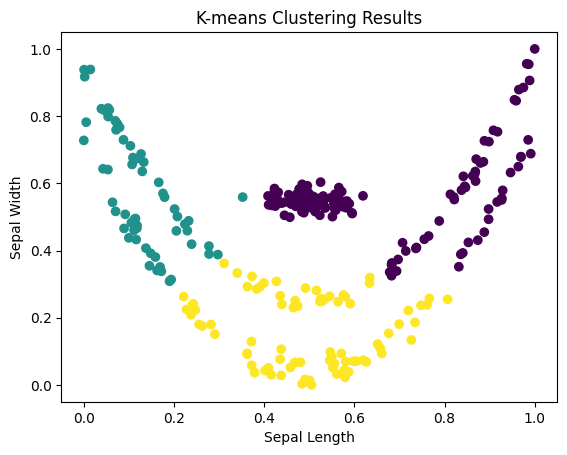

In [ ]:
## Min-Max Scaler

k_means(MinMaxScaler(), 300, 3)
# k_means(MinMaxScaler(), 500, 3)
# k_means(MinMaxScaler(), 1000, 3)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.26661149956331426


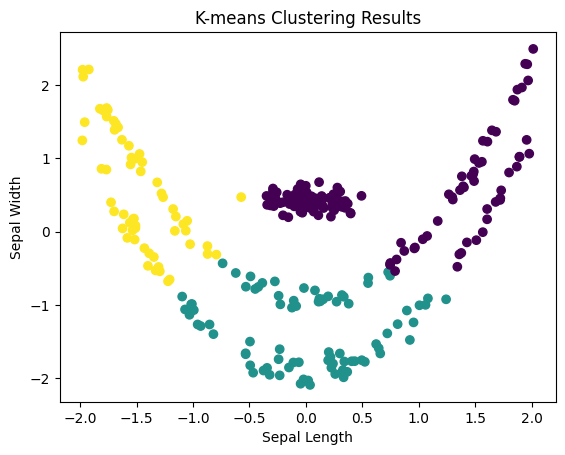

In [ ]:
## Z-Score Scaler

k_means(StandardScaler(), 300, 3)
# k_means(StandardScaler(), 500, 3)
# k_means(StandardScaler(), 1000, 3)

**EM for clustering under Gaussian assumptions**

In [ ]:
def em(scaler, max_iter, k):

  X = order2_3clust.iloc[:, :2]
  Y = order2_3clust.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

Adjusted Rand Index: 0.49901506171117777


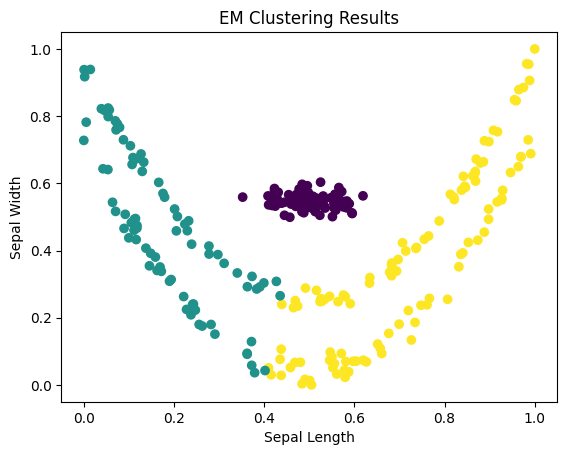

In [ ]:
## Min-Max Scaler

em(MinMaxScaler(), 100, 3)
# em(MinMaxScaler(), 500, 3)
# em(MinMaxScaler(), 1000, 3)

Adjusted Rand Index: 0.4986015622051998


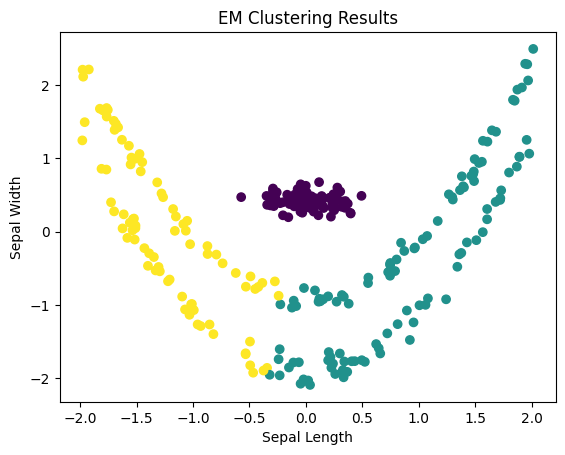

In [ ]:
## Z-Score Scaler

em(StandardScaler(), 300, 3)
# em(StandardScaler(), 500, 3)
# em(StandardScaler(), 1000, 3)

**Hierarchical algorithms**

In [ ]:
def hierarchical(scaler, method, metric, k):
  X = order2_3clust.iloc[:, :2]
  Y = order2_3clust.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)

  linkage_matrix = linkage(X_scaled, method=method, metric=metric)
  labels = fcluster(linkage_matrix, k, criterion='maxclust')

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title("Hierarchical Clustering Results " + method + " link")
  plt.show()

*Single link*

Adjusted Rand Index: 0.5664477456671392


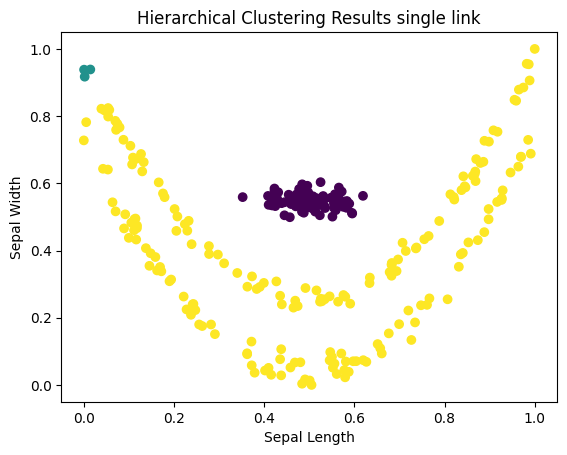

Adjusted Rand Index: 0.5664477456671392


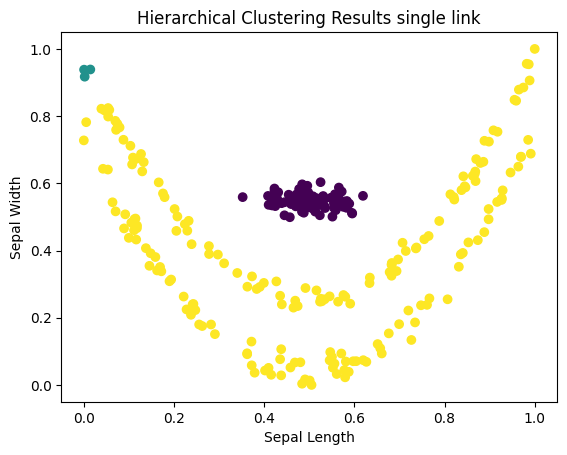

Adjusted Rand Index: 0.5664477456671392


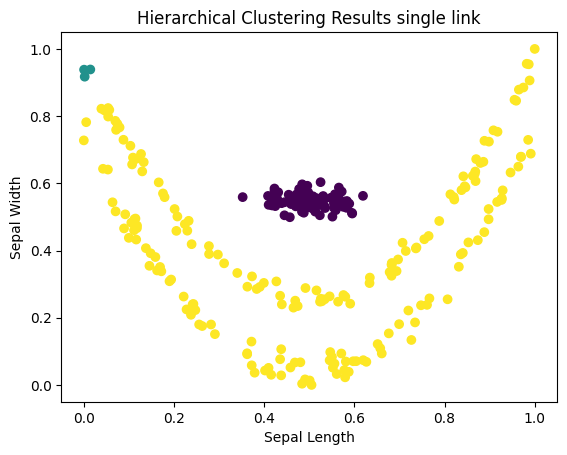

Adjusted Rand Index: 0.1869417510939515


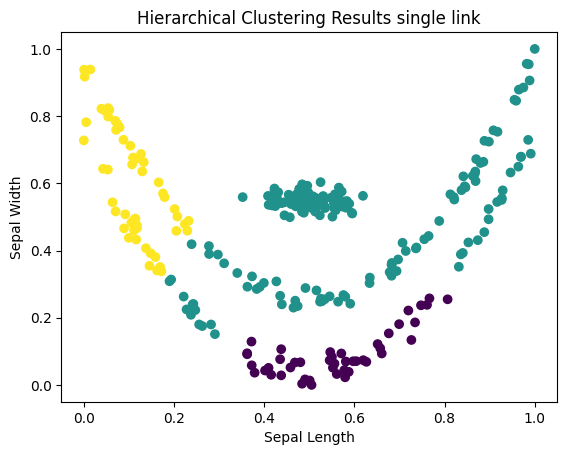

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'single', 'minkowski', 3)
hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 3)
hierarchical(MinMaxScaler(), 'single', 'chebyshev', 3)
hierarchical(MinMaxScaler(), 'single', 'cosine', 3)

Adjusted Rand Index: 0.5664477456671392


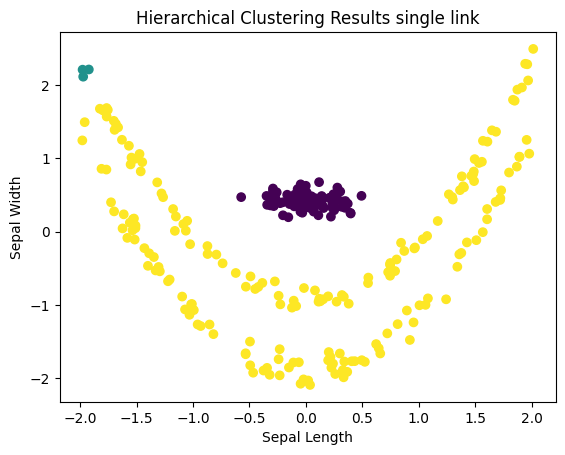

Adjusted Rand Index: 0.5664477456671392


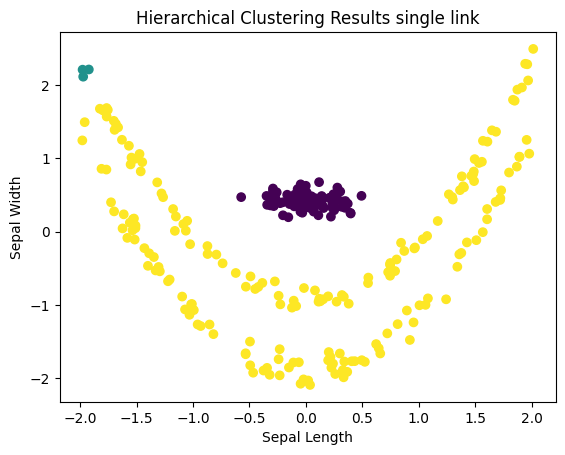

Adjusted Rand Index: 0.5664477456671392


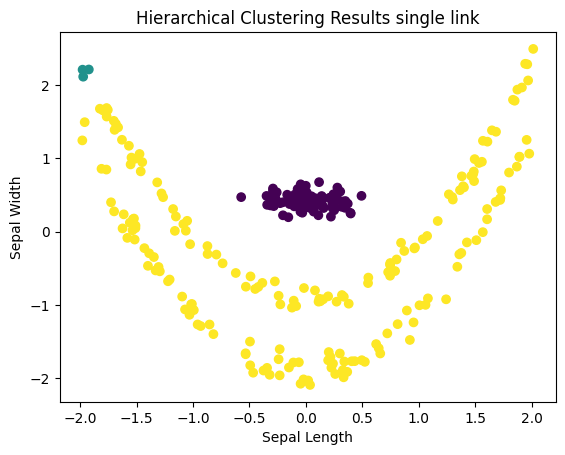

Adjusted Rand Index: 0.1441918237295458


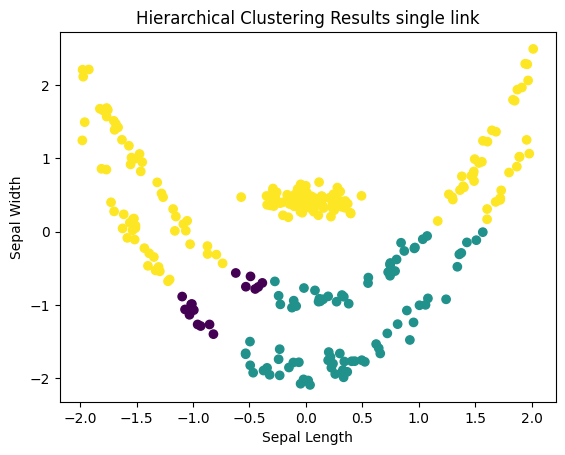

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'single', 'minkowski', 3)
hierarchical(StandardScaler(), 'single', 'mahalanobis', 3)
hierarchical(StandardScaler(), 'single', 'chebyshev', 3)
hierarchical(StandardScaler(), 'single', 'cosine', 3)

*Complete link*

Adjusted Rand Index: 0.2632553197598377


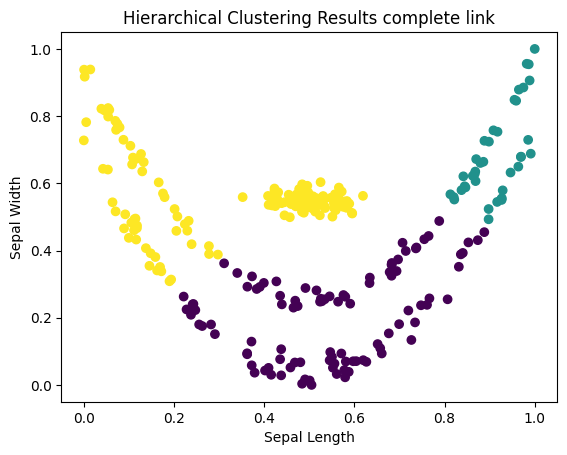

Adjusted Rand Index: 0.09190126328238342


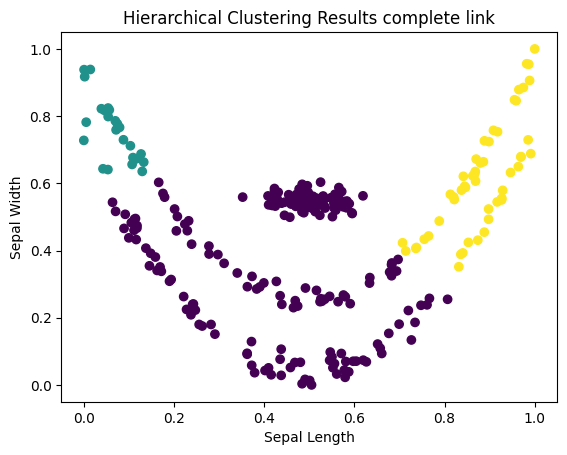

Adjusted Rand Index: 0.10237723623029257


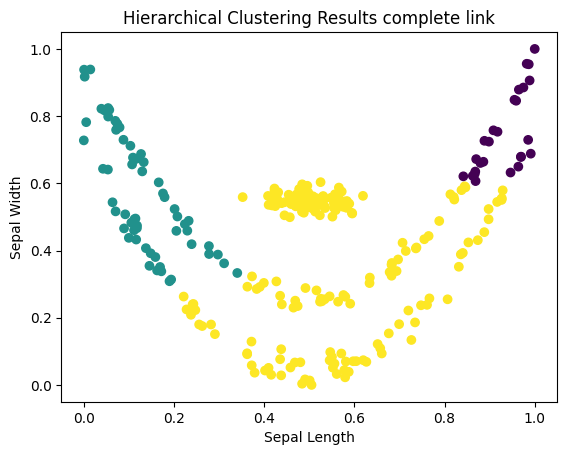

Adjusted Rand Index: 0.19345268745516994


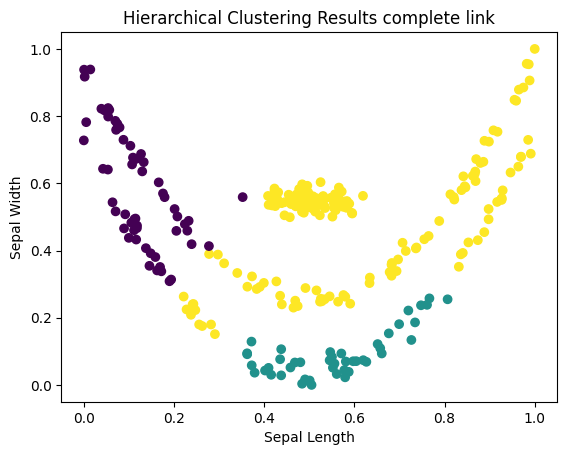

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'complete', 'minkowski', 3)
hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 3)
hierarchical(MinMaxScaler(), 'complete', 'chebyshev', 3)
hierarchical(MinMaxScaler(), 'complete', 'cosine', 3)

Adjusted Rand Index: 0.09190126328238342


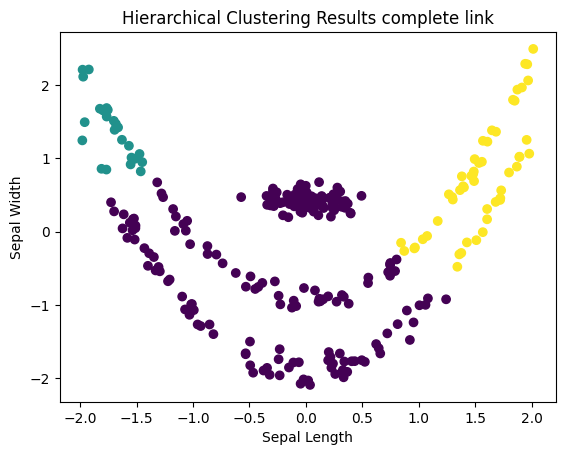

Adjusted Rand Index: 0.09190126328238342


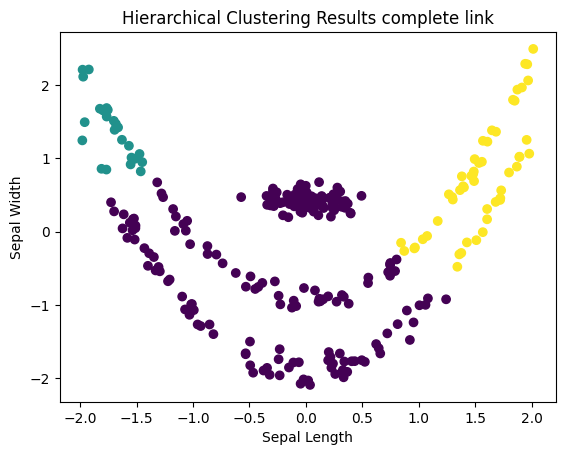

Adjusted Rand Index: 0.27309717206424894


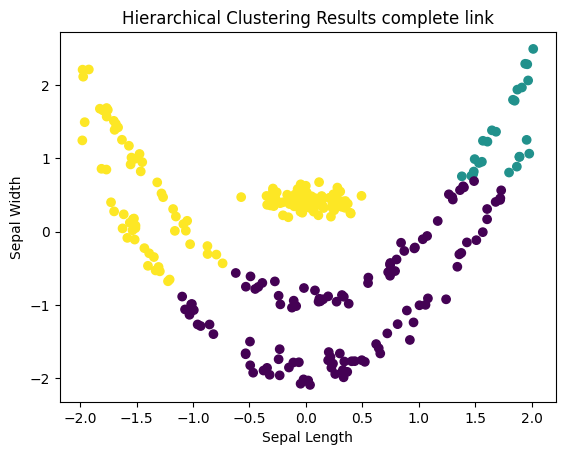

Adjusted Rand Index: 0.08308763314864227


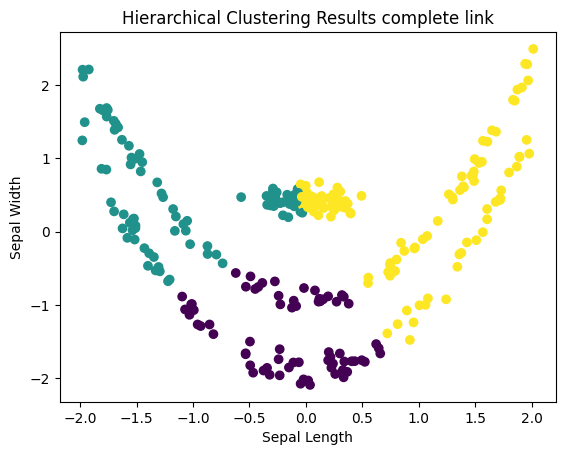

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'complete', 'minkowski', 3)
hierarchical(StandardScaler(), 'complete', 'mahalanobis', 3)
hierarchical(StandardScaler(), 'complete', 'chebyshev', 3)
hierarchical(StandardScaler(), 'complete', 'cosine', 3)

*Average Link*

Adjusted Rand Index: 0.14126902757787962


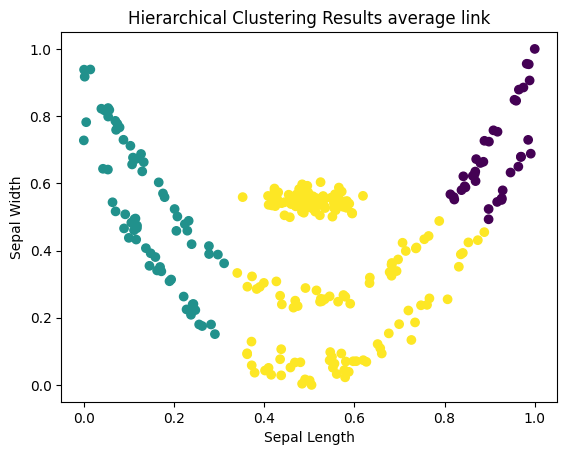

Adjusted Rand Index: 0.06706242740117405


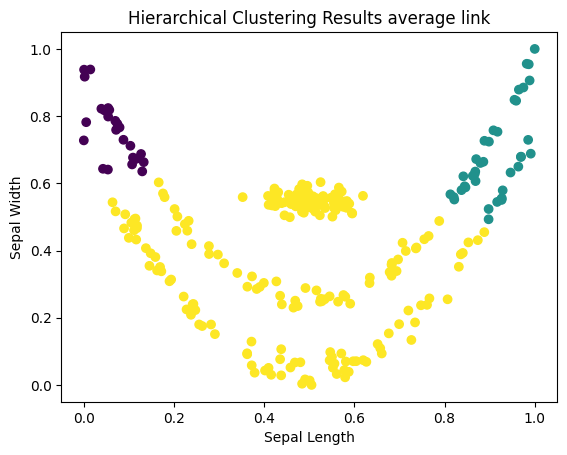

Adjusted Rand Index: 0.06732211795815352


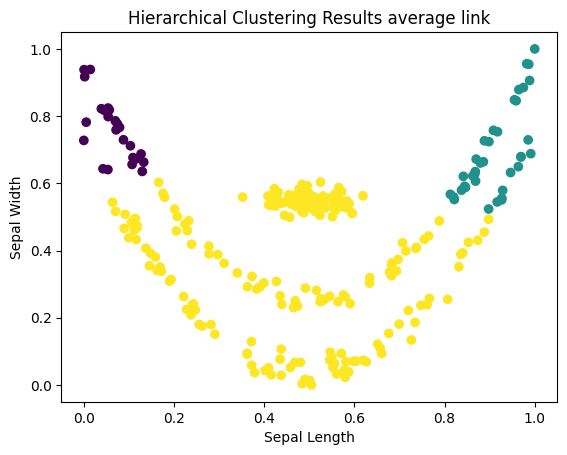

Adjusted Rand Index: 0.1869417510939515


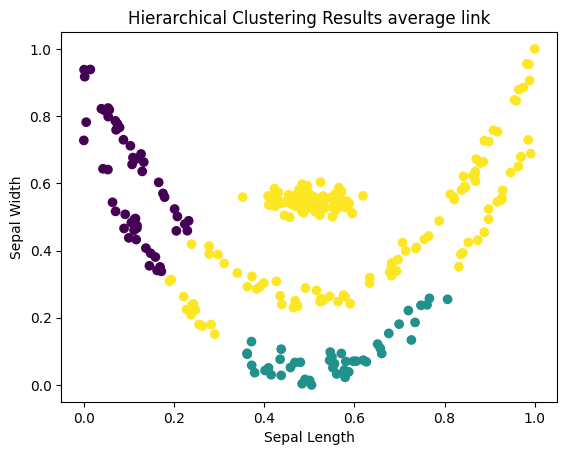

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'average', 'minkowski', 3)
hierarchical(MinMaxScaler(), 'average', 'mahalanobis', 3)
hierarchical(MinMaxScaler(), 'average', 'chebyshev', 3)
hierarchical(MinMaxScaler(), 'average', 'cosine', 3)

Adjusted Rand Index: 0.06706242740117405


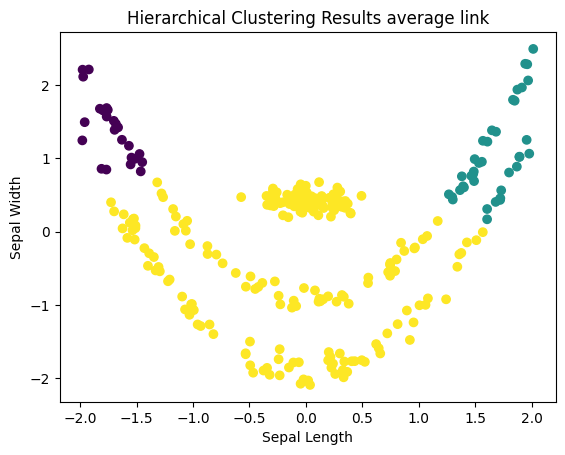

Adjusted Rand Index: 0.06706242740117405


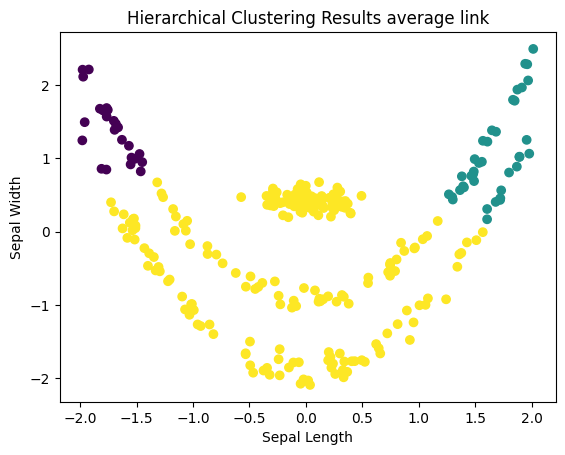

Adjusted Rand Index: 0.272264008908063


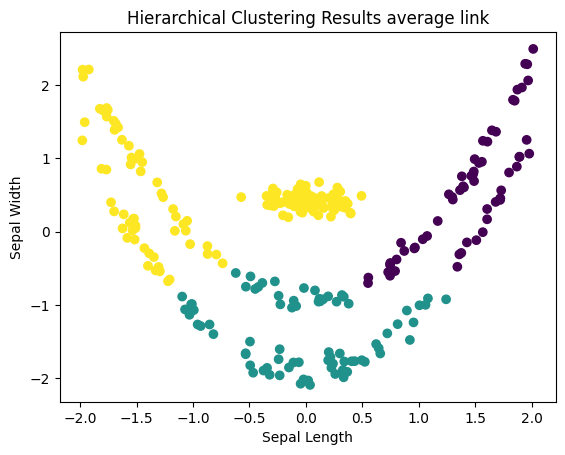

Adjusted Rand Index: 0.2787323169336868


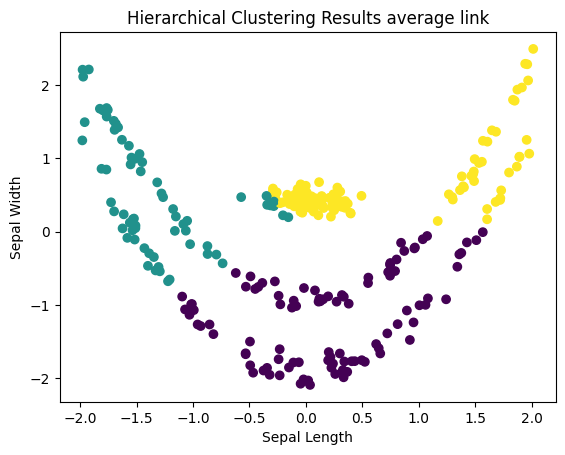

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'average', 'minkowski', 3)
hierarchical(StandardScaler(), 'average', 'mahalanobis', 3)
hierarchical(StandardScaler(), 'average', 'chebyshev', 3)
hierarchical(StandardScaler(), 'average', 'cosine', 3)

*Ward variance*

Adjusted Rand Index: 0.48235275237455494


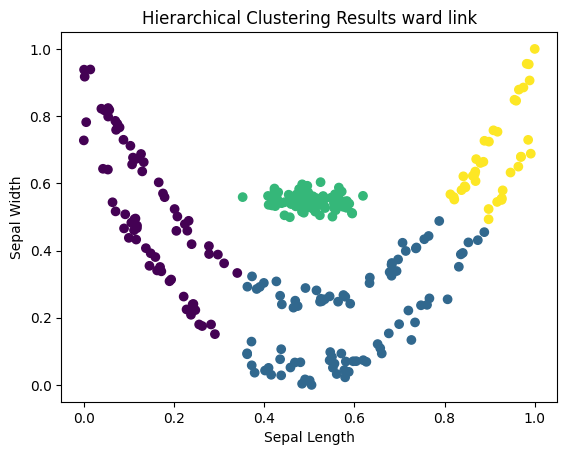

In [ ]:
## Min-Max Scaler

hierarchical(MinMaxScaler(), 'ward', 'euclidean', 4)

Adjusted Rand Index: 0.496700685740514


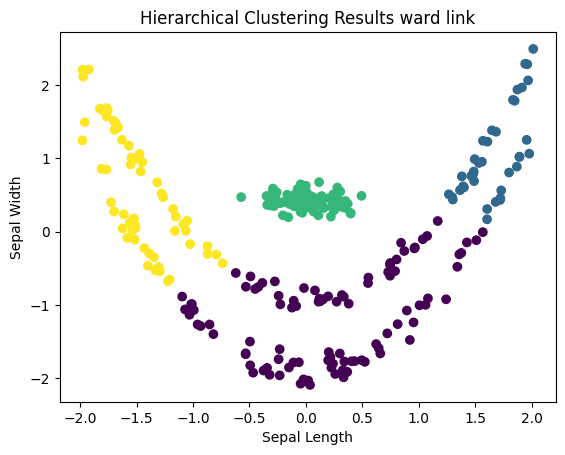

In [ ]:
## Z-Score Scaler

hierarchical(StandardScaler(), 'ward', 'euclidean', 4)

**Density-based algorithms (DBSCAN)**

In [ ]:
def dbscan_alg(scaler, eps, min_samples, metric):

  X = order2_3clust.iloc[:, :2]
  Y = order2_3clust.iloc[:, 2]

  X_scaled = scaler.fit_transform(X)
  dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
  labels = dbscan.fit_predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  return ari, X_scaled, labels

def plot(scaler, metric):

  ari_max = 0
  eps_max = 0
  X_scaled_max = []
  labels_max = []

  for eps in range(1, 101, 1):
    eps = eps / 100.0
    ari, X_scaled, labels = dbscan_alg(scaler, eps, 10, metric)

    if ari_max < ari:
      ari_max = ari
      X_scaled_max = X_scaled
      labels_max = labels
      eps_max = eps

  print("Adjusted Rand Index with eps " + str(eps_max) + " : ", ari_max)

  plt.scatter(X_scaled_max[:, 0], X_scaled_max[:, 1], c=labels_max)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('DBSCAN Clustering Results')
  plt.show()

Adjusted Rand Index with eps 0.1 :  0.5844861444804238


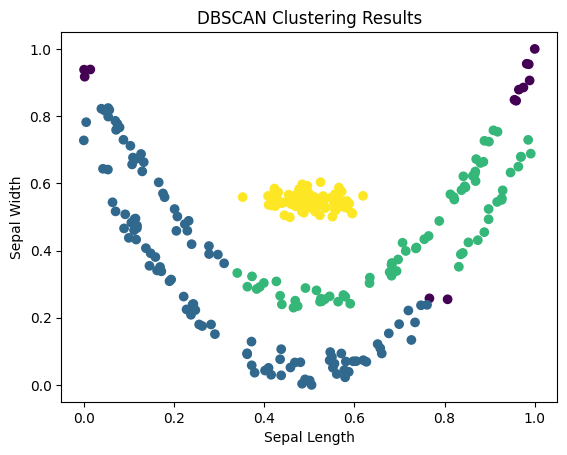

Adjusted Rand Index with eps 0.08 :  0.5633364607821433


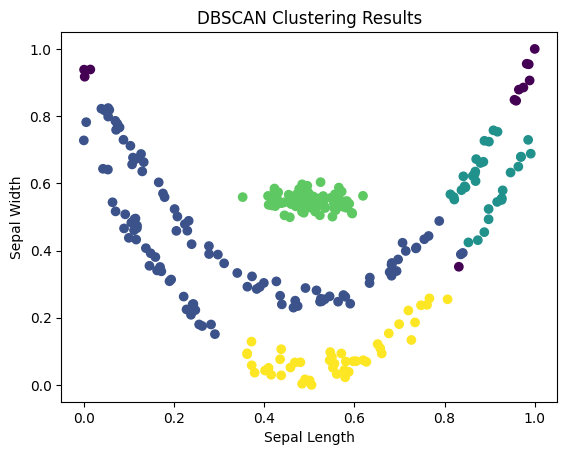

In [ ]:
## Min-Max Scaler

plot(MinMaxScaler(), 'euclidean')
plot(MinMaxScaler(), 'chebyshev')

Adjusted Rand Index with eps 0.43 :  0.5844861444804238


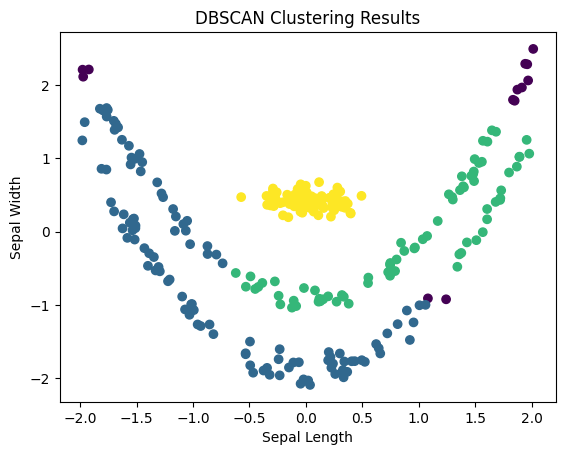

Adjusted Rand Index with eps 0.35 :  0.6289628856364406


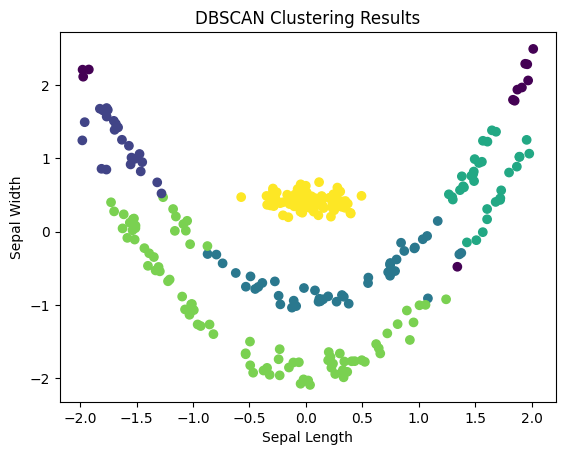

In [ ]:
## Z-Score Scaler

plot(StandardScaler(), 'euclidean')
plot(StandardScaler(), 'chebyshev')

**Self - organizing maps (SOM)**

(240, 2) (240,) (60, 2) (60,)
Iteration:  1000
Iteration:  2000
Iteration:  3000
Iteration:  4000
Iteration:  5000
Iteration:  6000
Iteration:  7000
Iteration:  8000
Iteration:  9000
Iteration:  10000
Iteration:  11000
Iteration:  12000
Iteration:  13000
Iteration:  14000
Iteration:  15000
Iteration:  16000
Iteration:  17000
Iteration:  18000
Iteration:  19000
Iteration:  20000
SOM training completed


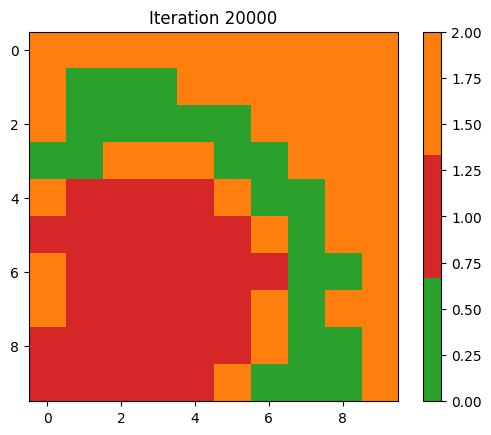

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.10629658960918154


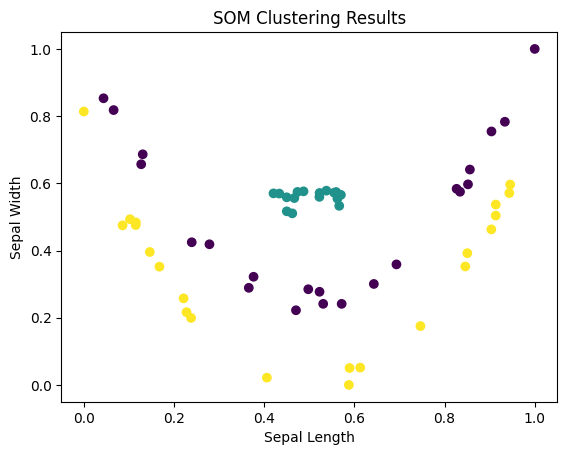

In [ ]:
data_x = order2_3clust.iloc[:, :2]
data_y = order2_3clust.iloc[:, 2]

train_x, test_x, train_y, test_y = train_test_split(data_x, data_y, test_size=0.2, random_state=42)
print(train_x.shape, train_y.shape, test_x.shape, test_y.shape)

train_x = train_x.reset_index(drop=True)
train_y = train_y.reset_index(drop=True)

test_x = test_x.reset_index(drop=True)
test_y = test_y.reset_index(drop=True)

def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def e_distance(x,y):
  return distance.euclidean(x,y)

def m_distance(x,y):
  return distance.cityblock(x,y)

def winning_neuron(data, t, som, num_rows, num_cols):
  winner = [0,0]
  shortest_distance = np.sqrt(data.shape[1])
  input_data = data[t]
  for row in range(num_rows):
    for col in range(num_cols):
      distance = e_distance(som[row][col], data[t])
      if distance < shortest_distance:
        shortest_distance = distance
        winner = [row,col]
  return winner

def decay(step, max_steps,max_learning_rate,max_m_dsitance):
  coefficient = 1.0 - (np.float64(step)/max_steps)
  learning_rate = coefficient*max_learning_rate
  neighbourhood_range = ceil(coefficient * max_m_dsitance)
  return learning_rate, neighbourhood_range

num_rows = 10
num_cols = 10
max_m_dsitance = 4
max_learning_rate = 0.5
max_steps = 20000

train_x_norm = minmax_scaler(train_x)

num_dims = train_x_norm.shape[1]
np.random.seed(40)
som = np.random.random_sample(size=(num_rows, num_cols, num_dims))

for step in range(max_steps):
  if (step+1) % 1000 == 0:
    print("Iteration: ", step+1)
  learning_rate, neighbourhood_range = decay(step, max_steps,max_learning_rate,max_m_dsitance)

  t = np.random.randint(0,high=train_x_norm.shape[0])
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  for row in range(num_rows):
    for col in range(num_cols):
      if m_distance([row,col],winner) <= neighbourhood_range:
        som[row][col] += learning_rate*(train_x_norm[t]-som[row][col]) #update neighbour's weight

print("SOM training completed")

label_data = train_y
map = np.empty(shape=(num_rows, num_cols), dtype=object)

for row in range(num_rows):
  for col in range(num_cols):
    map[row][col] = []

for t in range(train_x_norm.shape[0]):
  if (t+1) % 1000 == 0:
    print("sample data: ", t+1)
  winner = winning_neuron(train_x_norm, t, som, num_rows, num_cols)
  map[winner[0]][winner[1]].append(label_data[t])

label_map = np.zeros(shape=(num_rows, num_cols),dtype=np.int64)
for row in range(num_rows):
  for col in range(num_cols):
    label_list = map[row][col]
    if len(label_list)==0:
      label = 2
    else:
      label = max(label_list, key=label_list.count)
    label_map[row][col] = label

title = ('Iteration ' + str(max_steps))
cmap = colors.ListedColormap(['tab:green', 'tab:red', 'tab:orange'])
plt.imshow(label_map, cmap=cmap)
plt.colorbar()
plt.title(title)
plt.show()

kmeans = KMeans(n_clusters=3, random_state=42).fit(som.reshape(num_rows * num_cols, -1))
clustered = kmeans.predict(som.reshape(num_rows * num_cols, -1))

data = minmax_scaler(test_x)

winner_labels = []

for t in range(data.shape[0]):
 winner = winning_neuron(data, t, som, num_rows, num_cols)
 row = winner[0]
 col = winner[1]
 predicted = clustered[row * num_cols + col]
 winner_labels.append(predicted)

ari = adjusted_rand_score(test_y, np.array(winner_labels))
print(ari)

plt.scatter(data[:, 0], data[:, 1], c=test_y)
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('SOM Clustering Results')
plt.show()

***Best set choosen***

In [ ]:
### We will first choose for each data set the best representation for each algorithm

### iris :
# - K-Means = k_means(MinMaxScaler(), 300, 3) -> 0.71
# - EM = em(MinMaxScaler(), 300, 3) -> 0.90
# - Single Link = hierarchical(MinMaxScaler(), 'single', 'minkowski', 3) -> 0.55
# - Complete Link = hierarchical(MinMaxScaler(), 'complete', 'minkowski', 3) -> 0.70
# - Average Link = hierarchical(MinMaxScaler(), 'average', 'minkowski', 3) -> 0.71
# - Ward Variance = hierarchical(MinMaxScaler(), 'ward', 'euclidean', 3) -> 0.71
# - DBSCAN = plot(MinMaxScaler(), 'chebyshev') -> 0.65
# - SOM (10,10) -> 0.80

##### So for iris we choose EM algorithm



### 2d-10c :
# - K-Means = k_means(MinMaxScaler(), 300, 10) -> 0.74
# - EM = em(StandardScaler(), 300, 10) -> 0.99
# - Single Link = hierarchical(StandardScaler(), 'single', 'cosine', 10) -> 0.52
# - Complete Link = hierarchical(MinMaxScaler(), 'complete', 'minkowski', 10) -> 0.71
# - Average Link = hierarchical(StandardScaler(), 'average', 'minkowski', 10) -> 0.72
# - Ward Variance = hierarchical(MinMaxScaler(), 'ward', 'euclidean', 10) -> 0.81
# - DBSCAN = plot(StandardScaler(), 'chebyshev') -> 0.88
# - SOM (10,10) -> 0.47

##### So for 2d-10c we choose EM algorithm



### long :
# - K-Means = k_means(MinMaxScaler(), 300, 2) -> 1
# - EM = em(MinMaxScaler(), 300, 2) -> 1
# - Single Link = hierarchical(MinMaxScaler(), 'single', 'mahalanobis', 2) -> 1
# - Complete Link = hierarchical(MinMaxScaler(), 'complete', 'minkowski', 2) -> 1
# - Average Link = hierarchical(MinMaxScaler(), 'average', 'minkowski', 2) -> 1
# - Ward Variance = hierarchical(MinMaxScaler(), 'ward', 'euclidean', 2) -> 1
# - DBSCAN = plot(MinMaxScaler(), 'euclidean') -> 1
# - SOM (10,10) -> 0.79

##### So for long we choose K-Means/EM/Simple Link/Complete Link/Average link/Ward Variance/DBSCAN algorithm



### square :
# - K-Means = k_means(MinMaxScaler(), 300, 4) -> 0.69
# - EM = em(MinMaxScaler(), 100, 4) -> 0.68
# - Single Link = hierarchical(StandardScaler(), 'single', 'cosine', 4) -> 0.50
# - Complete Link = hierarchical(MinMaxScaler(), 'complete', 'mahalanobis', 4) -> 0.53
# - Average Link = hierarchical(MinMaxScaler(), 'average', 'minkowski', 4) -> 0.64
# - Ward Variance = hierarchical(MinMaxScaler(), 'ward', 'euclidean', 3) -> 0.60
# - DBSCAN = ------ Foarte Slab !!!
# - SOM (10,10) -> 0.42

##### So for square we choose K-Means algorithm



### smile :
# - K-Means = ------ Foarte Slab !!!
# - EM = ------ Foarte Slab !!!
# - Single Link = hierarchical(MinMaxScaler(), 'single', 'minkowski', 4) -> 1
# - Complete Link = ------ Foarte Slab !!!
# - Average Link = ------ Foarte Slab !!!
# - Ward Variance = ------ Foarte Slab !!!
# - DBSCAN = plot(StandardScaler(), 'euclidean') -> 1
# - SOM (10,10) -> ------ Foarte Slab !!!

##### So for smile we choose DBSCAN/Single Link algorithm



### order2-3clust :
# - K-Means = ------ Foarte Slab !!!
# - EM = em(MinMaxScaler(), 1300, 3) -> 0.49
# - Single Link = hierarchical(MinMaxScaler(), 'single', 'minkowski', 3) -> 0.56
# - Complete Link = ------ Foarte Slab !!!
# - Average Link = ------ Foarte Slab !!!
# - Ward Variance = hierarchical(StandardScaler(), 'ward', 'euclidean', 4) -> 0.49
# - DBSCAN = plot(StandardScaler(), 'chebyshev') -> 0.62
# - SOM (10,10) -> ------ Foarte Slab !!!

##### So for order2-3clust we choose DBSCAN algorithm

In [ ]:
### Plots

def diagram(sets, methods, title, width):

  colors = ['tab:blue', 'tab:green', 'tab:red', 'tab:orange', 'tab:purple', 'tab:pink', 'tab:brown', 'tab:cyan']
  labels = ['ARI']

  num_sets = len(sets)
  fig, ax = plt.subplots()

  for i in range(num_sets):
      x = np.arange(len(labels))
      ax.bar(x + (i - num_sets / 2 + 0.5) * width, sets[i], width, color=colors[i], label=methods[i])

  ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
  ax.set_title(title)
  ax.set_ylim([0, 1.2])
  ax.set_xticks(x)
  ax.set_xticklabels(labels)

  plt.show()



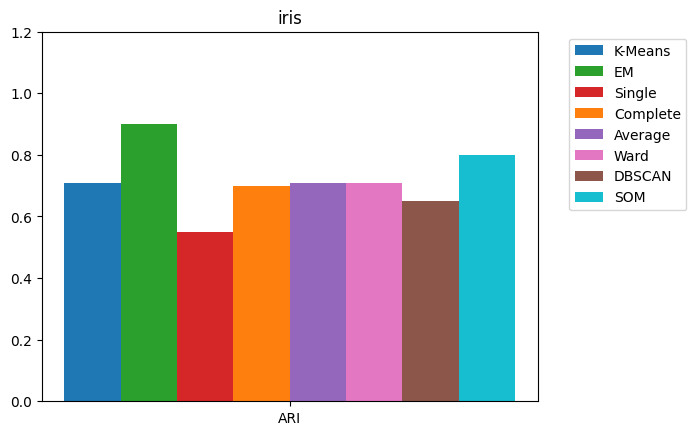

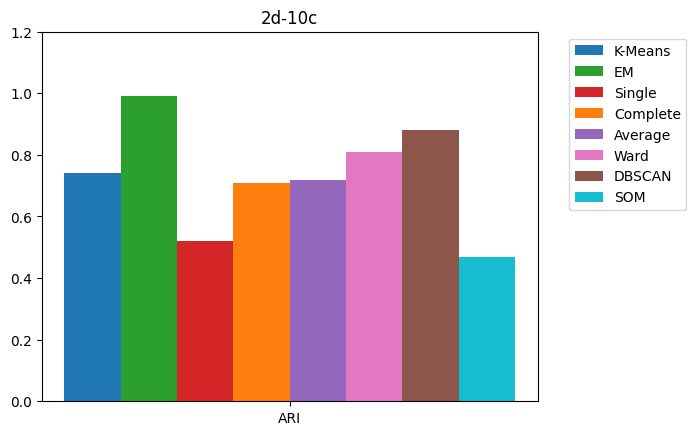

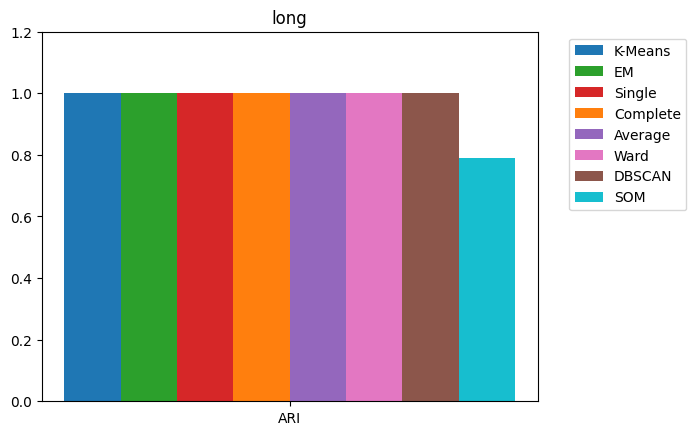

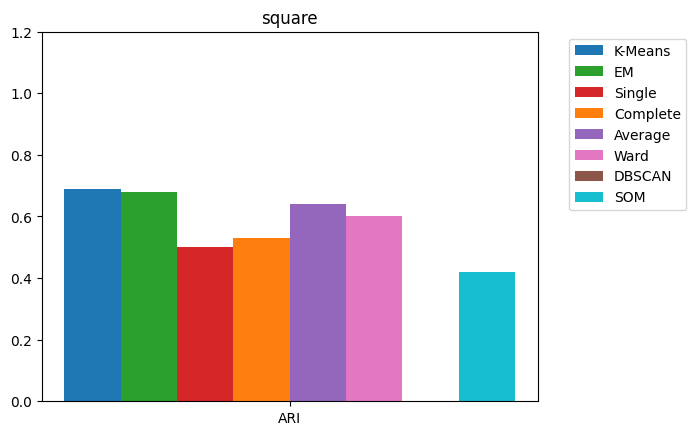

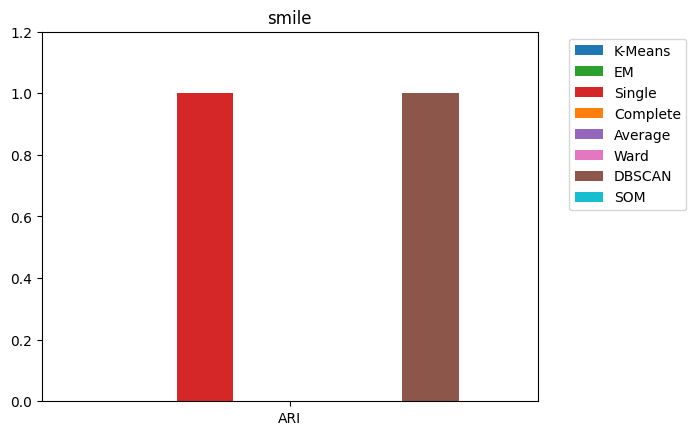

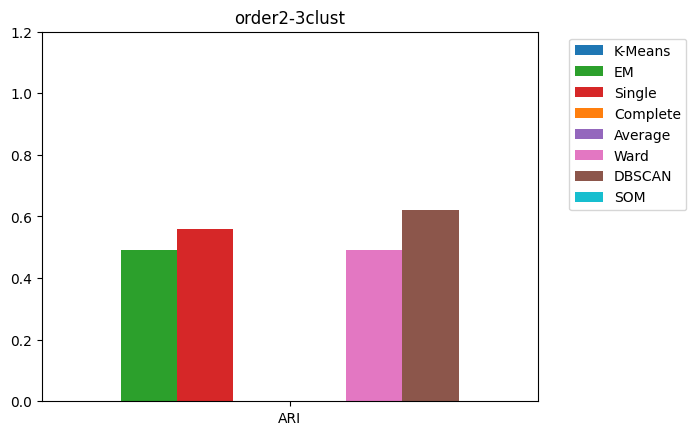

In [ ]:
diagram([0.71, 0.90, 0.55, 0.70, 0.71, 0.71, 0.65, 0.80], ['K-Means', 'EM', 'Single', 'Complete', 'Average', 'Ward', 'DBSCAN', 'SOM'], "iris", 0.10)
diagram([0.74, 0.99, 0.52, 0.71, 0.72, 0.81, 0.88, 0.47], ['K-Means', 'EM', 'Single', 'Complete', 'Average', 'Ward', 'DBSCAN', 'SOM'], "2d-10c", 0.10)
diagram([1, 1, 1, 1, 1, 1, 1, 0.79], ['K-Means', 'EM', 'Single', 'Complete', 'Average', 'Ward', 'DBSCAN', 'SOM'], "long", 0.10)
diagram([0.69, 0.68, 0.50, 0.53, 0.64, 0.60, 0, 0.42], ['K-Means', 'EM', 'Single', 'Complete', 'Average', 'Ward', 'DBSCAN', 'SOM'], "square", 0.10)
diagram([0, 0, 1, 0, 0, 0, 1, 0], ['K-Means', 'EM', 'Single', 'Complete', 'Average', 'Ward', 'DBSCAN', 'SOM'], "smile", 0.10)
diagram([0, 0.49, 0.56, 0, 0, 0.49, 0.62, 0], ['K-Means', 'EM', 'Single', 'Complete', 'Average', 'Ward', 'DBSCAN', 'SOM'], "order2-3clust", 0.10)

**Task 2: Unsupervized clustering**

*Elbow method*

Iris dataset - KMeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[152.36870647733906, 78.940841426146, 57.317873214285704, 46.53558205128205, 38.93873974358975, 34.293462675408335, 30.145378479411086, 27.83959113693325, 26.123851370851376]


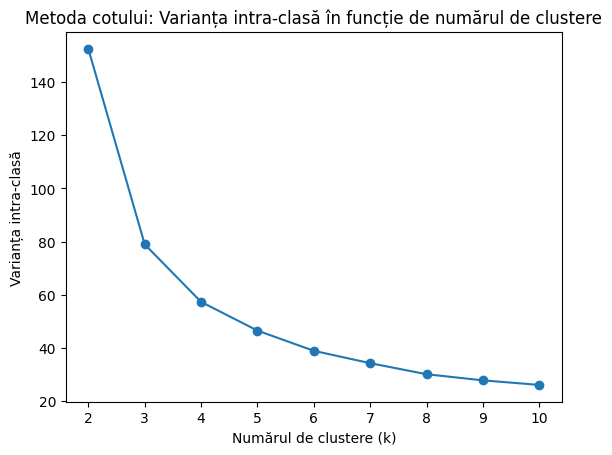

In [ ]:
X = iris.iloc[:, :4]
Y = iris.iloc[:, 4]

inertia_values = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

print(inertia_values)

plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Varianța intra-clasă')
plt.title('Metoda cotului: Varianța intra-clasă în funcție de numărul de clustere')
plt.show()

### Pe măsură ce numărul de clustere crește de la 2 la 3, varianța intra-clasă scade semnificativ.
### Această scădere semnificativă indică o îmbunătățire a clusteringului, deoarece exemplarele din același cluster sunt mai apropiate unul de celălalt.
### Cu toate acestea, odată ce numărul de clustere depășește 3, scăderea în varianța intra-clasă începe să se stabilizeze.
### Varianța intra-clasă continuă să scadă, dar într-un ritm mai lent, sugerând că adăugarea de clustere suplimentare nu aduce îmbunătățiri
### semnificative în ceea ce privește coeziunea clusterelor.

### Punctul de cotitură (elbow) în graficul varianței intra-clase poate fi considerat între 2 și 3 clustere.
### Acesta este punctul în care adăugarea unui cluster suplimentar nu aduce o îmbunătățire semnificativă în varianța intra-clasă.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[12.14368828157972, 6.998114004826761, 5.532831003081897, 4.571180508755744, 3.9158006119711084, 3.4645972936765066, 3.1442221315374987, 2.810875525917127, 2.527661444565196]


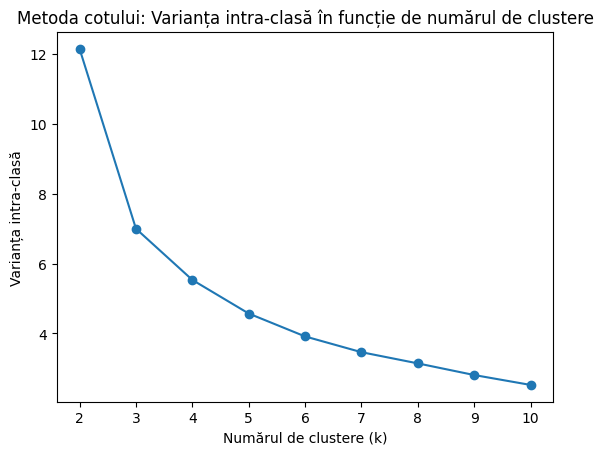

In [ ]:
X = iris.iloc[:, :4]
X = MinMaxScaler().fit_transform(X)
Y = iris.iloc[:, 4]

inertia_values = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

print(inertia_values)

plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Varianța intra-clasă')
plt.title('Metoda cotului: Varianța intra-clasă în funcție de numărul de clustere')
plt.show()

Iris dataset - Ierarhic algorithms

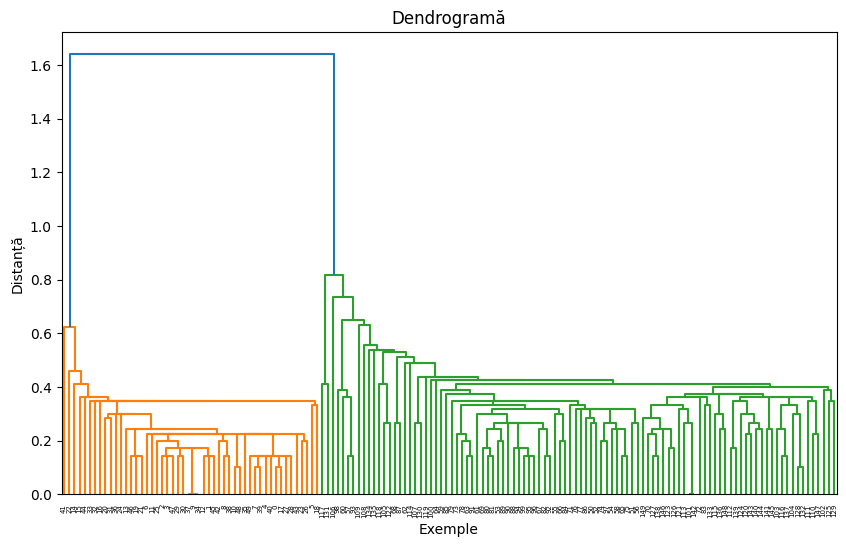

In [ ]:
### Single linkage

X = iris.iloc[:, :4]
Y = iris.iloc[:, 4]

Z = linkage(X, method='single')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

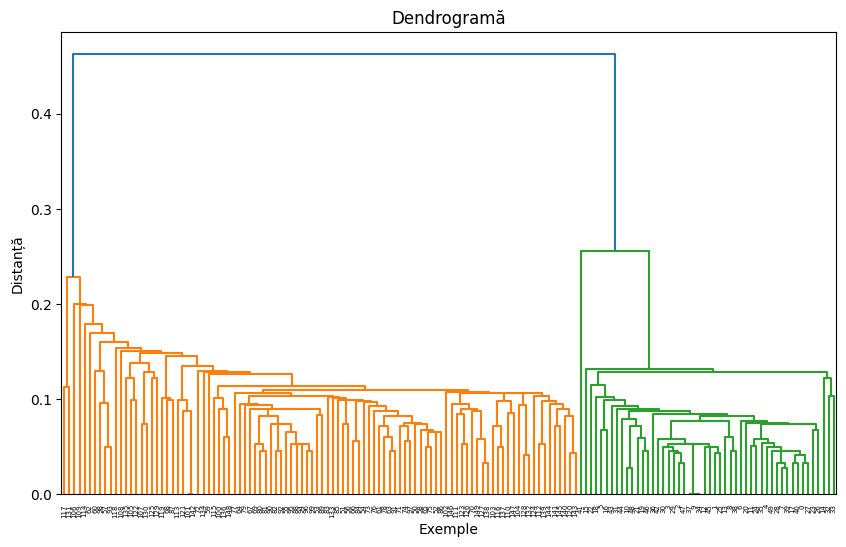

In [ ]:
X = iris.iloc[:, :4]
X = MinMaxScaler().fit_transform(X)
Y = iris.iloc[:, 4]

Z = linkage(X, method='single')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

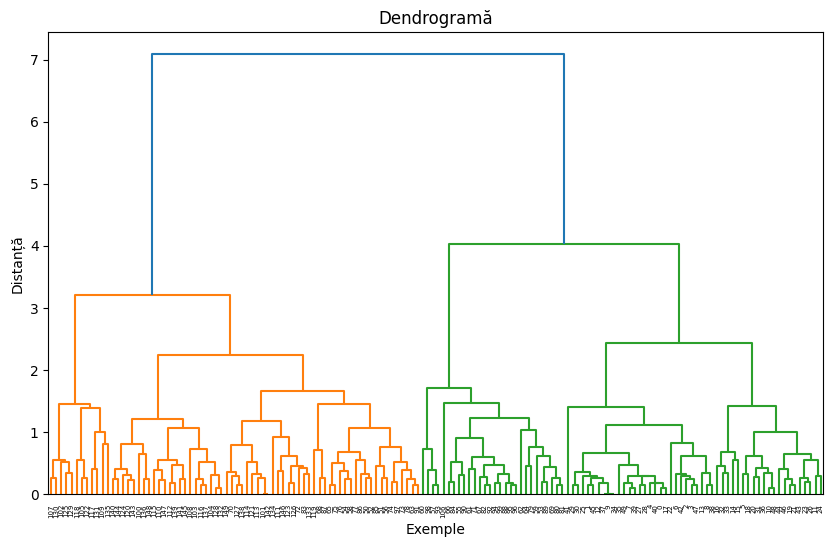

In [ ]:
### Complete linkage

X = iris.iloc[:, :4]
Y = iris.iloc[:, 4]

Z = linkage(X, method='complete')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

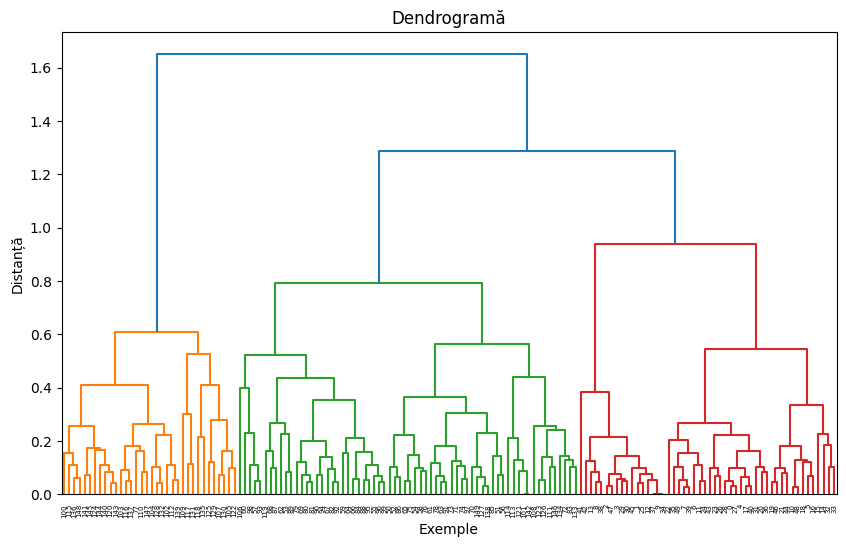

In [ ]:
X = iris.iloc[:, :4]
X = MinMaxScaler().fit_transform(X)
Y = iris.iloc[:, 4]

Z = linkage(X, method='complete')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

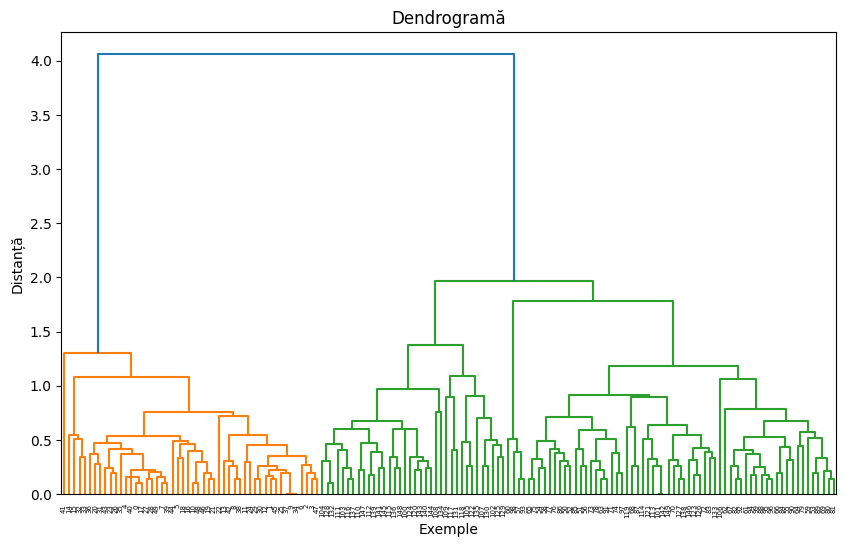

In [ ]:
### Average linkage

X = iris.iloc[:, :4]
Y = iris.iloc[:, 4]

Z = linkage(X, method='average')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

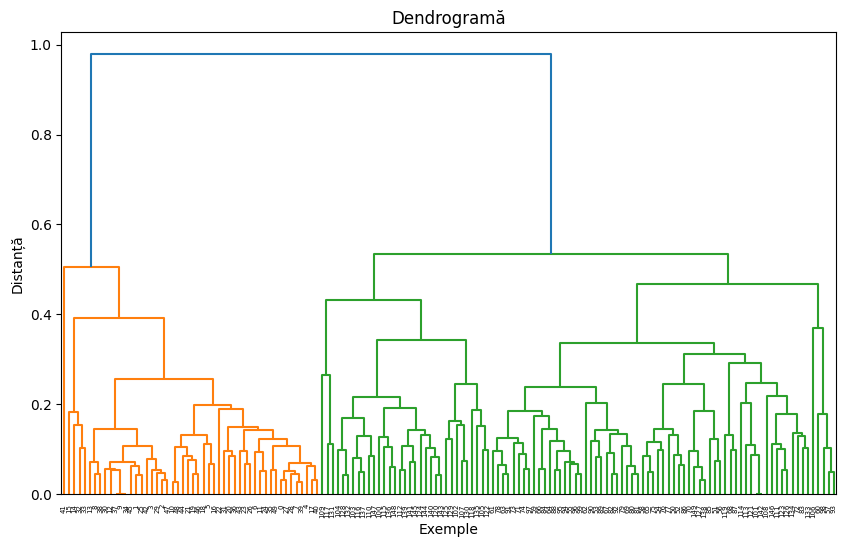

In [ ]:
X = iris.iloc[:, :4]
X = MinMaxScaler().fit_transform(X)
Y = iris.iloc[:, 4]

Z = linkage(X, method='average')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

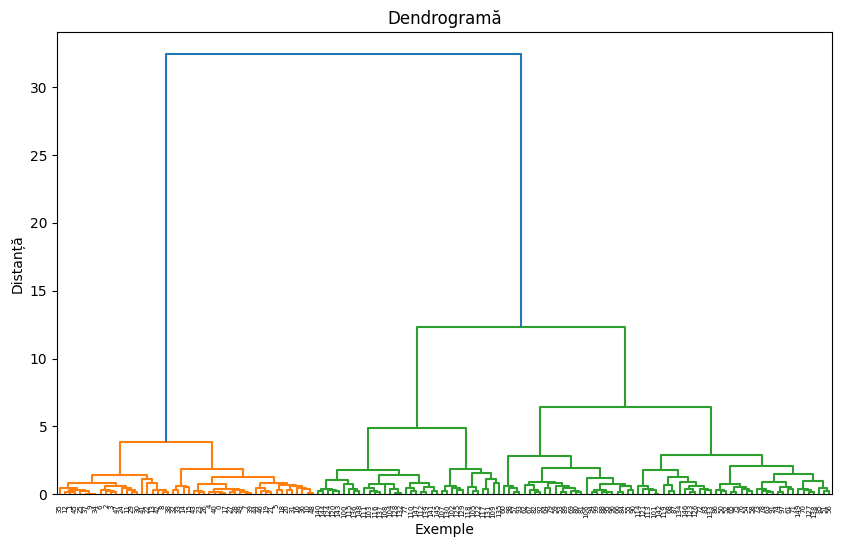

In [ ]:
### Ward linkage

X = iris.iloc[:, :4]
Y = iris.iloc[:, 4]

Z = linkage(X, method='ward')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

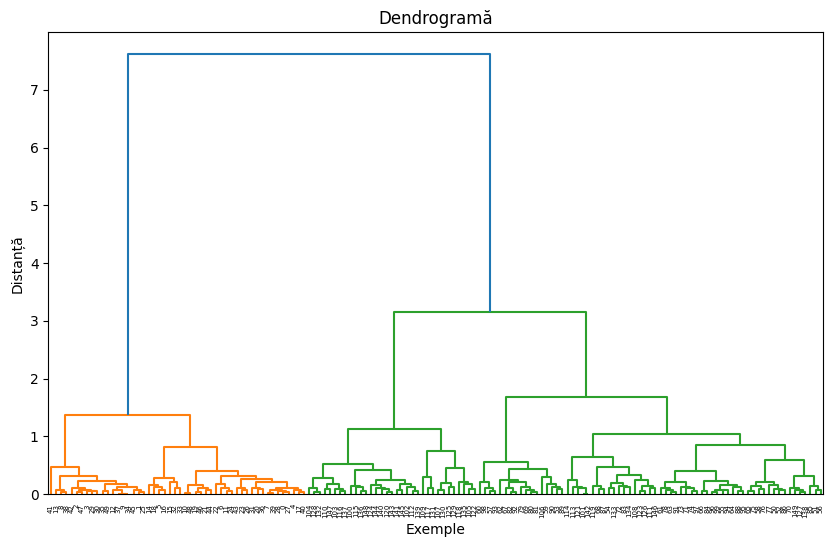

In [ ]:
X = iris.iloc[:, :4]
X = MinMaxScaler().fit_transform(X)
Y = iris.iloc[:, 4]

Z = linkage(X, method='ward')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

2d-10c dataset - KMeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[101128.75535827276, 54829.94360342772, 42234.23230400367, 32355.059040035405, 24757.34150892388, 20398.433070559593, 16565.33497896238, 13756.533511945298, 11919.987535894259, 10239.547918474495, 9027.62671980235, 8012.05581680298, 7231.159054377034]


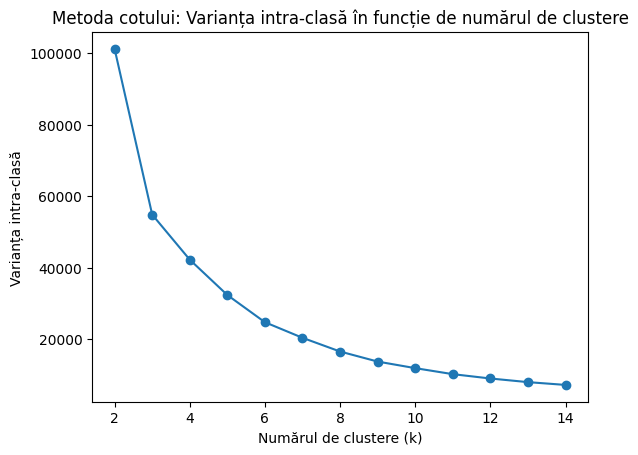

In [ ]:
X = dataset_2d_10c.iloc[:, :2]
Y = dataset_2d_10c.iloc[:, 2]

inertia_values = []
k_values = range(2, 15)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

print(inertia_values)

plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Varianța intra-clasă')
plt.title('Metoda cotului: Varianța intra-clasă în funcție de numărul de clustere')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[95.76691351630916, 54.77369459188722, 40.92498701898846, 30.16044567534268, 23.9396992427952, 19.724061859417574, 16.35387342717428, 13.619704829702666, 11.106531313705089, 9.553442450432646, 8.208467530978817, 7.01828325436565, 6.248182399297121]


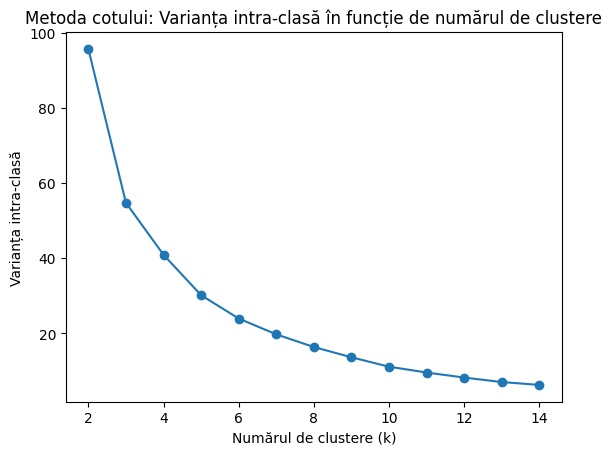

In [ ]:
X = dataset_2d_10c.iloc[:, :2]
X = MinMaxScaler().fit_transform(X)
Y = dataset_2d_10c.iloc[:, 2]

inertia_values = []
k_values = range(2, 15)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

print(inertia_values)

plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Varianța intra-clasă')
plt.title('Metoda cotului: Varianța intra-clasă în funcție de numărul de clustere')
plt.show()

2d-10c dataset - Ierarhic algorithms

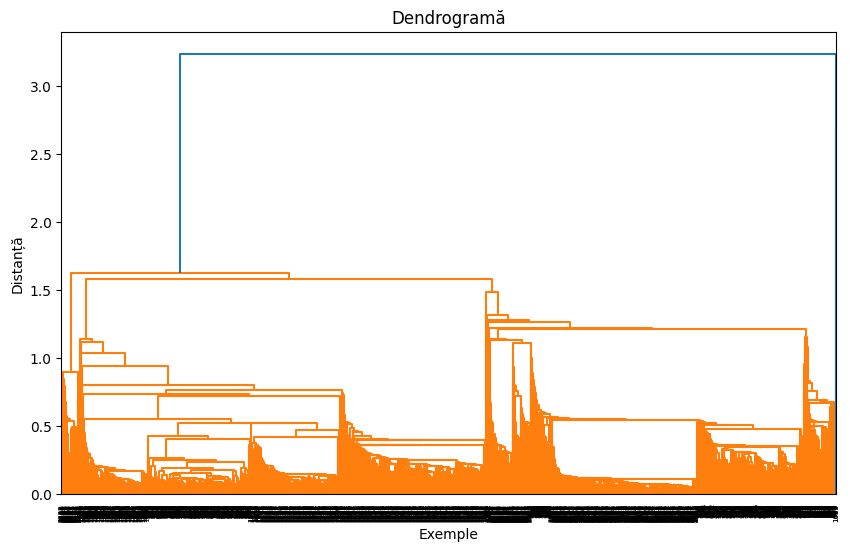

In [ ]:
### Single linkage

X = dataset_2d_10c.iloc[:, :2]
Y = dataset_2d_10c.iloc[:, 2]

Z = linkage(X, method='single')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

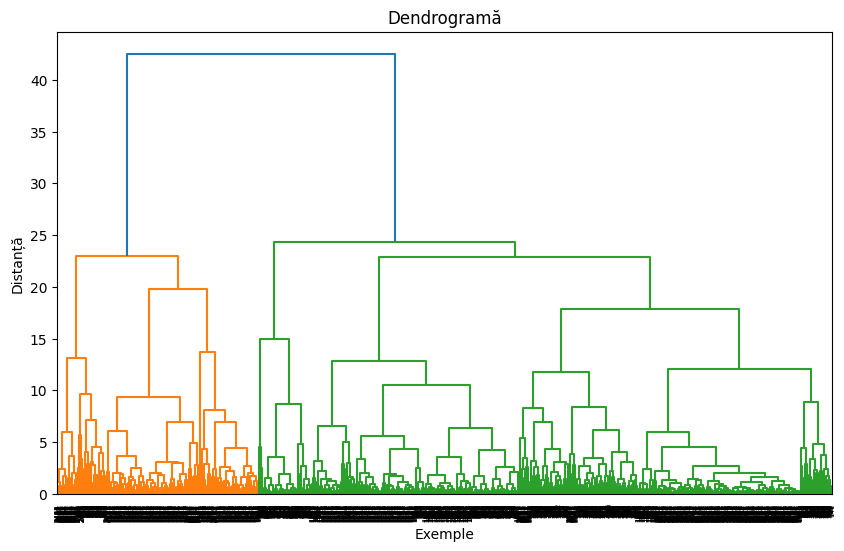

In [ ]:
### Complete linkage

X = dataset_2d_10c.iloc[:, :2]
Y = dataset_2d_10c.iloc[:, 2]

Z = linkage(X, method='complete')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

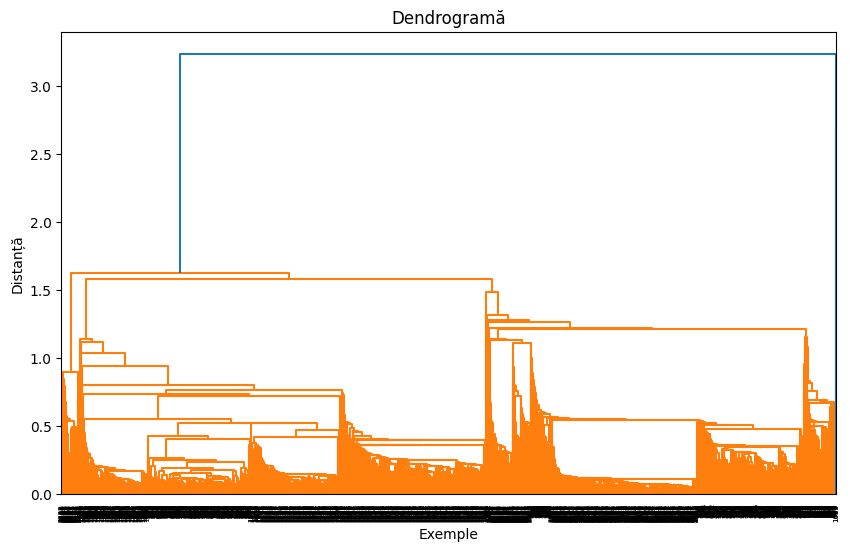

In [ ]:
### Average linkage

X = dataset_2d_10c.iloc[:, :2]
Y = dataset_2d_10c.iloc[:, 2]

Z = linkage(X, method='average')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

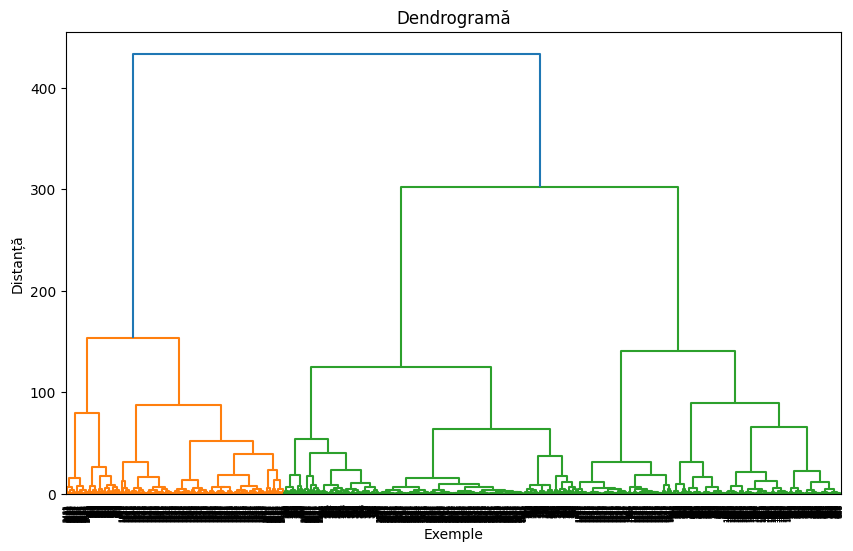

In [ ]:
### Ward linkage

X = dataset_2d_10c.iloc[:, :2]
Y = dataset_2d_10c.iloc[:, 2]

Z = linkage(X, method='ward')

plt.figure(figsize=(10, 6))
dendrogram(Z)
plt.xlabel('Exemple')
plt.ylabel('Distanță')
plt.title('Dendrogramă')
plt.show()

*Internal clustering evaluation index*

Iris dataset

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[0.6808136202936816, 0.5525919445499757, 0.4978256901095472, 0.4885175508886279, 0.36820569682713084, 0.35804757929255665, 0.34981444615768653, 0.33688373190056453, 0.31119933867792554]


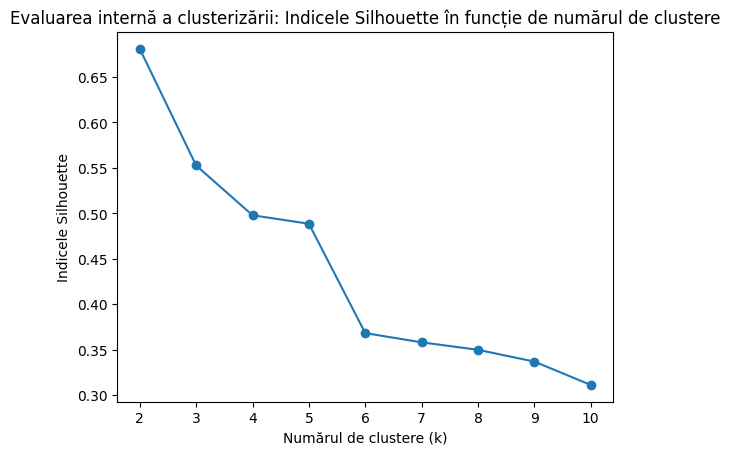

In [ ]:
from sklearn.metrics import silhouette_score

X = iris.iloc[:, :4]
Y = iris.iloc[:, 4]

silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

print(silhouette_scores)

plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Indicele Silhouette')
plt.title('Evaluarea internă a clusterizării: Indicele Silhouette în funcție de numărul de clustere')
plt.show()

### În general, valoarea maximă a indiceului Silhouette este obținută pentru 2 clustere,
### ceea ce sugerează că acesta ar putea fi numărul natural de clustere pentru setul de date Iris.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[0.6294675561906644, 0.5043188549150884, 0.4446273300650682, 0.351912893247111, 0.34582095755361586, 0.34196609995581145, 0.33093221802606315, 0.3225306779505324, 0.33109071568968035]


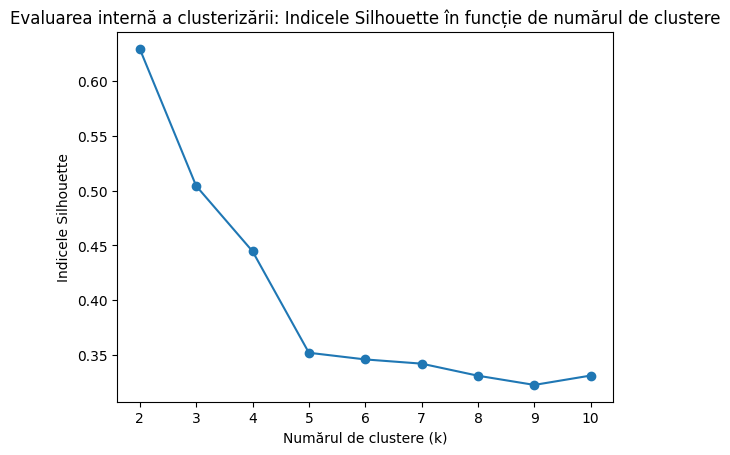

In [ ]:
from sklearn.metrics import silhouette_score

X = iris.iloc[:, :4]
X = MinMaxScaler().fit_transform(X)
Y = iris.iloc[:, 4]

silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

print(silhouette_scores)

plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Indicele Silhouette')
plt.title('Evaluarea internă a clusterizării: Indicele Silhouette în funcție de numărul de clustere')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[0.4856963157004019, 0.5282850644656755, 0.5258012352084065, 0.5229595423161736, 0.5139488190278974, 0.4966389781872991, 0.5201690779969551, 0.540557976151597, 0.551594435492415, 0.5498908290789255, 0.560208809335416, 0.5481517474596574, 0.5543849660867917]


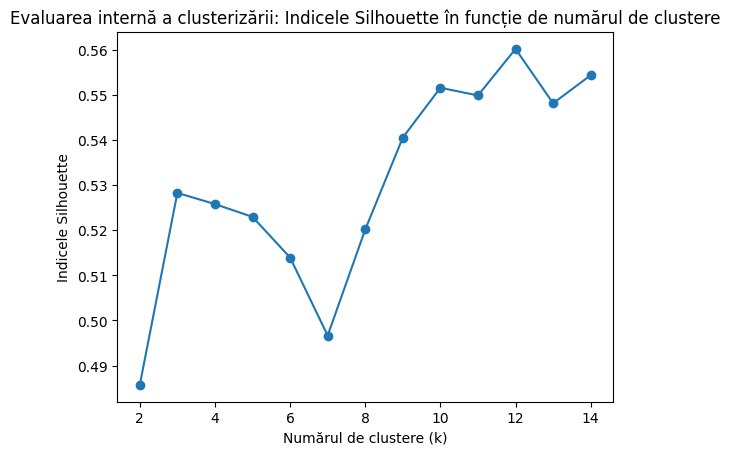

In [ ]:
from sklearn.metrics import silhouette_score

X = dataset_2d_10c.iloc[:, :2]
Y = dataset_2d_10c.iloc[:, 2]

silhouette_scores = []
k_values = range(2, 15)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

print(silhouette_scores)

plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Indicele Silhouette')
plt.title('Evaluarea internă a clusterizării: Indicele Silhouette în funcție de numărul de clustere')
plt.show()

### În general, valoarea maximă a indiceului Silhouette este obținută pentru 2 clustere,
### ceea ce sugerează că acesta ar putea fi numărul natural de clustere pentru setul de date Iris.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

[0.5113551032280357, 0.5562744572918812, 0.5041971152808896, 0.5418790641430573, 0.5206546944895728, 0.5490850653173597, 0.5662033554659012, 0.5457039776804058, 0.5558418761752335, 0.5748318100425137, 0.5925365404336367, 0.5852710652624674, 0.5836280718932959]


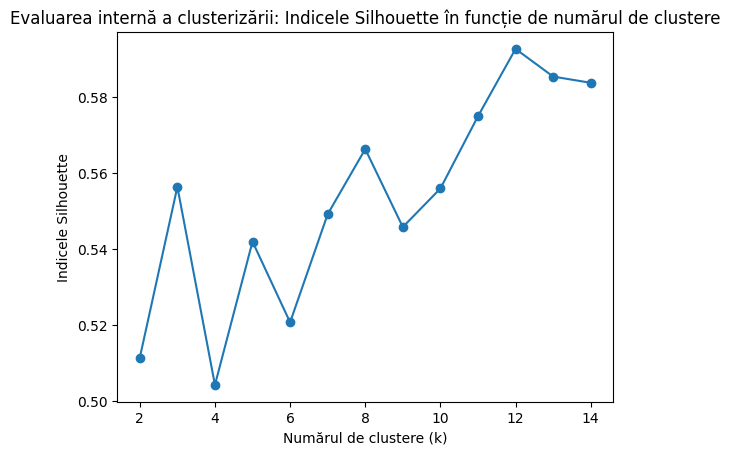

In [ ]:
from sklearn.metrics import silhouette_score

X = dataset_2d_10c.iloc[:, :2]
X = MinMaxScaler().fit_transform(X)
Y = dataset_2d_10c.iloc[:, 2]

silhouette_scores = []
k_values = range(2, 15)

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

print(silhouette_scores)

plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Numărul de clustere (k)')
plt.ylabel('Indicele Silhouette')
plt.title('Evaluarea internă a clusterizării: Indicele Silhouette în funcție de numărul de clustere')
plt.show()

**Task 3 - Airlines Delay**

In [ ]:
### Read the airline dataset csv and print the tabel(some lines)

airlines = pd.read_csv("airlines_delay.csv")
airlines = airlines.drop(airlines.select_dtypes(include=['object']).columns, axis = 1)
airlines = airlines.drop(['Flight'], axis = 1)
airlines.head()

,Time,Length,DayOfWeek,Class
0,1296.0,141.0,1,0
1,360.0,146.0,4,0
2,1170.0,143.0,3,0
3,1410.0,344.0,6,0
4,692.0,98.0,4,0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Adjusted Rand Index: 0.0017569917065040218


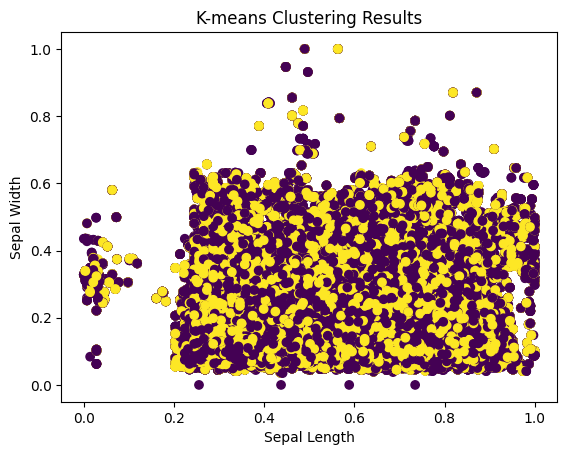

In [ ]:
def k_means(scaler, max_iter, k):

  X = airlines.iloc[:, :3]
  Y = airlines.iloc[:, 3]

  X_scaled = scaler.fit_transform(X)

  kmeans = KMeans(n_clusters=k, random_state=42, max_iter = max_iter)
  kmeans.fit(X_scaled)

  labels = kmeans.labels_

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('K-means Clustering Results')
  plt.show()

k_means(MinMaxScaler(), 300, 2)

Adjusted Rand Index: 0.006119131191068858


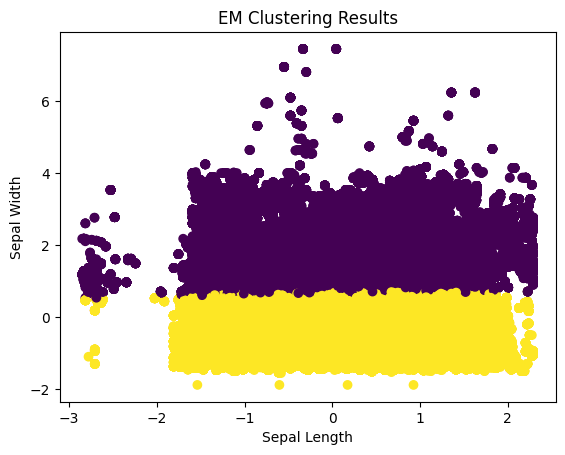

In [ ]:
def em(scaler, max_iter, k):

  X = airlines.iloc[:, :3]
  Y = airlines.iloc[:, 3]

  X_scaled = scaler.fit_transform(X)

  em = GaussianMixture(n_components=k, random_state=42, max_iter = max_iter)
  em.fit(X_scaled)

  labels = em.predict(X_scaled)

  ari = adjusted_rand_score(Y, labels)
  print("Adjusted Rand Index:", ari)

  plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels)
  plt.xlabel('Sepal Length')
  plt.ylabel('Sepal Width')
  plt.title('EM Clustering Results')
  plt.show()

em(StandardScaler(), 300, 2)